# **Sound classification using Neural Networks**

### General information:
**Subject:** Machine Learning II

**Class:** CC3043 - PL1

**Work carried out by:** Hugo Duarte de Sousa,  Mariana de Sousa Serralheiro, Tiago Lemos Silva

### Project outline:



1) Data extraction using the Librosa library
2) Exploratory data analysis and data cleaning
3) Model architecture and hypertuning
5) Model training 
6) Conslution and obersvations


--------------------------------------------------------
---------------------------------------------------------

## **Project's main objective**

The objective of this project is to use the python library Librosa to extract features from the UltraSound8k dataset, train a neural network accordingly and justify the choices made.

This project we will have 4 CNN models to compare the difference in augmented data, difference in architecture and difference in the weights initialization.

#### Extra information:
- Link to Librosa documentation: https://librosa.org/doc/0.11.0/index.html
- Link to Pytorch Documentation: https://docs.pytorch.org/docs/stable/index.html
- Link to PyTorch InceptionV3: https://docs.pytorch.org/vision/main/models/inception.html
- Link to install dataset: https://urbansounddataset.weebly.com/download-urbansound8k.html
- Code to install dataset:



```python

import soundata

def download_dataset():
    dataset = soundata.initialize('urbansound8k')
    dataset.download()  # download the dataset
    dataset.validate()  # validate that all the expected files are there

    example_clip = dataset.choice_clip()  # choose a random example clip
    print(example_clip)  # see the available data

download_dataset()


-------------------------------------------------
-------------------------------------------------

# **Feature extraction**

## Extraction process for the CNN


This part covers the extraction method used to create the dataset that served as the input for the CNN, for this project, we used Mel-Spectrogram, which is a visual representation of an audio signal's frequency over time

- ### 1) Import libraries 

In [ ]:
import librosa
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sys
import os
from tqdm import tqdm

print("Libraries imported successfully")

- ### 2) Configuration

Configure which fold to extract

In [ ]:
target_fold = 10     # Specify which fold to extract from

# Directory paths
DATA_DIR = './data/sound_datasets/urbansound8k/'
PROCESSED_DIR = './data/processed/'
METADATA_PATH = os.path.join(DATA_DIR, 'metadata/UrbanSound8K.csv')
AUDIO_DIR = os.path.join(DATA_DIR, 'audio/fold' + str(target_fold))

# Output directories
#...
#...
MELSPEC_DIR = os.path.join(PROCESSED_DIR, 'melspecs/fold' + str(target_fold))
MELSPECT_OUTPUT_METADATA_CSV = os.path.join(PROCESSED_DIR, f'melspec_metadata_fold{target_fold}.csv')

# Create output directories if they don't exist
os.makedirs(MELSPEC_DIR, exist_ok=True)

# Mel spectrogram parameters
DURATION = 4  # seconds
SAMPLE_RATE = 22050
N_MELS = 128
N_FFT = 2048
HOP_LENGTH = 512

DURATION = 4  | Most files are 4 seconds,

SAMPLE_RATE = 22050 | Captures sound up to around 11kHz, most eviromental sound have important infromation below 11kHz.

N_MELS = 128 | 128 mel bands is a standard choice for audio classification. 

N_FFT = 2048 | Window size for fourier transform, given sample rate = 22050, fft= 2048 resulta 10.8 Hz por bin, ou ~93 ms de audio, also a common value

HOP_LENGTH = 512 | Step size between consecutive window. at 22050, ~ 23ms between frames, also a common value

To simplify our choices, we used the standard values to extract the data

- ### 3) Creating a Mel spectrogram from the audio file

In [ ]:
def extract_melspec(file_path, duration=DURATION, sr=SAMPLE_RATE, n_mels=N_MELS):
    """
    Extract mel spectrogram from audio file.
    Returns the mel spectrogram in dB scale and sample rate.
    """
    try:
        # Load audio with fixed duration
        y, sr = librosa.load(file_path, duration=duration, sr=sr)
        
        # Extract mel spectrogram
        mel_spec = librosa.feature.melspectrogram(
            y=y, 
            sr=sr, 
            n_mels=n_mels, 
            n_fft=N_FFT, 
            hop_length=HOP_LENGTH
        )
        
        # Convert to dB scale
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
        
        return mel_spec_db, sr
    
    except Exception as e:
        print(f"Error extracting from {file_path}: {e}")
        return None, None

def save_as_npy(mel_spec, output_path):
    """Save mel spectrogram as numpy array file."""
    try:
        np.save(output_path, mel_spec)
        return True
    except Exception as e:
        print(f"Error saving to {output_path}: {e}")
        return False



- ### 4) Save Mel Spctrograms into numpy arrays

In [ ]:
df = pd.read_csv(METADATA_PATH)
target_df = df[df['fold'] == target_fold]

print(f"Processing Fold {target_fold}")
print(f"Total files to process: {len(target_df)}")
print(f"Output directory: {MELSPEC_DIR}")
print("=" * 60)

# List to store metadata
metadata_list = []

# Process each audio file
for index, row in tqdm(target_df.iterrows(), total=len(target_df), desc=f"Processing Fold {target_fold}"):
    filename = row['slice_file_name']
    labelID = row['classID']
    label = row['class']
    fold = row['fold']
    
    # Construct file paths
    audio_path = os.path.join(AUDIO_DIR, filename)
    npy_filename = filename.replace('.wav', '.npy')
    npy_path = os.path.join(MELSPEC_DIR, npy_filename)
    
    # Extract mel spectrogram
    mel_spec, sr = extract_melspec(audio_path)
    
    if mel_spec is not None:
        # Save as .npy file (required for training)
        save_success = save_as_npy(mel_spec, npy_path)
        
        # Store metadata
        if save_success:
            metadata_list.append({
                'file_name': filename,
                'npy_file': npy_filename,
                'label': label,
                'labelID': labelID,
                'fold': fold,
                'shape': mel_spec.shape,
                'n_mels': mel_spec.shape[0],
                'n_frames': mel_spec.shape[1]
            })

# Save metadata

if metadata_list:
    metadata_df = pd.DataFrame(metadata_list)
    metadata_df.to_csv(MELSPECT_OUTPUT_METADATA_CSV, index=False)
    
    print("\n" + "=" * 60)
    print(f"✅ Extraction Complete!")
    print(f"Successfully processed: {len(metadata_df)} files")
    print(f"Mel spectrograms saved to: {MELSPEC_DIR}")
    print(f"Metadata saved to: {MELSPECT_OUTPUT_METADATA_CSV}")
    print(f"Mel spectrogram shape: ({N_MELS}, ~{metadata_df['n_frames'].mean():.0f})")
    print("=" * 60)
else:
    print("\n No features were successfully extracted. Check file paths and data integrity.")


if metadata_list:
    print("\nSample metadata:")
    print(metadata_df.head())
    print(f"\nClass distribution:")
    print(metadata_df['label'].value_counts())


-------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------

# **Exploratory Data Analysis and Data preprocessing**

## Exploratory Data Analysis

Visualize a file in mel spectrogram with matplotlib


Shape: (128, 97)
Min value: -80.00 dB
Max value: 0.00 dB


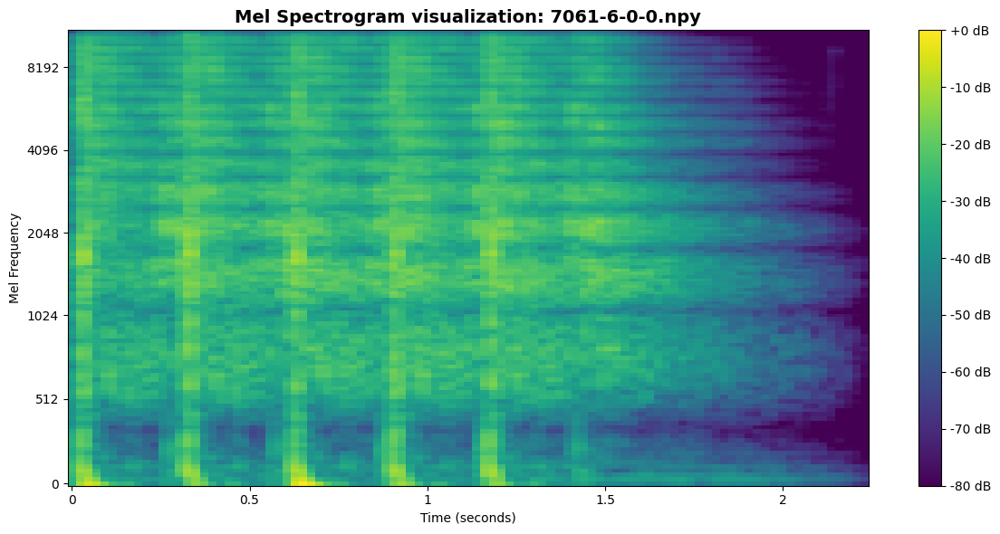

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display

# Load a mel spectrogram from fold 1
npy_dir = './data/processed/melspecs/fold1/'
filename = '7061-6-0-0.npy'
npy_file = npy_dir + filename
mel_spec = np.load(npy_file)

print(f"Shape: {mel_spec.shape}")
print(f"Min value: {mel_spec.min():.2f} dB")
print(f"Max value: {mel_spec.max():.2f} dB")

# Visualize
plt.figure(figsize=(12, 6))
librosa.display.specshow(mel_spec, 
                        sr=22050, 
                        hop_length=512, 
                        x_axis='time', 
                        y_axis='mel',
                        cmap='viridis')
plt.colorbar(format='%+2.0f dB')
plt.title(f'Mel Spectrogram visualization: {filename}',  fontsize=14, fontweight='bold')
plt.xlabel('Time (seconds)')
plt.ylabel('Mel Frequency')
plt.tight_layout()
plt.show()

## Data preprocessing

##### FOR CNN

Some files have shorter duration, which does not necessarily meet the input requirements of the convolution neural networks. There are several ways to fix this issue such as zero padding, tiling/looping and stretching. We chose tiling as it repeats the sound to match the required 4 seconds duration. This approach helps the neural network improve the ability to recognize the patterns. Unlike zero-padding, as the model could associate the long silence with a particular class and streching can change the pitch, distorting the original sound which is also not good for our model.

Lets visualize the same file, 7061-6-0-0.wav that has a duration of 2 seconds with tiling, zero padding and stretching respectively 


Tiling/looping

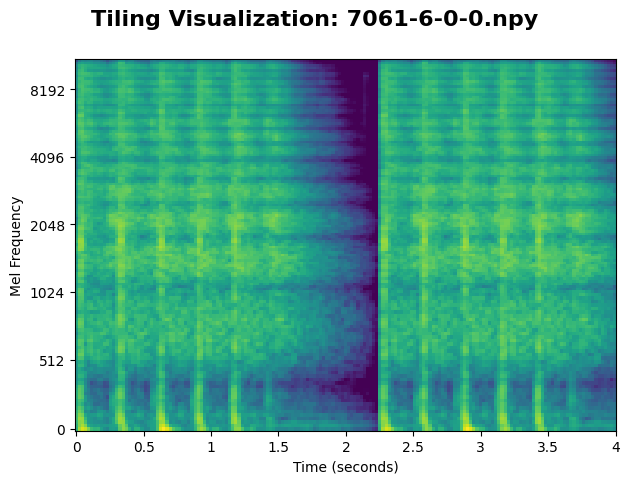

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display

# Load a mel spectrogram from fold 1
npy_dir = './data/processed/melspecs/fold1/'
filename = '7061-6-0-0.npy'
npy_file = npy_dir + filename
mel_spec_original = np.load(npy_file)

target_width = 173  # Target width for 4 seconds
current_width = mel_spec_original.shape[1]


if current_width < target_width:
    # Calculate how many times to repeat
    n_repeats = int(np.ceil(target_width / current_width))    
    # Tile/repeat the pattern
    mel_spec_tiled = np.tile(mel_spec_original, (1, n_repeats))
    
    # Truncate to exact target width
    mel_spec_tiled = mel_spec_tiled[:, :target_width]
    
elif current_width > target_width:
    mel_spec_tiled = mel_spec_original[:, :target_width]

else:
    mel_spec_tiled = mel_spec_original

# Tiled
img = librosa.display.specshow(mel_spec_tiled, 
                                sr=22050, 
                                hop_length=512, 
                                x_axis='time', 
                                y_axis='mel',
                                cmap='viridis')
plt.xlabel('Time (seconds)')
plt.ylabel('Mel Frequency')


plt.suptitle(f'Tiling Visualization: {filename}', 
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()

plt.show()


Zero padding

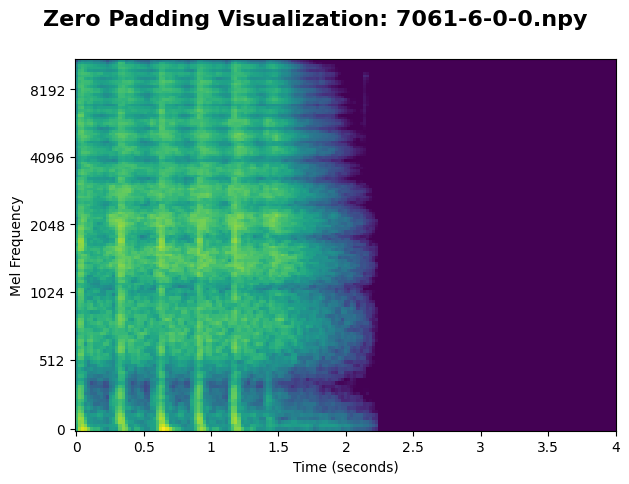

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display

# Load a mel spectrogram from fold 1
npy_dir = './data/processed/melspecs/fold1/'
filename = '7061-6-0-0.npy'
npy_file = npy_dir + filename
mel_spec_original = np.load(npy_file)

target_width = 173  # Target width for 4 seconds
current_width = mel_spec_original.shape[1]

# ZERO PADDING
if current_width < target_width:
    # Pad with zeros on the right
    pad_width = target_width - current_width
    mel_spec_padded = np.pad(mel_spec_original, 
                             ((0, 0), (0, pad_width)), 
                             mode='constant', 
                             constant_values=mel_spec_original.min())
elif current_width > target_width:
    mel_spec_padded = mel_spec_original[:, :target_width]
else:
    mel_spec_padded = mel_spec_original

# Visualize
img = librosa.display.specshow(mel_spec_padded, 
                                sr=22050, 
                                hop_length=512, 
                                x_axis='time', 
                                y_axis='mel',
                                cmap='viridis')

plt.xlabel('Time (seconds)')
plt.ylabel('Mel Frequency')

plt.suptitle(f'Zero Padding Visualization: {filename}', 
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()

plt.show()

Stretching

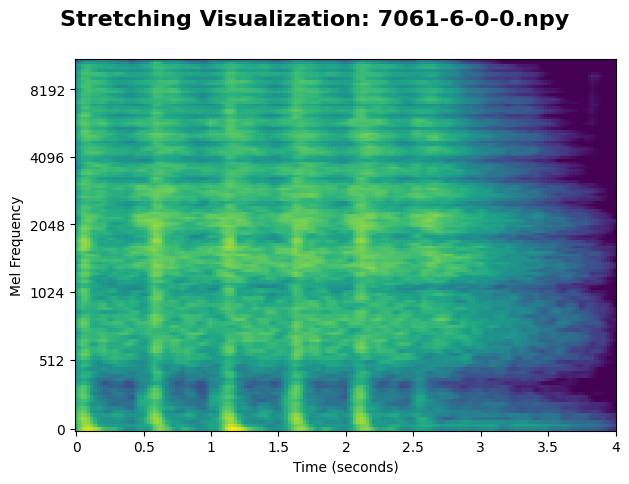

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
from scipy.ndimage import zoom

# Load a mel spectrogram from fold 1
npy_dir = './data/processed/melspecs/fold1/'
filename = '7061-6-0-0.npy'
npy_file = npy_dir + filename
mel_spec_original = np.load(npy_file)

target_width = 173  # Target width for 4 seconds
current_width = mel_spec_original.shape[1]

# STRETCHING (Time stretching using interpolation)
if current_width != target_width:
    # Calculate zoom factor for width dimension
    zoom_factor = target_width / current_width
    # Apply zoom only to time axis (axis=1), keep frequency axis unchanged (axis=0)
    mel_spec_stretched = zoom(mel_spec_original, (1, zoom_factor), order=1)
    # Ensure exact target width due to rounding
    if mel_spec_stretched.shape[1] != target_width:
        mel_spec_stretched = mel_spec_stretched[:, :target_width]
else:
    mel_spec_stretched = mel_spec_original

# Visualize
img = librosa.display.specshow(mel_spec_stretched, 
                                sr=22050, 
                                hop_length=512, 
                                x_axis='time', 
                                y_axis='mel',
                                cmap='viridis')

plt.xlabel('Time (seconds)')
plt.ylabel('Mel Frequency')

plt.suptitle(f'Stretching Visualization: {filename}',
             fontsize=16, fontweight='bold', y=1.00)
plt.tight_layout()

plt.show()

Visualization of a file tiled with input masking, supposed data for training

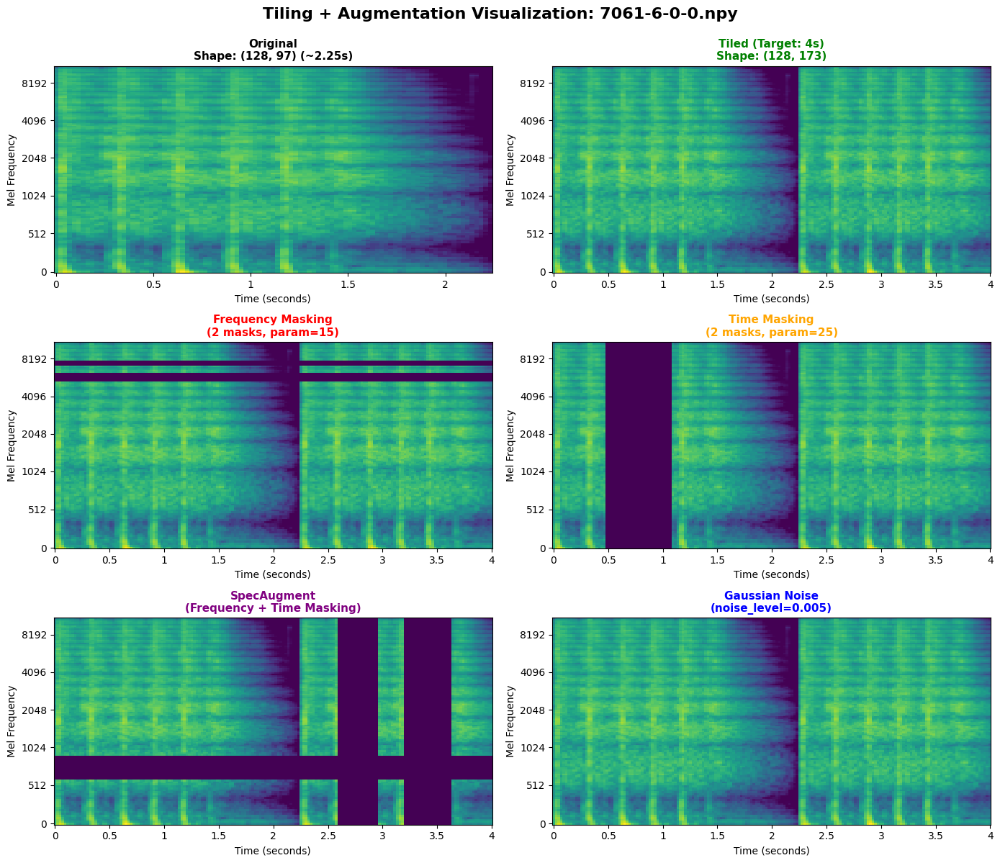

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display

# ===========================
# AUGMENTATION FUNCTIONS
# ===========================

def frequency_masking(mel_spec, freq_mask_param=15, n_masks=2):
    """Mask random frequency bands"""
    mel_spec_aug = mel_spec.copy()
    freq_size = mel_spec_aug.shape[0]
    
    for _ in range(n_masks):
        f = np.random.randint(0, freq_mask_param)
        f0 = np.random.randint(0, freq_size - f)
        mel_spec_aug[f0:f0+f, :] = mel_spec_aug.min()
    
    return mel_spec_aug


def time_masking(mel_spec, time_mask_param=25, n_masks=2):
    """Mask random time segments"""
    mel_spec_aug = mel_spec.copy()
    time_size = mel_spec_aug.shape[1]
    
    for _ in range(n_masks):
        t = np.random.randint(0, time_mask_param)
        t0 = np.random.randint(0, time_size - t)
        mel_spec_aug[:, t0:t0+t] = mel_spec_aug.min()
    
    return mel_spec_aug


def spec_augment(mel_spec, freq_mask_param=15, time_mask_param=25, 
                 n_freq_masks=2, n_time_masks=2):
    """Apply SpecAugment (frequency + time masking)"""
    mel_spec_aug = mel_spec.copy()
    mel_spec_aug = frequency_masking(mel_spec_aug, freq_mask_param, n_freq_masks)
    mel_spec_aug = time_masking(mel_spec_aug, time_mask_param, n_time_masks)
    return mel_spec_aug


def add_gaussian_noise(mel_spec, noise_level=0.005):
    """Add Gaussian noise"""
    noise = np.random.normal(0, noise_level, mel_spec.shape)
    return mel_spec + noise


def time_shift(mel_spec, shift_max=20):
    """Circular shift in time"""
    shift = np.random.randint(-shift_max, shift_max)
    return np.roll(mel_spec, shift, axis=1)


# ===========================
# LOAD AND PROCESS
# ===========================

# Load a mel spectrogram from fold 1
npy_dir = './data/processed/melspecs/fold1/'
filename = '7061-6-0-0.npy'
npy_file = npy_dir + filename
mel_spec_original = np.load(npy_file)

target_width = 173  # Target width for 4 seconds
current_width = mel_spec_original.shape[1]

# Apply tiling
if current_width < target_width:
    n_repeats = int(np.ceil(target_width / current_width))    
    mel_spec_tiled = np.tile(mel_spec_original, (1, n_repeats))
    mel_spec_tiled = mel_spec_tiled[:, :target_width]
elif current_width > target_width:
    mel_spec_tiled = mel_spec_original[:, :target_width]
else:
    mel_spec_tiled = mel_spec_original

# Apply different augmentations
mel_spec_freq_masked = frequency_masking(mel_spec_tiled, freq_mask_param=15, n_masks=2)
mel_spec_time_masked = time_masking(mel_spec_tiled, time_mask_param=25, n_masks=2)
mel_spec_spec_augment = spec_augment(mel_spec_tiled, freq_mask_param=15, 
                                     time_mask_param=25, n_freq_masks=2, n_time_masks=2)
mel_spec_noisy = add_gaussian_noise(mel_spec_tiled, noise_level=0.005)
mel_spec_shifted = time_shift(mel_spec_tiled, shift_max=20)

# ===========================
# VISUALIZATION
# ===========================

fig, axes = plt.subplots(3, 2, figsize=(14, 12))

# Original (before tiling)
librosa.display.specshow(mel_spec_original, 
                        sr=22050, 
                        hop_length=512, 
                        x_axis='time', 
                        y_axis='mel',
                        cmap='viridis',
                        ax=axes[0, 0])
axes[0, 0].set_title(f'Original\nShape: {mel_spec_original.shape} '
                     f'(~{mel_spec_original.shape[1] * 512 / 22050:.2f}s)', 
                     fontsize=11, fontweight='bold')
axes[0, 0].set_xlabel('Time (seconds)')
axes[0, 0].set_ylabel('Mel Frequency')

# Tiled
librosa.display.specshow(mel_spec_tiled, 
                        sr=22050, 
                        hop_length=512, 
                        x_axis='time', 
                        y_axis='mel',
                        cmap='viridis',
                        ax=axes[0, 1])
axes[0, 1].set_title(f'Tiled (Target: 4s)\nShape: {mel_spec_tiled.shape}', 
                     fontsize=11, fontweight='bold', color='green')
axes[0, 1].set_xlabel('Time (seconds)')
axes[0, 1].set_ylabel('Mel Frequency')

# Frequency Masking
librosa.display.specshow(mel_spec_freq_masked, 
                        sr=22050, 
                        hop_length=512, 
                        x_axis='time', 
                        y_axis='mel',
                        cmap='viridis',
                        ax=axes[1, 0])
axes[1, 0].set_title('Frequency Masking\n(2 masks, param=15)', 
                     fontsize=11, fontweight='bold', color='red')
axes[1, 0].set_xlabel('Time (seconds)')
axes[1, 0].set_ylabel('Mel Frequency')

# Time Masking
librosa.display.specshow(mel_spec_time_masked, 
                        sr=22050, 
                        hop_length=512, 
                        x_axis='time', 
                        y_axis='mel',
                        cmap='viridis',
                        ax=axes[1, 1])
axes[1, 1].set_title('Time Masking\n(2 masks, param=25)', 
                     fontsize=11, fontweight='bold', color='orange')
axes[1, 1].set_xlabel('Time (seconds)')
axes[1, 1].set_ylabel('Mel Frequency')

# SpecAugment (Freq + Time)
librosa.display.specshow(mel_spec_spec_augment, 
                        sr=22050, 
                        hop_length=512, 
                        x_axis='time', 
                        y_axis='mel',
                        cmap='viridis',
                        ax=axes[2, 0])
axes[2, 0].set_title('SpecAugment\n(Frequency + Time Masking)', 
                     fontsize=11, fontweight='bold', color='purple')
axes[2, 0].set_xlabel('Time (seconds)')
axes[2, 0].set_ylabel('Mel Frequency')

# Gaussian Noise
librosa.display.specshow(mel_spec_noisy, 
                        sr=22050, 
                        hop_length=512, 
                        x_axis='time', 
                        y_axis='mel',
                        cmap='viridis',
                        ax=axes[2, 1])
axes[2, 1].set_title('Gaussian Noise\n(noise_level=0.005)', 
                     fontsize=11, fontweight='bold', color='blue')
axes[2, 1].set_xlabel('Time (seconds)')
axes[2, 1].set_ylabel('Mel Frequency')

plt.suptitle(f'Tiling + Augmentation Visualization: {filename}', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()

plt.show()

### **Class distribution**

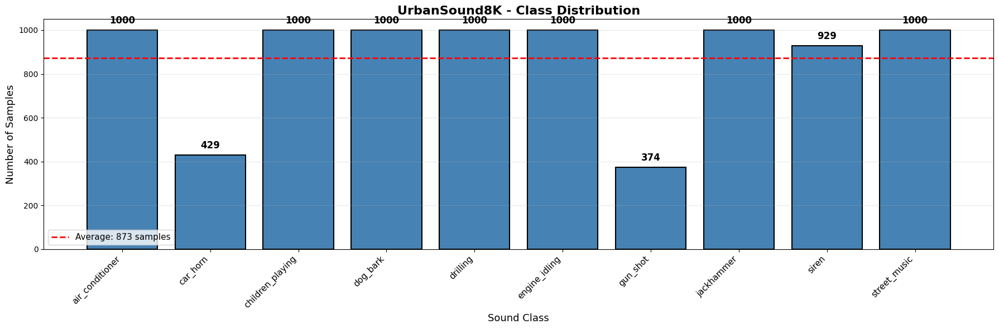

In [10]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Load the original metadata
df = pd.read_csv('./data/sound_datasets/urbansound8k/metadata/UrbanSound8K.csv')

# Class names
class_names = [
    'air_conditioner',  # 0
    'car_horn',         # 1
    'children_playing', # 2
    'dog_bark',         # 3
    'drilling',         # 4
    'engine_idling',    # 5
    'gun_shot',         # 6
    'jackhammer',       # 7
    'siren',            # 8
    'street_music'      # 9
]

# Count samples per class
class_counts = df['classID'].value_counts().sort_index()

# Create visualization
fig, axes = plt.subplots(1, 1, figsize=(18, 6))

# Bar chart
ax1 = axes
bars = ax1.bar(range(10), class_counts.values, color='steelblue', edgecolor='black', linewidth=1.5)
ax1.set_title('UrbanSound8K - Class Distribution', fontsize=16, fontweight='bold')
ax1.set_xlabel('Sound Class', fontsize=13)
ax1.set_ylabel('Number of Samples', fontsize=13)
ax1.set_xticks(range(10))
ax1.set_xticklabels(class_names, rotation=45, ha='right', fontsize=11)
ax1.grid(True, alpha=0.3, axis='y')

# Add value labels on bars
for i, (bar, count) in enumerate(zip(bars, class_counts.values)):
    ax1.text(bar.get_x() + bar.get_width()/2, count + 20, 
            str(count), ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add horizontal line for average
avg_samples = class_counts.mean()
ax1.axhline(y=avg_samples, color='red', linestyle='--', linewidth=2, 
           label=f'Average: {avg_samples:.0f} samples')
ax1.legend(fontsize=11)

plt.tight_layout()
plt.show()



Given the class 'car_horn' and 'gun_shot' are the minority class, 429 and 374 samples compared to the average 873 samples per category, we will need to use some data augmentation techniques to balance that out.

One of the techniques is input masking, as it will cover parts of the spectrogram to create new data for the model, forcing it to learn more robust features rather than memorizing specific time-frequency patterns.

### input masking function

In [11]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm

# ===========================
# AUGMENTATION FUNCTIONS
# ===========================

def frequency_masking(mel_spec, freq_mask_param=15, n_masks=2):
    """Mask random frequency bands"""
    mel_spec_aug = mel_spec.copy()
    freq_size = mel_spec_aug.shape[0]
    
    for _ in range(n_masks):
        f = np.random.randint(0, freq_mask_param)
        f0 = np.random.randint(0, freq_size - f)
        mel_spec_aug[f0:f0+f, :] = mel_spec_aug.min()
    
    return mel_spec_aug


def time_masking(mel_spec, time_mask_param=25, n_masks=2):
    """Mask random time segments"""
    mel_spec_aug = mel_spec.copy()
    time_size = mel_spec_aug.shape[1]
    
    for _ in range(n_masks):
        t = np.random.randint(0, time_mask_param)
        t0 = np.random.randint(0, time_size - t)
        mel_spec_aug[:, t0:t0+t] = mel_spec_aug.min()
    
    return mel_spec_aug


def spec_augment(mel_spec, freq_mask_param=15, time_mask_param=25, 
                 n_freq_masks=2, n_time_masks=2):
    """Apply SpecAugment (frequency + time masking)"""
    mel_spec_aug = mel_spec.copy()
    mel_spec_aug = frequency_masking(mel_spec_aug, freq_mask_param, n_freq_masks)
    mel_spec_aug = time_masking(mel_spec_aug, time_mask_param, n_time_masks)
    return mel_spec_aug


def add_gaussian_noise(mel_spec, noise_level=0.005):
    """Add Gaussian noise"""
    noise = np.random.normal(0, noise_level, mel_spec.shape)
    return mel_spec + noise


def time_shift(mel_spec, shift_max=20):
    """Circular shift in time"""
    shift = np.random.randint(-shift_max, shift_max)
    return np.roll(mel_spec, shift, axis=1)



### Tiling function

In [6]:
def load_and_tile(dataframe, target_width=173):
    """Load .npy files and tile to target width"""
    X = []
    y = []
    
    for _, row in tqdm(dataframe.iterrows(), total=len(dataframe), desc="Loading & tiling"):
        mel_spec = np.load(row['npy_path'])
        current_width = mel_spec.shape[1]
        
        # Tile or truncate
        if current_width < target_width:
            n_repeats = int(np.ceil(target_width / current_width))
            mel_spec = np.tile(mel_spec, (1, n_repeats))[:, :target_width]
        elif current_width > target_width:
            mel_spec = mel_spec[:, :target_width]
        
        # Add channel dimension
        mel_spec = np.expand_dims(mel_spec, axis=-1)
        X.append(mel_spec)
        y.append(row['label_encoded'])
    
    return np.array(X), np.array(y)


### Save the processed data 

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm

training_folds = [1, 2, 3, 4, 5, 6, 7, 8]
all_dfs = []

print("Loading training folds...")
for fold_num in training_folds:
    df = pd.read_csv(f'./data/processed/melspec_metadata_fold{fold_num}.csv')
    df['fold'] = fold_num
    df['npy_path'] = df['npy_file'].apply(
        lambda x: f'./data/processed/melspecs/fold{fold_num}/{x}'
    )
    all_dfs.append(df)
    print(f"  Fold {fold_num}: {len(df)} samples")

# Combine all training folds
df_train = pd.concat(all_dfs, ignore_index=True)

# Encode labels
label_encoder = LabelEncoder()
df_train['label_encoded'] = label_encoder.fit_transform(df_train['label'])

print(f"\nTotal training samples: {len(df_train)}")

# Define class names
label_classes = label_encoder.classes_.tolist()
print(f"Classes: {label_classes}")

# ===========================
# LOAD AND TILE
# ===========================


# Load training data
X_train, y_train = load_and_tile(df_train, target_width=173)

print(f"\nX_train: {X_train.shape}")
print(f"y_train: {y_train.shape}")

print('=' * 60)
print("ORIGINAL CLASS DISTRIBUTION:")
print('=' * 60)
class_counts = pd.Series(y_train).value_counts().sort_index()
for class_id, count in class_counts.items():
    print(f"{label_classes[class_id]:<20} (ID: {class_id}): {count:>5} samples")
print('=' * 60)

# ===========================
# IDENTIFY MINORITY CLASSES AND AUGMENT
# ===========================
# Find the maximum class count (target for balancing)
max_count = class_counts.max()
print(f"\nTarget count per class: {max_count}")

# Identify which classes need augmentation and how much
minority_classes = []
augmentation_needed = {}

for class_id, count in class_counts.items():
    if count < max_count:
        minority_classes.append(class_id)
        samples_needed = max_count - count
        augmentation_needed[class_id] = samples_needed

# ===========================
# AUGMENT EACH MINORITY CLASS
# ===========================
X_augmented_all = []
y_augmented_all = []

for class_id in tqdm(minority_classes, desc="Augmenting minority classes"):
    # Get samples from this class
    class_mask = (y_train == class_id)
    X_class = X_train[class_mask]
    y_class = y_train[class_mask]
    
    samples_needed = augmentation_needed[class_id]
    n_original = len(X_class)
    
    # Calculate how many augmentations per sample we need
    n_augmentations_per_sample = int(np.ceil(samples_needed / n_original))
    
    # Create augmented samples
    augmented_count = 0
    for i in range(len(X_class)):
        mel_spec = X_class[i, :, :, 0]  # Remove channel dimension
        
        # Create multiple augmentations of this sample
        for _ in range(n_augmentations_per_sample):
            if augmented_count >= samples_needed:
                break
            
            # Apply random augmentation strategy
            aug_choice = np.random.choice(['specaugment', 'noise', 'time_shift', 'all'])
            
            mel_spec_aug = mel_spec.copy()
            
            if aug_choice == 'specaugment':
                mel_spec_aug = spec_augment(mel_spec_aug, 
                                           freq_mask_param=15, 
                                           time_mask_param=25,
                                           n_freq_masks=2, 
                                           n_time_masks=2)
            elif aug_choice == 'noise':
                mel_spec_aug = add_gaussian_noise(mel_spec_aug, noise_level=0.005)
            elif aug_choice == 'time_shift':
                mel_spec_aug = time_shift(mel_spec_aug, shift_max=20)
            else:  # 'all'
                mel_spec_aug = spec_augment(mel_spec_aug, 15, 25, 2, 2)
                mel_spec_aug = add_gaussian_noise(mel_spec_aug, noise_level=0.003)
                if np.random.rand() > 0.5:
                    mel_spec_aug = time_shift(mel_spec_aug, shift_max=15)
            
            # Add channel dimension back and append
            X_augmented_all.append(np.expand_dims(mel_spec_aug, axis=-1))
            y_augmented_all.append(class_id)
            augmented_count += 1
        
        if augmented_count >= samples_needed:
            break

# Convert to arrays
X_augmented_all = np.array(X_augmented_all)
y_augmented_all = np.array(y_augmented_all)

print(f"\n\nTotal augmented samples created: {len(X_augmented_all)}")

# ===========================
# COMBINE ORIGINAL + AUGMENTED
# ===========================

X_train_balanced = np.concatenate([X_train, X_augmented_all], axis=0)
y_train_balanced = np.concatenate([y_train, y_augmented_all], axis=0)

print(f"\nX_train_balanced: {X_train_balanced.shape}")
print(f"y_train_balanced: {y_train_balanced.shape}")

# ===========================
# SHOW NEW DISTRIBUTION
# ===========================
print('\n' + '=' * 60)
print("BALANCED CLASS DISTRIBUTION:")
print('=' * 60)
balanced_counts = pd.Series(y_train_balanced).value_counts().sort_index()
for class_id, count in balanced_counts.items():
    original = class_counts[class_id]
    added = count - original
    print(f"{label_classes[class_id]:<20} (ID: {class_id}): {count:>5} samples " +
          f"(original: {original}, augmented: {added})")
print('=' * 60)


# ===========================
# SAVE PROCESSED DATA
# ===========================
print("\nSaving balanced training data...")
np.save('./data/processed/training_set/X_train.npy', X_train_balanced)
np.save('./data/processed/training_set/y_train.npy', y_train_balanced)
np.save('./data/processed/training_set/label_encoder_classes.npy', label_encoder.classes_)




-------------------------------------------------------------------------------------
-------------------------------------------------------------------------------------

# **Model Architecture and Hypertuning**

## **Convolution Neural Network**

A convolution Neural Network can identify patterns witihn an image, convering the audio file into Mel-Spectrogram allows us to use a CNN to identify certain patterns that occurs in the same class.

We prepared three models, one is a Custom CNN model with four blocks and two fully connected layers, a inception model without pre-trained weights, and a pre-trained inception model imported from inception initialized with the imangeNet weights.

We will be comparing model's overall accuracy, the accuracy of each class and the most confusing pairs for the model.
We can also indirectly compare the difference between architecture and the affects of having pre-trained weights.

Some regulization techniques used:

- L2 regularization - punish large weights
- Batch normalization - Normalizes the output of a layer to have a mean of 0 and standard deviation of 1
- Dropout - To prevent overfitting by switching some neurons off to increase robustness 
- Early stopping - Stops the training process if the evaluation metric has not improved by much after a certain ammount of epochs (10 for inception, 20 for custom CNN)
- Reduce Learning Rate on plateu - Reduces the learning rate if the accuracy is not improving by much
- Initial learning rate: 0.001
- Epochs: 200 for custom cnn, 100 for inception 
- Seeds selected: [42, 0, 1]

### **Set up call backs for the models  [Early stopping]**

In [1]:
import torch
import torch.nn as nn
from torch.optim.lr_scheduler import ReduceLROnPlateau

class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=10, verbose=True, delta=0, path=''):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = float('inf')
        self.delta = delta
        self.path = path
        self.best_model_state = None
        
    def __call__(self, val_loss, model):
        score = -val_loss
        
        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0
            
    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decreases.'''
        if self.verbose:
            print(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}). Saving model to {self.path}')
        torch.save(model.state_dict(), self.path)
        self.best_model_state = model.state_dict().copy()
        self.val_loss_min = val_loss
        
    def load_best_weights(self, model):
        '''Load the best model weights'''
        if self.best_model_state is not None:
            model.load_state_dict(self.best_model_state)
            if self.verbose:
                print('Loaded best model weights')

### **Custom CNN model (valina)**

Define the CNN model

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CustomCNN(nn.Module):
    def __init__(self, num_classes=10):
        super(CustomCNN, self).__init__()
        
        # Block 1
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout1 = nn.Dropout2d(0.4)
        
        # Block 2
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(128)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout2 = nn.Dropout2d(0.5)
        
        # Block 3
        self.conv3 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.dropout3 = nn.Dropout2d(0.5)
        
        # Block 4 (you called it Block 5)
        self.conv4 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=3, padding=1)
        self.bn4 = nn.BatchNorm2d(512)
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        
        # MLP (Fully Connected Layers)
        self.fc1 = nn.Linear(512, 256)
        self.dropout4 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(256, 256)
        self.dropout5 = nn.Dropout(0.5)
        self.fc3 = nn.Linear(256, num_classes)
        
    def forward(self, x):
        # Block 1
        x = self.conv1(x)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.pool1(x)
        x = self.dropout1(x)
        
        # Block 2
        x = self.conv2(x)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.pool2(x)
        x = self.dropout2(x)
        
        # Block 3
        x = self.conv3(x)
        x = self.bn3(x)
        x = F.relu(x)
        x = self.pool3(x)
        x = self.dropout3(x)
        
        # Block 4
        x = self.conv4(x)
        x = self.bn4(x)
        x = F.relu(x)
        x = self.global_avg_pool(x)
        
        # Flatten
        x = x.view(x.size(0), -1)
        
        # MLP
        x = F.relu(self.fc1(x))
        x = self.dropout4(x)
        x = F.relu(self.fc2(x))
        x = self.dropout5(x)
        x = self.fc3(x)
        
        return x

# Create the model
custom_cnn = CustomCNN(num_classes=10)

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
# Add weight_decay parameter to your optimizer
optimizer = torch.optim.Adam(
    custom_cnn.parameters(), 
    lr=0.001,
    weight_decay=1e-4  # L2 regularization strength
)

# Setup callbacks
early_stopping = EarlyStopping(patience=20, 
                               verbose=True, 
                               path='checkpoint.pth')

# ReduceLROnPlateau is built into PyTorch
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=3,
    min_lr=1e-7,
)

# Move to GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
custom_cnn = custom_cnn.to(device)

print(custom_cnn)

CustomCNN(
  (conv1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout1): Dropout2d(p=0.4, inplace=False)
  (conv2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout2): Dropout2d(p=0.5, inplace=False)
  (conv3): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout3): Dropout2d(p=0.5, inplace=False)
  (conv4): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): Bat

Custom cnn model summary

In [14]:
from torchinfo import summary

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


print("\nMODEL ARCHITECTURE")
print("=" * 60)
print(summary(custom_cnn, 
        input_size=(1, 1, 128, 173),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]))
print("Will train the model with: ", device)
print("=" * 60)


MODEL ARCHITECTURE
Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
CustomCNN (CustomCNN)                         [1, 1, 128, 173]     [1, 10]              --                   True
├─Conv2d (conv1)                              [1, 1, 128, 173]     [1, 64, 128, 173]    640                  True
├─BatchNorm2d (bn1)                           [1, 64, 128, 173]    [1, 64, 128, 173]    128                  True
├─MaxPool2d (pool1)                           [1, 64, 128, 173]    [1, 64, 64, 86]      --                   --
├─Dropout2d (dropout1)                        [1, 64, 64, 86]      [1, 64, 64, 86]      --                   --
├─Conv2d (conv2)                              [1, 64, 64, 86]      [1, 128, 64, 86]     73,856               True
├─BatchNorm2d (bn2)                           [1, 128, 64, 86]     [1, 128, 64, 86]     256                  True
├─MaxPool2d (pool2)                           [1, 128, 64, 86]     

### **Inception V3 without pretrained weights**

Load the model

In [25]:
import torch
import torch.nn as nn
from torchvision.models import inception_v3
from torch.optim.lr_scheduler import ReduceLROnPlateau

# ============================================
# INCEPTION V3 MODEL INITIALIZATION (FROM SCRATCH - NO TRANSFER LEARNING)
# ============================================
print("\n" + "=" * 60)
print("INITIALIZING INCEPTION V3 MODEL (NO PRETRAINED WEIGHTS)")
print("=" * 60)

# Load InceptionV3 WITHOUT pretrained weights (train from scratch)
print("Loading InceptionV3 architecture (no pretrained weights)...")
inception_model = inception_v3(weights=None)  # Train from scratch!
print("✓ Model initialized with random weights")

# CRITICAL: Disable transform_input since we're using 1 channel (grayscale)
# The default transform expects 3 channels and will cause an IndexError
inception_model.transform_input = False

original_conv = inception_model.Conv2d_1a_3x3.conv

# Create new conv layer with 1 input channel
# NOTE: Since we're training from scratch, no need to average RGB weights
new_conv = nn.Conv2d(
    in_channels=1,  # Changed from 3 to 1
    out_channels=original_conv.out_channels,
    kernel_size=original_conv.kernel_size,
    stride=original_conv.stride,
    padding=original_conv.padding,
    bias=(original_conv.bias is not None)
)

# Initialize with default PyTorch initialization (Kaiming)
# This is done automatically when creating the layer
# No need to copy pretrained weights since we're training from scratch

# Replace the first conv layer
inception_model.Conv2d_1a_3x3.conv = new_conv

# Modify main classifier (MLP layers: 2048 → 1024 → 512 → 10)
num_features = inception_model.fc.in_features  # 2048
inception_model.fc = nn.Sequential(
    nn.Linear(num_features, 1024),  # 2048 → 1024
    nn.ReLU(),
    nn.Dropout(0.5),
    
    nn.Linear(1024, 512),           # 1024 → 512
    nn.ReLU(),
    nn.Dropout(0.5),
    
    nn.Linear(512, 10)              # 512 → 10 classes
)

# Modify auxiliary classifier (used during training)
if hasattr(inception_model, 'AuxLogits') and inception_model.AuxLogits is not None:
    num_aux_features = inception_model.AuxLogits.fc.in_features
    inception_model.AuxLogits.fc = nn.Linear(num_aux_features, 10)

# ============================================
# MODIFICATION 3: Add adaptive pooling for custom input size (128x173)
# ============================================

class InceptionV3Custom(nn.Module):
    def __init__(self, inception):
        super().__init__()
        self.adaptive_pool = nn.AdaptiveAvgPool2d((299, 299))
        self.inception = inception
    
    def forward(self, x):
        # Resize input to 299x299 (required by InceptionV3)
        x = self.adaptive_pool(x)
        return self.inception(x)

# Create model with noTF naming (no Transfer Learning)
inception_v3_model_noTF = InceptionV3Custom(inception_model)

# Move to device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
inception_v3_model_noTF = inception_v3_model_noTF.to(device)
print(f"✓ Model moved to device: {device}")

# All layers trainable (training from scratch)
for param in inception_v3_model_noTF.parameters():
    param.requires_grad = True

# ============================================
# OPTIMIZER AND LOSS SETUP
# ============================================
print("\nSetting up optimizer and loss function...")

# Loss function
criterion = nn.CrossEntropyLoss()

# Optimizer with L2 regularization - FIXED: using inception_v3_model_noTF
optimizer = torch.optim.Adam(
    inception_v3_model_noTF.parameters(),  # ← FIXED: was inception_v3_model
    lr=0.001,
    weight_decay=1e-4  # L2 regularization
)

# Learning rate scheduler
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=3,
    min_lr=1e-7,
)

# Early stopping (assumes EarlyStopping class is defined)
early_stopping = EarlyStopping(
    patience=10,
    verbose=True,
    path='Inception_no_TransferLearning.pth'  # Different path to avoid collision
)

print("✓ Optimizer: Adam (lr=0.001, weight_decay=1e-4)")
print("✓ Loss function: CrossEntropyLoss")
print("✓ Scheduler: ReduceLROnPlateau (factor=0.5, patience=3)")
print("✓ Early stopping: patience=10, path='Inception_no_TransferLearning.pth'")

# Set to training mode
inception_v3_model_noTF.train()



INITIALIZING INCEPTION V3 MODEL (NO PRETRAINED WEIGHTS)
Loading InceptionV3 architecture (no pretrained weights)...
✓ Model initialized with random weights
✓ Model moved to device: cuda

Setting up optimizer and loss function...
✓ Optimizer: Adam (lr=0.001, weight_decay=1e-4)
✓ Loss function: CrossEntropyLoss
✓ Scheduler: ReduceLROnPlateau (factor=0.5, patience=3)
✓ Early stopping: patience=10, path='Inception_no_TransferLearning.pth'


InceptionV3Custom(
  (adaptive_pool): AdaptiveAvgPool2d(output_size=(299, 299))
  (inception): Inception3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, 

Model Summary

In [26]:
print("\n" + "=" * 60)
print("MODEL SUMMARY")
print("=" * 60)

total_params = sum(p.numel() for p in inception_v3_model_noTF.parameters())
trainable_params = sum(p.numel() for p in inception_v3_model_noTF.parameters() if p.requires_grad)

print("\n" + "=" * 60)
print("MODEL ARCHITECTURE")
print("=" * 60)

try:
    from torchinfo import summary
    
    print(summary(
        inception_v3_model_noTF, 
        input_size=(1, 1, 128, 173),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
    ))
except ImportError:
    print("Note: Install torchinfo for detailed model summary: pip install torchinfo")
    print("\nModel structure:")
    print(f"  Input: (batch, 1, 128, 173)")
    print(f"  Output: (batch, 10)")
    print(f"  Total parameters: {total_params:,}")
    print(f"  Trainable parameters: {trainable_params:,}")



MODEL SUMMARY

MODEL ARCHITECTURE
Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
InceptionV3Custom (InceptionV3Custom)         [1, 1, 128, 173]     [1, 10]              --                   True
├─AdaptiveAvgPool2d (adaptive_pool)           [1, 1, 128, 173]     [1, 1, 299, 299]     --                   --
├─Inception3 (inception)                      [1, 1, 299, 299]     [1, 10]              2,565,386            True
│    └─BasicConv2d (Conv2d_1a_3x3)            [1, 1, 299, 299]     [1, 32, 149, 149]    --                   True
│    │    └─Conv2d (conv)                     [1, 1, 299, 299]     [1, 32, 149, 149]    288                  True
│    │    └─BatchNorm2d (bn)                  [1, 32, 149, 149]    [1, 32, 149, 149]    64                   True
│    └─BasicConv2d (Conv2d_2a_3x3)            [1, 32, 149, 149]    [1, 32, 147, 147]    --                   True
│    │    └─Conv2d (conv)                     [1, 

### **InceptionV3 with transfer learning**

Load the model from Pytorch

In [2]:
import torch
import torch.nn as nn
from torchvision.models import inception_v3, Inception_V3_Weights

# ============================================
# INCEPTION V3 MODEL INITIALIZATION
# ============================================
print("\n" + "=" * 60)
print("INITIALIZING INCEPTION V3 MODEL")
print("=" * 60)

# Load pretrained InceptionV3
print("Loading InceptionV3 with ImageNet weights...")
inception_model = inception_v3(weights=Inception_V3_Weights.IMAGENET1K_V1)

# CRITICAL: Disable transform_input since we're using 1 channel (grayscale)
# The default transform expects 3 channels and will cause an IndexError
inception_model.transform_input = False
print("✓ Disabled transform_input (not compatible with grayscale)")

# ============================================
# MODIFICATION 1: Change input from RGB (3 channels) to Grayscale (1 channel)
# ============================================
print("\nModifying input layer for grayscale (1 channel)...")
original_conv = inception_model.Conv2d_1a_3x3.conv

# Save original weights before modification
original_weight = original_conv.weight.data.clone()
original_bias = original_conv.bias.data.clone() if original_conv.bias is not None else None

# Create new conv layer with 1 input channel
new_conv = nn.Conv2d(
    in_channels=1,  # Changed from 3 to 1
    out_channels=original_conv.out_channels,
    kernel_size=original_conv.kernel_size,
    stride=original_conv.stride,
    padding=original_conv.padding,
    bias=(original_conv.bias is not None)
)

# Initialize by averaging RGB weights
with torch.no_grad():
    new_conv.weight.data = original_weight.mean(dim=1, keepdim=True)
    if original_bias is not None:
        new_conv.bias.data = original_bias

# Replace the first conv layer
inception_model.Conv2d_1a_3x3.conv = new_conv

print("✓ Successfully modified input to accept 1 channel (grayscale)")

# ============================================
# MODIFICATION 2: Change output from 1000 classes to 10 classes
# ============================================
print("\nModifying output layer for 10 classes...")

# Modify main classifier (MLP layers)
num_features = inception_model.fc.in_features
inception_model.fc = nn.Sequential(
    nn.Linear(num_features, 1024),  # 2048 → 1024
    nn.ReLU(),
    nn.Dropout(0.5),
    
    nn.Linear(1024, 512),           # 1024 → 512
    nn.ReLU(),
    nn.Dropout(0.5),
    
    nn.Linear(512, 10)              # 512 → 10 classes
)

# Modify auxiliary classifier (used during training)
if hasattr(inception_model, 'AuxLogits') and inception_model.AuxLogits is not None:
    num_aux_features = inception_model.AuxLogits.fc.in_features
    inception_model.AuxLogits.fc = nn.Linear(num_aux_features, 10)
    print("✓ Modified main classifier and auxiliary classifier to 10 classes")
else:
    print("✓ Modified main classifier to 10 classes")

# ============================================
# MODIFICATION 3: Add adaptive pooling for custom input size (128x173)
# ============================================
print("\nAdding adaptive pooling for input size 128x173...")

class InceptionV3Custom(nn.Module):
    """
    Wrapper for InceptionV3 that handles custom input sizes.
    Resizes input from (batch, 1, 128, 173) to (batch, 1, 299, 299) using adaptive pooling.
    """
    def __init__(self, inception):
        super().__init__()
        self.adaptive_pool = nn.AdaptiveAvgPool2d((299, 299))
        self.inception = inception
    
    def forward(self, x):
        # Resize input to 299x299 (required by InceptionV3)
        x = self.adaptive_pool(x)
        return self.inception(x)

# Wrap the model
inception_v3_model = InceptionV3Custom(inception_model)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
inception_v3_model = inception_v3_model.to(device)


# Freeze all layers
for param in inception_v3_model.parameters():
    param.requires_grad = False

# Unfreeze last 3 modules
for name, param in inception_model.named_parameters():
    if any(x in name for x in ['Mixed_7a', 'Mixed_7b', 'Mixed_7c', 'fc', 'AuxLogits']):
        param.requires_grad = True


# Set to eval mode for testing
inception_v3_model.eval()

# Optimizer and Regularization

# Loss function
criterion = nn.CrossEntropyLoss()

# Setup callbacks
early_stopping = EarlyStopping(
    patience=10,
    verbose=True,
    path='best_model_fold1.pth'
)



# Optimizer
optimizer = torch.optim.Adam(
    inception_v3_model.parameters(), 
    lr=0.001,
    weight_decay=1e-4  # ← L2 regularization added!
)

# ReduceLROnPlateau is built into PyTorch
scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=3,
    min_lr=1e-7,
)

# Set back to train mode
inception_v3_model.train()



INITIALIZING INCEPTION V3 MODEL
Loading InceptionV3 with ImageNet weights...
✓ Disabled transform_input (not compatible with grayscale)

Modifying input layer for grayscale (1 channel)...
✓ Successfully modified input to accept 1 channel (grayscale)

Modifying output layer for 10 classes...
✓ Modified main classifier and auxiliary classifier to 10 classes

Adding adaptive pooling for input size 128x173...


InceptionV3Custom(
  (adaptive_pool): AdaptiveAvgPool2d(output_size=(299, 299))
  (inception): Inception3(
    (Conv2d_1a_3x3): BasicConv2d(
      (conv): Conv2d(1, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2a_3x3): BasicConv2d(
      (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (Conv2d_2b_3x3): BasicConv2d(
      (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
    )
    (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (Conv2d_3b_1x1): BasicConv2d(
      (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, 

Model Summary

In [3]:
print("\n" + "=" * 60)
print("MODEL ARCHITECTURE")
print("=" * 60)

try:
    from torchinfo import summary
    
    print(summary(
        inception_v3_model, 
        input_size=(1, 1, 128, 173),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
    ))
except ImportError:
    print("Note: Install torchinfo for detailed model summary: pip install torchinfo")
    print("\nModel structure:")
    print(f"  Input: (batch, 1, 128, 173)")
    print(f"  Output: (batch, 10)")
    print(f"  Total parameters: {total_params:,}")
    print(f"  Trainable parameters: {trainable_params:,}")



MODEL ARCHITECTURE
Layer (type (var_name))                       Input Shape          Output Shape         Param #              Trainable
InceptionV3Custom (InceptionV3Custom)         [1, 1, 128, 173]     [1, 10]              --                   Partial
├─AdaptiveAvgPool2d (adaptive_pool)           [1, 1, 128, 173]     [1, 1, 299, 299]     --                   --
├─Inception3 (inception)                      [1, 1, 299, 299]     [1, 10]              2,565,386            Partial
│    └─BasicConv2d (Conv2d_1a_3x3)            [1, 1, 299, 299]     [1, 32, 149, 149]    --                   False
│    │    └─Conv2d (conv)                     [1, 1, 299, 299]     [1, 32, 149, 149]    (288)                False
│    │    └─BatchNorm2d (bn)                  [1, 32, 149, 149]    [1, 32, 149, 149]    (64)                 False
│    └─BasicConv2d (Conv2d_2a_3x3)            [1, 32, 149, 149]    [1, 32, 147, 147]    --                   False
│    │    └─Conv2d (conv)                     [1, 32, 1

-----------------------------------------------------------------
-----------------------------------------------------------------
# **Model training**

## **Data preparation**

### **Load Training set**

In [4]:
import numpy as np

DATA_DIR = "./data/processed/training_set/"

X_train_path = DATA_DIR + "X_train.npy"
y_train_path = DATA_DIR + "y_train.npy"

# Load everything
print("Loading training data...")
X_train = np.load(X_train_path)
y_train = np.load(y_train_path)

# ===========================
# VERIFY LOADING
# ===========================
print("\n" + "=" * 60)
print(f"X_train shape:       {X_train.shape}")
print(f"y_train shape:       {y_train.shape}")

# Show class distribution
print("\nClass distribution:")
unique, counts = np.unique(y_train, return_counts=True)

print(f"\nTotal samples: {len(X_train)}")
print("=" * 60)

Loading training data...

X_train shape:       (8220, 128, 173, 1)
y_train shape:       (8220,)

Class distribution:

Total samples: 8220


Shuffle the data

In [2]:
import numpy as np

print("\nShuffling data...")
shuffle_indices = np.random.permutation(len(X_train))
X_train = X_train[shuffle_indices]
y_train = y_train[shuffle_indices]
print("Data shuffled successfully.")


Shuffling data...
Data shuffled successfully.


### **Load training data without augmentation**

In [7]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import os
from tqdm import tqdm


# Load and combine all folds (1-8)
dfs = []
for i in range(1, 9):
    df_fold = pd.read_csv(f'./data/processed/melspec_metadata_fold{i}.csv')
    
    # Add full paths to npy files
    df_fold['npy_path'] = df_fold['npy_file'].apply(
        lambda x: f'./data/processed/melspecs/fold{i}/{x}'
    )
    
    dfs.append(df_fold)
    print(f"Loaded fold {i}: {len(df_fold)} samples")

# Combine all folds into one dataframe
df = pd.concat(dfs, ignore_index=True)
print(f"\nTotal samples across all folds: {len(df)}")

# Encode labels to numbers (0-9)
label_encoder = LabelEncoder()
df['label_encoded'] = label_encoder.fit_transform(df['label'])

# Split into train/validation

print(f"\nTraining samples: {len(df)}")
print(f"Classes: {label_encoder.classes_}")
# Load the data
print("\nLoading training data...")
X_train_no_aug, y_train_no_aug = load_and_tile(df, target_width=173)

print(f"\nX_train shape: {X_train_no_aug.shape}")
print(f"y_train shape: {y_train_no_aug.shape}")

Loaded fold 1: 873 samples
Loaded fold 2: 888 samples
Loaded fold 3: 925 samples
Loaded fold 4: 990 samples
Loaded fold 5: 936 samples
Loaded fold 6: 823 samples
Loaded fold 7: 838 samples
Loaded fold 8: 806 samples

Total samples across all folds: 7079

Training samples: 7079
Classes: ['air_conditioner' 'car_horn' 'children_playing' 'dog_bark' 'drilling'
 'engine_idling' 'gun_shot' 'jackhammer' 'siren' 'street_music']

Loading training data...


Loading & tiling: 100%|██████████| 7079/7079 [00:02<00:00, 2693.69it/s]



X_train shape: (7079, 128, 173, 1)
y_train shape: (7079,)


### **Load Validatoin set**

In [8]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm


def load_and_tile(dataframe, target_width=173):
    """Load .npy files and tile to target width"""
    X = []
    y = []
    
    for _, row in tqdm(dataframe.iterrows(), total=len(dataframe), desc="Loading & tiling"):
        mel_spec = np.load(row['npy_path'])
        current_width = mel_spec.shape[1]
        
        # Tile or truncate
        if current_width < target_width:
            n_repeats = int(np.ceil(target_width / current_width))
            mel_spec = np.tile(mel_spec, (1, n_repeats))[:, :target_width]
        elif current_width > target_width:
            mel_spec = mel_spec[:, :target_width]
        
        # Add channel dimension
        mel_spec = np.expand_dims(mel_spec, axis=-1)
        X.append(mel_spec)
        y.append(row['label_encoded'])
    
    return np.array(X), np.array(y)


print("\n" + "=" * 60)

validation_fold_number = 10

df_val = pd.read_csv(f'./data/processed/melspec_metadata_fold{validation_fold_number}.csv')
df_val['npy_path'] = df_val['npy_file'].apply(
    lambda x: f'./data/processed/melspecs/fold{validation_fold_number}/{x}'
)

print(f"  Fold {validation_fold_number}: {len(df_val)} samples")

# Encode labels
label_encoder = LabelEncoder()
df_val['label_encoded'] = label_encoder.fit_transform(df_val['label'])

# Load the data
X_val, y_val = load_and_tile(df_val, target_width=173)

print(f"X_val shape: {X_val.shape}")
print(f"y_val shape: {y_val.shape}")


  Fold 10: 837 samples


Loading & tiling: 100%|██████████| 837/837 [00:00<00:00, 2986.02it/s]

X_val shape: (837, 128, 173, 1)
y_val shape: (837,)


### **Load Test set**

In [9]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm

print("\n" + "=" * 60)

test_fold_number = 9

df_test = pd.read_csv(f'./data/processed/melspec_metadata_fold{test_fold_number}.csv')
df_test['npy_path'] = df_test['npy_file'].apply(
    lambda x: f'./data/processed/melspecs/fold{test_fold_number}/{x}'
)

print(f" Fold {test_fold_number}: {len(df_test)} samples")

# Encode labels
label_encoder = LabelEncoder()
df_test['label_encoded'] = label_encoder.fit_transform(df_test['label'])

# Load the data
X_test, y_test = load_and_tile(df_test, target_width=173)

print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")


 Fold 9: 816 samples


Loading & tiling: 100%|██████████| 816/816 [00:00<00:00, 2673.26it/s]

X_test shape: (816, 128, 173, 1)
y_test shape: (816,)


Check the data configuration and class distirbution

In [16]:
#----------
print("=" * 60)
print("DATA SUMMARY")
print("=" * 60)
print(f"X_train no aug shape: {X_train_no_aug.shape}")
print(f"y_train no aug shape: {y_train_no_aug.shape}")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_val shape: {y_val.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")

print(f"\nNumber of classes: {len(np.unique(y_train))}")
print(f"\nClass distribution in training:")
print(np.bincount(y_train))
print(f"\nClass distribution for validation:")
print(np.bincount(y_val))
print(f"\nClass distribution for testing:")
print(np.bincount(y_test))

print("=" * 60)

DATA SUMMARY
X_train no aug shape: (7079, 128, 173, 1)
y_train no aug shape: (7079,)
X_train shape: (8220, 128, 173, 1)
y_train shape: (8220,)
X_val shape: (837, 128, 173, 1)
y_val shape: (837,)
X_test shape: (816, 128, 173, 1)
y_test shape: (816,)

Number of classes: 10

Class distribution in training:
[822 822 822 822 822 822 822 822 822 822]

Class distribution for validation:
[100  33 100 100 100  93  32  96  83 100]

Class distribution for testing:
[100  32 100 100 100  89  31  82  82 100]


-----------------------------

## **Model Training**

### Train custom CNN model without data augmentation

In [9]:
from torch.utils.data import TensorDataset, DataLoader
import torch
import numpy as np
import random
import pickle

print("\n" + "=" * 60)
print("STARTING MULTI-SEED TRAINING")
print("=" * 60)

# Define seeds
seeds = [42, 0, 1]
all_results = []
all_histories = []
all_model_states = []

# Loop through each seed
for seed_idx, seed in enumerate(seeds):
    print("\n" + "=" * 60)
    print(f"TRAINING WITH SEED: {seed} ({seed_idx + 1}/{len(seeds)})")
    print("=" * 60)
    
    # Set all seeds
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    print(f"Using seed: {seed}")
    
    # Prepare data loaders
    X_train_tensor = torch.FloatTensor(X_train_no_aug).permute(0, 3, 1, 2)
    y_train_tensor = torch.LongTensor(y_train_no_aug)
    X_val_tensor = torch.FloatTensor(X_val).permute(0, 3, 1, 2)
    y_val_tensor = torch.LongTensor(y_val)
    
    print(f"Training tensor shape: {X_train_tensor.shape}")
    print(f"Validation tensor shape: {X_val_tensor.shape}")
    
    # Create datasets
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    
    # Training configuration
    num_epochs = 200
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Reinitialize model, optimizer, scheduler for each seed
    custom_cnn = CustomCNN(num_classes=10)
    custom_cnn = custom_cnn.to(device)
    
    optimizer = torch.optim.Adam(custom_cnn.parameters(), lr=0.001)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    criterion = nn.CrossEntropyLoss()
    
    # Initialize early_stopping with proper path for this seed
    early_stopping = EarlyStopping(patience=20, verbose=True, path=f'checkpoint_seed{seed}.pth')
    
    print(f"Training on device: {device}")
    print(f"Initial learning rate: {optimizer.param_groups[0]['lr']:.2e}")
    
    # Initialize history dictionary
    history = {
        'loss': [],
        'accuracy': [],
        'val_loss': [],
        'val_accuracy': [],
        'lr': []
    }
    
    # Training loop
    for epoch in range(num_epochs):
        # Training phase
        custom_cnn.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            outputs = custom_cnn(inputs)
            loss = criterion(outputs, labels)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            # Statistics
            train_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
        
        train_loss = train_loss / train_total
        train_acc = 100 * train_correct / train_total
        
        # Validation phase
        custom_cnn.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                
                outputs = custom_cnn(inputs)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_loss = val_loss / val_total
        val_acc = 100 * val_correct / val_total
        
        # Get current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        
        # Save history
        history['loss'].append(train_loss)
        history['accuracy'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_accuracy'].append(val_acc)
        history['lr'].append(current_lr)
        
        # Print progress every 10 epochs
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f'Epoch {epoch+1}/{num_epochs} - '
                  f'loss: {train_loss:.4f} - accuracy: {train_acc:.2f}% - '
                  f'val_loss: {val_loss:.4f} - val_accuracy: {val_acc:.2f}% - '
                  f'lr: {current_lr:.2e}')
        
        # Step the learning rate scheduler
        old_lr = current_lr
        scheduler.step(val_loss)
        new_lr = optimizer.param_groups[0]['lr']
        
        # Print if learning rate changed
        if old_lr != new_lr:
            print(f'  → Learning rate reduced: {old_lr:.2e} → {new_lr:.2e}')
        
        # Check early stopping
        early_stopping(val_loss, custom_cnn)
        
        if early_stopping.early_stop:
            print("Early stopping triggered!")
            early_stopping.load_best_weights(custom_cnn)
            break
    
    # If training completed without early stopping, load best weights anyway
    if not early_stopping.early_stop:
        early_stopping.load_best_weights(custom_cnn)
    
    print(f"\n✅ Seed {seed} Training Complete!")
    print(f"Best validation loss: {early_stopping.val_loss_min:.4f}")
    print(f"Total epochs trained: {len(history['loss'])}")
    
    # Store results for this seed
    seed_results = {
        'seed': seed,
        'train_loss': history['loss'][-1],
        'train_accuracy': history['accuracy'][-1],
        'val_loss': early_stopping.val_loss_min,
        'val_accuracy': max(history['val_accuracy'])
    }
    
    all_results.append(seed_results)
    all_histories.append(history)
    all_model_states.append(custom_cnn.state_dict())

# Calculate averages
print("\n" + "=" * 60)
print("MULTI-SEED TRAINING SUMMARY")
print("=" * 60)

train_losses = [r['train_loss'] for r in all_results]
train_accs = [r['train_accuracy'] for r in all_results]
val_losses = [r['val_loss'] for r in all_results]
val_accs = [r['val_accuracy'] for r in all_results]

avg_train_loss = np.mean(train_losses)
avg_train_acc = np.mean(train_accs)
avg_val_loss = np.mean(val_losses)
avg_val_acc = np.mean(val_accs)



# Find and save best model
best_idx = np.argmax(val_accs)
best_seed = all_results[best_idx]['seed']
history_custom_cnn = all_histories[best_idx]

print("\n" + "=" * 60)
print("SAVING BEST MODEL")
print("=" * 60)
print(f"Best model from seed: {best_seed}")
print(f"Best validation accuracy: {all_results[best_idx]['val_accuracy']:.2f}%")
print(f"Best validation loss: {all_results[best_idx]['val_loss']:.4f}")

# Save the trained model
torch.save(all_model_states[best_idx], 'custom_cnn_no_aug.pth')
print("✓ Model saved to 'custom_cnn_no_aug.pth'")

# Save training history
with open('history_custom_cnn_no_aug.pkl', 'wb') as f:
    pickle.dump(history_custom_cnn, f)
print("✓ Training history saved to 'history_custom_cnn_no_aug.pkl'")

print("\n" + "=" * 60)
print("✅ ALL TRAINING COMPLETE!")
print("=" * 60)


STARTING MULTI-SEED TRAINING

TRAINING WITH SEED: 42 (1/3)
Using seed: 42
Training tensor shape: torch.Size([7079, 1, 128, 173])
Validation tensor shape: torch.Size([837, 1, 128, 173])
Training on device: cuda
Initial learning rate: 1.00e-03
Epoch 1/200 - loss: 2.0674 - accuracy: 21.50% - val_loss: 1.8385 - val_accuracy: 29.27% - lr: 1.00e-03
Validation loss decreased (inf --> 1.838473). Saving model to checkpoint_seed42.pth
Validation loss decreased (1.838473 --> 1.806215). Saving model to checkpoint_seed42.pth
Validation loss decreased (1.806215 --> 1.652579). Saving model to checkpoint_seed42.pth
Validation loss decreased (1.652579 --> 1.548763). Saving model to checkpoint_seed42.pth
EarlyStopping counter: 1 out of 20
Validation loss decreased (1.548763 --> 1.405389). Saving model to checkpoint_seed42.pth
EarlyStopping counter: 1 out of 20
Validation loss decreased (1.405389 --> 1.372666). Saving model to checkpoint_seed42.pth
Validation loss decreased (1.372666 --> 1.326549). Savi

evaluate performance

In [13]:
print("\nFINAL EVALUATION")
print("=" * 60)

def evaluate_model(model, X, y, device):
    """Evaluate model on given data"""
    model.eval()
    
    # Convert to tensors and permute dimensions
    # From (samples, height, width, channels) to (samples, channels, height, width)
    if not isinstance(X, torch.Tensor):
        X = torch.FloatTensor(X)
    if not isinstance(y, torch.Tensor):
        y = torch.LongTensor(y)
    
    # Permute from (batch, 128, 173, 1) to (batch, 1, 128, 173)
    if X.dim() == 4 and X.shape[-1] == 1:
        X = X.permute(0, 3, 1, 2)  # Now (batch, 1, 128, 173)
    
    # Create dataset and dataloader
    dataset = TensorDataset(X, y)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=False)
    
    total_loss = 0
    correct = 0
    total = 0
    
    criterion = nn.CrossEntropyLoss()
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total
    
    return avg_loss, accuracy

# Get device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Recreate the model and load the best saved weights
custom_cnn = CustomCNN(num_classes=10)
custom_cnn.load_state_dict(torch.load('custom_cnn_no_aug.pth'))
custom_cnn = custom_cnn.to(device)

print(f"Loaded best model from seed: {best_seed}")
print(f"Best validation accuracy from training: {all_results[best_idx]['val_accuracy']:.2f}%")
print()

# Validation evaluation
custom_cnn_val_loss, custom_cnn_val_accuracy = evaluate_model(custom_cnn, X_val, y_val, device)

# Test evaluation  
custom_cnn_test_loss, custom_cnn_test_accuracy = evaluate_model(custom_cnn, X_test, y_test, device)

print(f"Final Validation Loss: {custom_cnn_val_loss:.4f}")
print(f"Final Validation Accuracy: {custom_cnn_val_accuracy:.4f} ({custom_cnn_val_accuracy*100:.2f}%)")
print()
print(f"Final Test Loss: {custom_cnn_test_loss:.4f}")
print(f"Final Test Accuracy: {custom_cnn_test_accuracy:.4f} ({custom_cnn_test_accuracy*100:.2f}%)")
print("=" * 60)


FINAL EVALUATION
Loaded best model from seed: 0
Best validation accuracy from training: 82.20%

Final Validation Loss: 0.6301
Final Validation Accuracy: 0.8088 (80.88%)

Final Test Loss: 0.8637
Final Test Accuracy: 0.7684 (76.84%)


plot training history

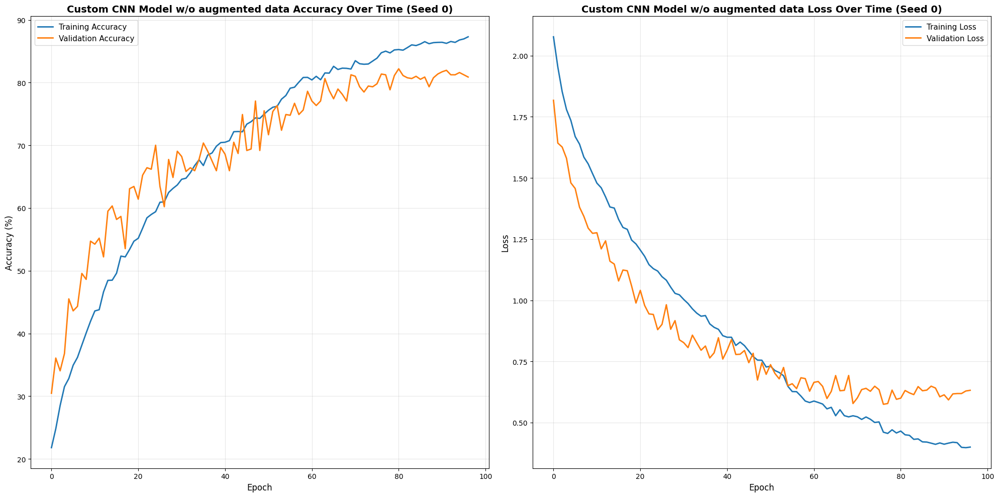

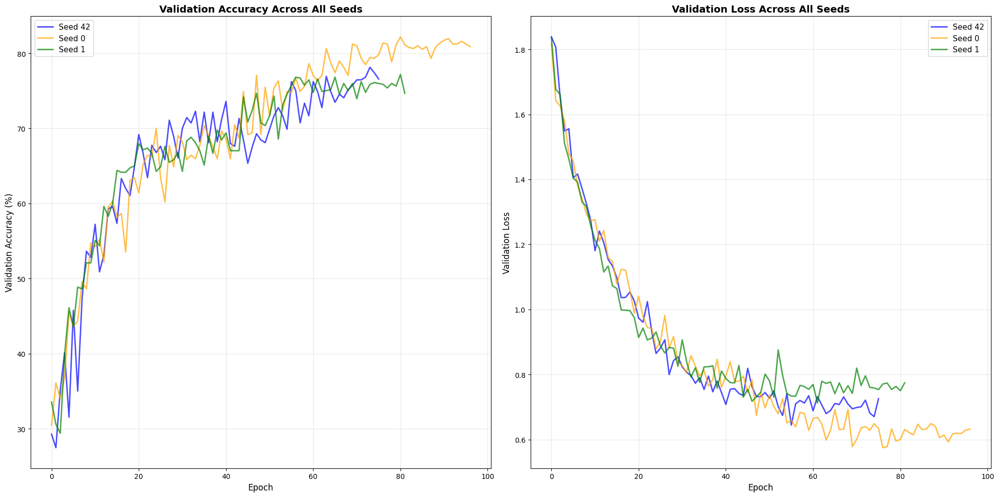

In [17]:
import matplotlib.pyplot as plt

# Plot training history for the best seed
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot accuracy
axes[0].plot(history_custom_cnn['accuracy'], label='Training Accuracy', linewidth=2)
axes[0].plot(history_custom_cnn['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].set_title(f'Custom CNN Model w/o augmented data Accuracy Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Plot loss
axes[1].plot(history_custom_cnn['loss'], label='Training Loss', linewidth=2)
axes[1].plot(history_custom_cnn['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_title(f'Custom CNN Model w/o augmented data Loss Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Optional: Plot comparison across all seeds
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

colors = ['blue', 'orange', 'green']
for idx, (seed, history) in enumerate(zip(seeds, all_histories)):
    # Plot validation accuracy for each seed
    axes[0].plot(history['val_accuracy'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)
    
    # Plot validation loss for each seed
    axes[1].plot(history['val_loss'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)

axes[0].set_title('Validation Accuracy Across All Seeds', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Validation Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Validation Loss Across All Seeds', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Validation Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

-----------------------------

### Train custom CNN model with augmened data

In [20]:
from torch.utils.data import TensorDataset, DataLoader
import torch
import numpy as np
import random
import pickle

print("\n" + "=" * 60)
print("STARTING MULTI-SEED TRAINING")
print("=" * 60)

# Define seeds
seeds = [42, 0, 1]
all_results = []
all_histories = []
all_model_states = []

# Loop through each seed
for seed_idx, seed in enumerate(seeds):
    print("\n" + "=" * 60)
    print(f"TRAINING WITH SEED: {seed} ({seed_idx + 1}/{len(seeds)})")
    print("=" * 60)
    
    # Set all seeds
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    print(f"Using seed: {seed}")
    
    # Prepare data loaders
    X_train_tensor = torch.FloatTensor(X_train).permute(0, 3, 1, 2)
    y_train_tensor = torch.LongTensor(y_train)
    X_val_tensor = torch.FloatTensor(X_val).permute(0, 3, 1, 2)
    y_val_tensor = torch.LongTensor(y_val)
    
    print(f"Training tensor shape: {X_train_tensor.shape}")
    print(f"Validation tensor shape: {X_val_tensor.shape}")
    
    # Create datasets
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    
    # Training configuration
    num_epochs = 200
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Reinitialize model, optimizer, scheduler for each seed
    custom_cnn = CustomCNN(num_classes=10)
    custom_cnn = custom_cnn.to(device)
    
    optimizer = torch.optim.Adam(custom_cnn.parameters(), lr=0.001)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    criterion = nn.CrossEntropyLoss()
    
    # Initialize early_stopping with proper path for this seed
    early_stopping = EarlyStopping(patience=20, verbose=True, path=f'checkpoint_aug_seed{seed}.pth')
    
    print(f"Training on device: {device}")
    print(f"Initial learning rate: {optimizer.param_groups[0]['lr']:.2e}")
    
    # Initialize history dictionary
    history = {
        'loss': [],
        'accuracy': [],
        'val_loss': [],
        'val_accuracy': [],
        'lr': []
    }
    
    # Training loop
    for epoch in range(num_epochs):
        # Training phase
        custom_cnn.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            outputs = custom_cnn(inputs)
            loss = criterion(outputs, labels)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            # Statistics
            train_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
        
        train_loss = train_loss / train_total
        train_acc = 100 * train_correct / train_total
        
        # Validation phase
        custom_cnn.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                
                outputs = custom_cnn(inputs)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_loss = val_loss / val_total
        val_acc = 100 * val_correct / val_total
        
        # Get current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        
        # Save history
        history['loss'].append(train_loss)
        history['accuracy'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_accuracy'].append(val_acc)
        history['lr'].append(current_lr)
        
        # Print progress every 10 epochs
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f'Epoch {epoch+1}/{num_epochs} - '
                  f'loss: {train_loss:.4f} - accuracy: {train_acc:.2f}% - '
                  f'val_loss: {val_loss:.4f} - val_accuracy: {val_acc:.2f}% - '
                  f'lr: {current_lr:.2e}')
        
        # Step the learning rate scheduler
        old_lr = current_lr
        scheduler.step(val_loss)
        new_lr = optimizer.param_groups[0]['lr']
        
        # Print if learning rate changed
        if old_lr != new_lr:
            print(f'  → Learning rate reduced: {old_lr:.2e} → {new_lr:.2e}')
        
        # Check early stopping
        early_stopping(val_loss, custom_cnn)
        
        if early_stopping.early_stop:
            print("Early stopping triggered!")
            early_stopping.load_best_weights(custom_cnn)
            break
    
    # If training completed without early stopping, load best weights anyway
    if not early_stopping.early_stop:
        early_stopping.load_best_weights(custom_cnn)
    
    print(f"\n✅ Seed {seed} Training Complete!")
    print(f"Best validation loss: {early_stopping.val_loss_min:.4f}")
    print(f"Total epochs trained: {len(history['loss'])}")
    
    # Store results for this seed
    seed_results = {
        'seed': seed,
        'train_loss': history['loss'][-1],
        'train_accuracy': history['accuracy'][-1],
        'val_loss': early_stopping.val_loss_min,
        'val_accuracy': max(history['val_accuracy'])
    }
    
    all_results.append(seed_results)
    all_histories.append(history)
    all_model_states.append(custom_cnn.state_dict())

# Calculate averages
print("\n" + "=" * 60)
print("MULTI-SEED TRAINING SUMMARY")
print("=" * 60)

train_losses = [r['train_loss'] for r in all_results]
train_accs = [r['train_accuracy'] for r in all_results]
val_losses = [r['val_loss'] for r in all_results]
val_accs = [r['val_accuracy'] for r in all_results]

avg_train_loss = np.mean(train_losses)
avg_train_acc = np.mean(train_accs)
avg_val_loss = np.mean(val_losses)
avg_val_acc = np.mean(val_accs)

print("\nResults per seed:")
for r in all_results:
    print(f"  Seed {r['seed']}: Train Loss={r['train_loss']:.4f}, Train Acc={r['train_accuracy']:.2f}%, Val Loss={r['val_loss']:.4f}, Val Acc={r['val_accuracy']:.2f}%")

print("\n" + "-" * 60)
print("AVERAGE RESULTS:")
print("-" * 60)
print(f"Average Training Loss: {avg_train_loss:.4f}")
print(f"Average Training Accuracy: {avg_train_acc:.2f}%")
print(f"Average Validation Loss: {avg_val_loss:.4f}")
print(f"Average Validation Accuracy: {avg_val_acc:.2f}%")

# Find and save best model
best_idx = np.argmax(val_accs)
best_seed = all_results[best_idx]['seed']
history_custom_cnn = all_histories[best_idx]

print("\n" + "=" * 60)
print("SAVING BEST MODEL")
print("=" * 60)
print(f"Best model from seed: {best_seed}")
print(f"Best validation accuracy: {all_results[best_idx]['val_accuracy']:.2f}%")
print(f"Best validation loss: {all_results[best_idx]['val_loss']:.4f}")

# Save the trained model
torch.save(all_model_states[best_idx], 'custom_cnn.pth')
print("✓ Model saved to 'custom_cnn.pth'")

# Save training history
with open('history_custom_cnn.pkl', 'wb') as f:
    pickle.dump(history_custom_cnn, f)
print("✓ Training history saved to 'history_custom_cnn.pkl'")

print("\n" + "=" * 60)
print("✅ ALL TRAINING COMPLETE!")
print("=" * 60)


STARTING MULTI-SEED TRAINING

TRAINING WITH SEED: 42 (1/3)
Using seed: 42
Training tensor shape: torch.Size([8220, 1, 128, 173])
Validation tensor shape: torch.Size([837, 1, 128, 173])
Training on device: cuda
Initial learning rate: 1.00e-03
Epoch 1/200 - loss: 2.0170 - accuracy: 23.78% - val_loss: 1.7107 - val_accuracy: 33.93% - lr: 1.00e-03
Validation loss decreased (inf --> 1.710679). Saving model to checkpoint_aug_seed42.pth
Validation loss decreased (1.710679 --> 1.658657). Saving model to checkpoint_aug_seed42.pth
Validation loss decreased (1.658657 --> 1.558871). Saving model to checkpoint_aug_seed42.pth
EarlyStopping counter: 1 out of 20
Validation loss decreased (1.558871 --> 1.478634). Saving model to checkpoint_aug_seed42.pth
Validation loss decreased (1.478634 --> 1.467960). Saving model to checkpoint_aug_seed42.pth
Validation loss decreased (1.467960 --> 1.379173). Saving model to checkpoint_aug_seed42.pth
EarlyStopping counter: 1 out of 20
Validation loss decreased (1.37

Evaluate custom CNN performance

In [22]:
print("\nFINAL EVALUATION")
print("=" * 60)

def evaluate_model(model, X, y, device):
    """Evaluate model on given data"""
    model.eval()
    
    # Convert to tensors and permute dimensions
    # From (samples, height, width, channels) to (samples, channels, height, width)
    if not isinstance(X, torch.Tensor):
        X = torch.FloatTensor(X)
    if not isinstance(y, torch.Tensor):
        y = torch.LongTensor(y)
    
    # Permute from (batch, 128, 173, 1) to (batch, 1, 128, 173)
    if X.dim() == 4 and X.shape[-1] == 1:
        X = X.permute(0, 3, 1, 2)  # Now (batch, 1, 128, 173)
    
    # Create dataset and dataloader
    dataset = TensorDataset(X, y)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=False)
    
    total_loss = 0
    correct = 0
    total = 0
    
    criterion = nn.CrossEntropyLoss()
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total
    
    return avg_loss, accuracy

# Get device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Recreate the model and load the best saved weights
custom_cnn = CustomCNN(num_classes=10)
custom_cnn.load_state_dict(torch.load('custom_cnn.pth'))
custom_cnn = custom_cnn.to(device)

print(f"Loaded best model from seed: {best_seed}")
print(f"Best validation accuracy from training: {all_results[best_idx]['val_accuracy']:.2f}%")
print()

# Validation evaluation
custom_cnn_val_loss, custom_cnn_val_accuracy = evaluate_model(custom_cnn, X_val, y_val, device)

# Test evaluation  
custom_cnn_test_loss, custom_cnn_test_accuracy = evaluate_model(custom_cnn, X_test, y_test, device)

print(f"Final Validation Loss: {custom_cnn_val_loss:.4f}")
print(f"Final Validation Accuracy: {custom_cnn_val_accuracy:.4f} ({custom_cnn_val_accuracy*100:.2f}%)")
print()
print(f"Final Test Loss: {custom_cnn_test_loss:.4f}")
print(f"Final Test Accuracy: {custom_cnn_test_accuracy:.4f} ({custom_cnn_test_accuracy*100:.2f}%)")
print("=" * 60)


FINAL EVALUATION
Loaded best model from seed: 42
Best validation accuracy from training: 79.33%

Final Validation Loss: 0.7583
Final Validation Accuracy: 0.7706 (77.06%)

Final Test Loss: 0.9370
Final Test Accuracy: 0.7855 (78.55%)


Plot Training History

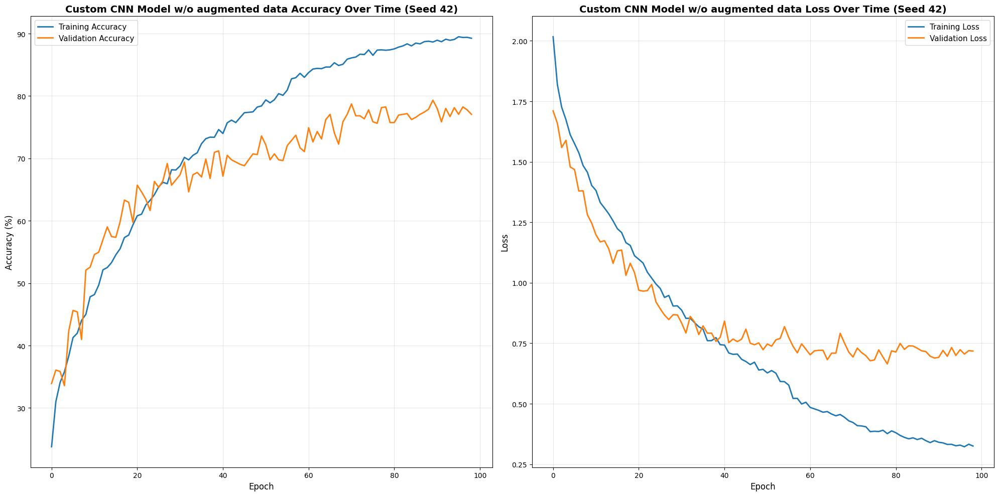

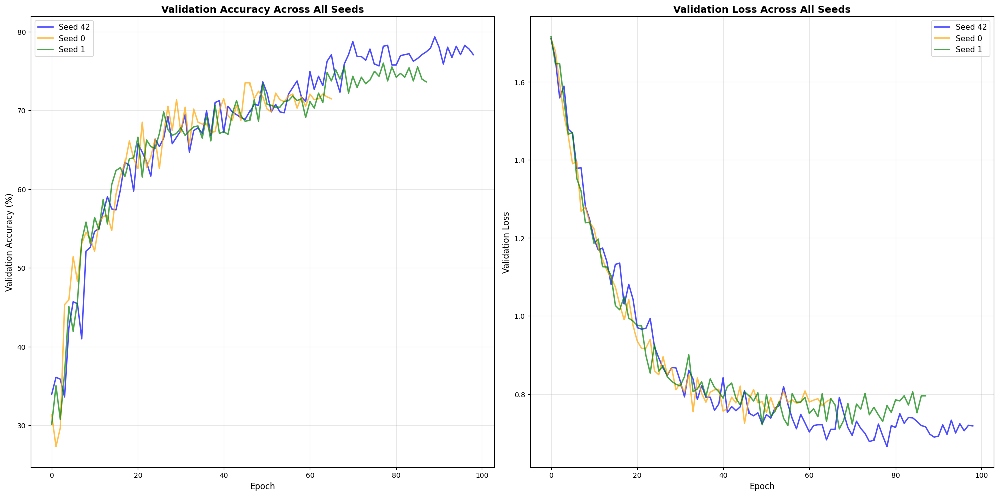

In [23]:
import matplotlib.pyplot as plt

# Plot training history for the best seed
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot accuracy
axes[0].plot(history_custom_cnn['accuracy'], label='Training Accuracy', linewidth=2)
axes[0].plot(history_custom_cnn['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].set_title(f'Custom CNN Model w/o augmented data Accuracy Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Plot loss
axes[1].plot(history_custom_cnn['loss'], label='Training Loss', linewidth=2)
axes[1].plot(history_custom_cnn['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_title(f'Custom CNN Model w/o augmented data Loss Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Optional: Plot comparison across all seeds
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

colors = ['blue', 'orange', 'green']
for idx, (seed, history) in enumerate(zip(seeds, all_histories)):
    # Plot validation accuracy for each seed
    axes[0].plot(history['val_accuracy'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)
    
    # Plot validation loss for each seed
    axes[1].plot(history['val_loss'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)

axes[0].set_title('Validation Accuracy Across All Seeds', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Validation Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Validation Loss Across All Seeds', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Validation Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

-----------------------------

### Inception Model without transfer learning without augmented data

In [29]:
from torch.utils.data import TensorDataset, DataLoader
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import random
import pickle

print("\n" + "=" * 60)
print("STARTING MULTI-SEED TRAINING")
print("=" * 60)

# Define seeds
seeds = [42, 0, 1]
all_results = []
all_histories = []
all_model_states = []

# Loop through each seed
for seed_idx, seed in enumerate(seeds):
    print("\n" + "=" * 60)
    print(f"TRAINING WITH SEED: {seed} ({seed_idx + 1}/{len(seeds)})")
    print("=" * 60)
    
    # Set all seeds
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    print(f"Using seed: {seed}")
    
    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.FloatTensor(X_train_no_aug).permute(0, 3, 1, 2)
    y_train_tensor = torch.LongTensor(y_train_no_aug)
    X_val_tensor = torch.FloatTensor(X_val).permute(0, 3, 1, 2)
    y_val_tensor = torch.LongTensor(y_val)
    
    # Convert 1-channel to 3-channel and resize to 299x299 for InceptionV3
    X_train_tensor = X_train_tensor.repeat(1, 3, 1, 1)
    X_val_tensor = X_val_tensor.repeat(1, 3, 1, 1)
    X_train_tensor = F.interpolate(X_train_tensor, size=(299, 299), mode='bilinear', align_corners=False)
    X_val_tensor = F.interpolate(X_val_tensor, size=(299, 299), mode='bilinear', align_corners=False)
    
    print(f"Training tensor shape: {X_train_tensor.shape}")
    print(f"Training labels shape: {y_train_tensor.shape}")
    print(f"Validation tensor shape: {X_val_tensor.shape}")
    print(f"Validation labels shape: {y_val_tensor.shape}")
    
    # Create datasets
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    
    print(f"\n✓ Training batches: {len(train_loader)}")
    print(f"✓ Validation batches: {len(val_loader)}")
    
    # ============================================
    # TRAINING CONFIGURATION
    # ============================================
    num_epochs = 100
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Reinitialize model, optimizer, scheduler for each seed
    from torchvision.models import inception_v3
    inception_v3_model_noTF = inception_v3(weights=None, aux_logits=True)
    num_ftrs = inception_v3_model_noTF.fc.in_features
    inception_v3_model_noTF.fc = nn.Linear(num_ftrs, 10)
    num_aux_ftrs = inception_v3_model_noTF.AuxLogits.fc.in_features
    inception_v3_model_noTF.AuxLogits.fc = nn.Linear(num_aux_ftrs, 10)
    
    inception_v3_model_noTF = inception_v3_model_noTF.to(device)
    
    optimizer = torch.optim.Adam(inception_v3_model_noTF.parameters(), lr=0.001)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    criterion = nn.CrossEntropyLoss()
    
    early_stopping = EarlyStopping(patience=10, verbose=True, path=f'checkpoint_inception_noTF_seed{seed}.pth')
    
    print(f"Training on device: {device}")
    print(f"Initial learning rate: {optimizer.param_groups[0]['lr']:.2e}")
    print(f"Number of epochs: {num_epochs}")
    print(f"Model: InceptionV3 (No Transfer Learning)")
    
    history = {
        'loss': [],
        'accuracy': [],
        'val_loss': [],
        'val_accuracy': [],
        'lr': []
    }
    
    # ============================================
    # TRAINING LOOP
    # ============================================
    for epoch in range(num_epochs):
        inception_v3_model_noTF.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            
            if inception_v3_model_noTF.training:
                outputs = inception_v3_model_noTF(inputs)
                if isinstance(outputs, tuple):
                    main_output, aux_output = outputs
                    loss1 = criterion(main_output, labels)
                    loss2 = criterion(aux_output, labels)
                    loss = loss1 + 0.4 * loss2
                    outputs = main_output
                else:
                    loss = criterion(outputs, labels)
            else:
                outputs = inception_v3_model_noTF(inputs)
                loss = criterion(outputs, labels)
            
            loss.backward()
            optimizer.step()
            
            train_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
        
        train_loss = train_loss / train_total
        train_acc = 100 * train_correct / train_total
        
        inception_v3_model_noTF.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                
                outputs = inception_v3_model_noTF(inputs)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_loss = val_loss / val_total
        val_acc = 100 * val_correct / val_total
        
        current_lr = optimizer.param_groups[0]['lr']
        
        history['loss'].append(train_loss)
        history['accuracy'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_accuracy'].append(val_acc)
        history['lr'].append(current_lr)
        
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f'Epoch {epoch+1}/{num_epochs} - '
                  f'loss: {train_loss:.4f} - accuracy: {train_acc:.2f}% - '
                  f'val_loss: {val_loss:.4f} - val_accuracy: {val_acc:.2f}% - '
                  f'lr: {current_lr:.2e}')
        
        old_lr = current_lr
        scheduler.step(val_loss)
        new_lr = optimizer.param_groups[0]['lr']
        
        if old_lr != new_lr:
            print(f'  → Learning rate reduced: {old_lr:.2e} → {new_lr:.2e}')
        
        early_stopping(val_loss, inception_v3_model_noTF)
        
        if early_stopping.early_stop:
            print("Early stopping triggered!")
            early_stopping.load_best_weights(inception_v3_model_noTF)
            break
    
    if not early_stopping.early_stop:
        early_stopping.load_best_weights(inception_v3_model_noTF)
    
    print(f"\n✅ Seed {seed} Training Complete!")
    print(f"Best validation loss: {early_stopping.val_loss_min:.4f}")
    print(f"Total epochs trained: {len(history['loss'])}")
    
    seed_results = {
        'seed': seed,
        'train_loss': history['loss'][-1],
        'train_accuracy': history['accuracy'][-1],
        'val_loss': early_stopping.val_loss_min,
        'val_accuracy': max(history['val_accuracy'])
    }
    
    all_results.append(seed_results)
    all_histories.append(history)
    all_model_states.append(inception_v3_model_noTF.state_dict())

# Calculate averages
print("\n" + "=" * 60)
print("MULTI-SEED TRAINING SUMMARY")
print("=" * 60)

train_losses = [r['train_loss'] for r in all_results]
train_accs = [r['train_accuracy'] for r in all_results]
val_losses = [r['val_loss'] for r in all_results]
val_accs = [r['val_accuracy'] for r in all_results]

avg_train_loss = np.mean(train_losses)
avg_train_acc = np.mean(train_accs)
avg_val_loss = np.mean(val_losses)
avg_val_acc = np.mean(val_accs)

print("\nResults per seed:")
for r in all_results:
    print(f"  Seed {r['seed']}: Train Loss={r['train_loss']:.4f}, Train Acc={r['train_accuracy']:.2f}%, Val Loss={r['val_loss']:.4f}, Val Acc={r['val_accuracy']:.2f}%")

print("\n" + "-" * 60)
print("AVERAGE RESULTS:")
print("-" * 60)
print(f"Average Training Loss: {avg_train_loss:.4f}")
print(f"Average Training Accuracy: {avg_train_acc:.2f}%")
print(f"Average Validation Loss: {avg_val_loss:.4f}")
print(f"Average Validation Accuracy: {avg_val_acc:.2f}%")

# Find and save best model
best_idx = np.argmax(val_accs)
best_seed = all_results[best_idx]['seed']
history_inception_v3_noTF = all_histories[best_idx]

print("\n" + "=" * 60)
print("SAVING BEST MODEL")
print("=" * 60)
print(f"Best model from seed: {best_seed}")
print(f"Best validation accuracy: {all_results[best_idx]['val_accuracy']:.2f}%")
print(f"Best validation loss: {all_results[best_idx]['val_loss']:.4f}")

torch.save(all_model_states[best_idx], 'inception_v3_noTF_trained.pth')
print("✓ Model saved to 'inception_v3_noTF_trained.pth'")

with open('history_inception_v3_noTF.pkl', 'wb') as f:
    pickle.dump(history_inception_v3_noTF, f)
print("✓ Training history saved to 'history_inception_v3_noTF.pkl'")

print("\n" + "=" * 60)
print("✅ ALL TRAINING COMPLETE!")
print("=" * 60)


STARTING MULTI-SEED TRAINING

TRAINING WITH SEED: 42 (1/3)
Using seed: 42
Training tensor shape: torch.Size([7079, 3, 299, 299])
Training labels shape: torch.Size([7079])
Validation tensor shape: torch.Size([837, 3, 299, 299])
Validation labels shape: torch.Size([837])

✓ Training batches: 222
✓ Validation batches: 27
Training on device: cuda
Initial learning rate: 1.00e-03
Number of epochs: 100
Model: InceptionV3 (No Transfer Learning)
Epoch 1/100 - loss: 1.8646 - accuracy: 52.83% - val_loss: 1.9251 - val_accuracy: 50.30% - lr: 1.00e-03
Validation loss decreased (inf --> 1.925104). Saving model to checkpoint_inception_noTF_seed42.pth
Validation loss decreased (1.925104 --> 1.181400). Saving model to checkpoint_inception_noTF_seed42.pth
Validation loss decreased (1.181400 --> 1.031988). Saving model to checkpoint_inception_noTF_seed42.pth
Validation loss decreased (1.031988 --> 0.940125). Saving model to checkpoint_inception_noTF_seed42.pth
EarlyStopping counter: 1 out of 10
EarlyStop

Evaluate performance

In [50]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

print("\nFINAL EVALUATION - INCEPTION V3 (NO TRANSFER LEARNING, NO AUGMENTATION)")
print("=" * 60)

def evaluate_model(model, X, y, device):
    """Evaluate model on given data"""
    model.eval()
    
    # Convert to tensors and permute dimensions
    if not isinstance(X, torch.Tensor):
        X = torch.FloatTensor(X)
    if not isinstance(y, torch.Tensor):
        y = torch.LongTensor(y)
    
    # Permute from (batch, 128, 173, 1) to (batch, 1, 128, 173)
    if X.dim() == 4 and X.shape[-1] == 1:
        X = X.permute(0, 3, 1, 2)
    
    # Convert 1-channel to 3-channel and resize to 299x299 for InceptionV3
    X = X.repeat(1, 3, 1, 1)  # (batch, 1, H, W) -> (batch, 3, H, W)
    X = F.interpolate(X, size=(299, 299), mode='bilinear', align_corners=False)
    
    # Create dataset and dataloader
    dataset = TensorDataset(X, y)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=False)
    
    total_loss = 0
    correct = 0
    total = 0
    
    criterion = nn.CrossEntropyLoss()
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total
    
    return avg_loss, accuracy

# Get device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the best saved model
from torchvision.models import inception_v3
inception_v3_model_noTF_noAug = inception_v3(weights=None, aux_logits=True)
num_ftrs = inception_v3_model_noTF_noAug.fc.in_features
inception_v3_model_noTF_noAug.fc = nn.Linear(num_ftrs, 10)
num_aux_ftrs = inception_v3_model_noTF_noAug.AuxLogits.fc.in_features
inception_v3_model_noTF_noAug.AuxLogits.fc = nn.Linear(num_aux_ftrs, 10)

inception_v3_model_noTF_noAug.load_state_dict(torch.load('inception_v3_noTF_noAug.pth'))
inception_v3_model_noTF_noAug = inception_v3_model_noTF_noAug.to(device)

print(f"Loaded best model from seed: {best_seed}")
print(f"Best validation accuracy from training: {all_results[best_idx]['val_accuracy']:.2f}%")
print()

# Validation evaluation
inception_v3_noTF_noAug_val_loss, inception_v3_noTF_noAug_val_accuracy = evaluate_model(inception_v3_model_noTF_noAug, X_val, y_val, device)

# Test evaluation  
inception_v3_noTF_noAug_test_loss, inception_v3_noTF_noAug_test_accuracy = evaluate_model(inception_v3_model_noTF_noAug, X_test, y_test, device)

print(f"Final Validation Loss: {inception_v3_noTF_noAug_val_loss:.4f}")
print(f"Final Validation Accuracy: {inception_v3_noTF_noAug_val_accuracy:.4f} ({inception_v3_noTF_noAug_val_accuracy*100:.2f}%)")
print()
print(f"Final Test Loss: {inception_v3_noTF_noAug_test_loss:.4f}")
print(f"Final Test Accuracy: {inception_v3_noTF_noAug_test_accuracy:.4f} ({inception_v3_noTF_noAug_test_accuracy*100:.2f}%)")
print("=" * 60)


FINAL EVALUATION - INCEPTION V3 (NO TRANSFER LEARNING, NO AUGMENTATION)
Loaded best model from seed: 1
Best validation accuracy from training: 86.14%

Final Validation Loss: 0.8085
Final Validation Accuracy: 0.8256 (82.56%)

Final Test Loss: 1.3010
Final Test Accuracy: 0.8076 (80.76%)


Plot training history

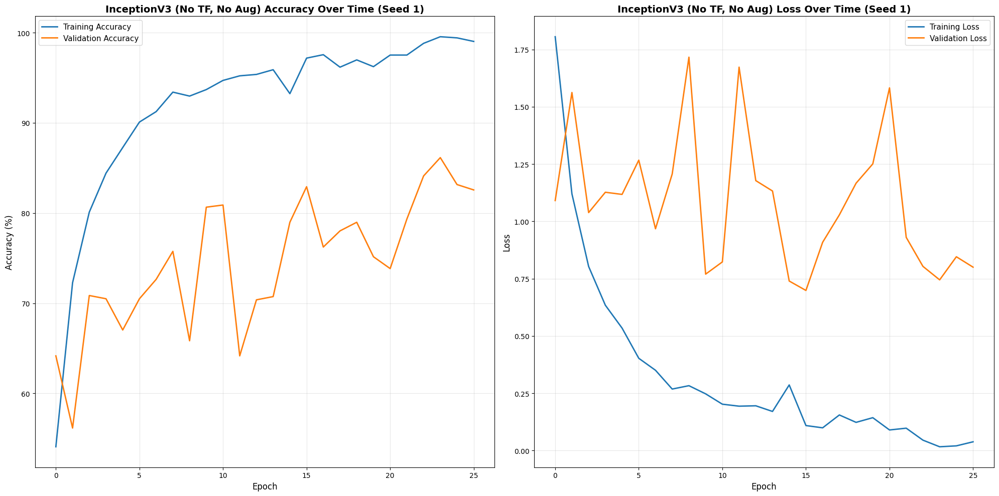

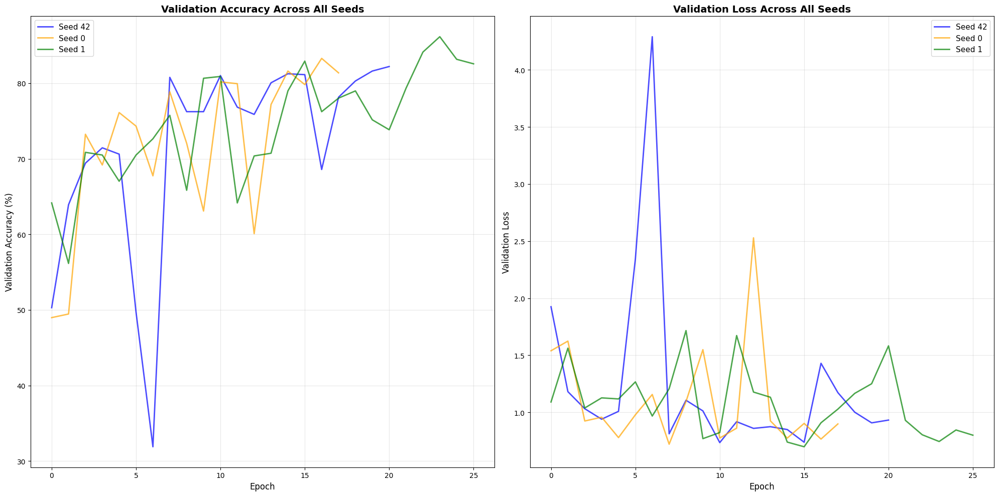

In [57]:
import matplotlib.pyplot as plt

# Plot training history for the best seed
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot accuracy
axes[0].plot(history_inception_v3_noTF_noAug['accuracy'], label='Training Accuracy', linewidth=2)
axes[0].plot(history_inception_v3_noTF_noAug['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].set_title(f'InceptionV3 (No TF, No Aug) Accuracy Over Time (Seed {1})', 
                  fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Plot loss
axes[1].plot(history_inception_v3_noTF_noAug['loss'], label='Training Loss', linewidth=2)
axes[1].plot(history_inception_v3_noTF_noAug['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_title(f'InceptionV3 (No TF, No Aug) Loss Over Time (Seed {1})', 
                  fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Optional: Plot comparison across all seeds
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

colors = ['blue', 'orange', 'green']
for idx, (seed, history) in enumerate(zip(seeds, all_histories)):
    # Plot validation accuracy for each seed
    axes[0].plot(history['val_accuracy'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)
    
    # Plot validation loss for each seed
    axes[1].plot(history['val_loss'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)

axes[0].set_title('Validation Accuracy Across All Seeds', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Validation Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Validation Loss Across All Seeds', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Validation Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


-----------------------------

### Inception Model without transfere learning with augmented data


In [58]:
from torch.utils.data import TensorDataset, DataLoader
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import random
import pickle

print("\n" + "=" * 60)
print("STARTING MULTI-SEED TRAINING")
print("=" * 60)

# Define seeds
seeds = [42, 0, 1]
all_results = []
all_histories = []
all_model_states = []

# Loop through each seed
for seed_idx, seed in enumerate(seeds):
    print("\n" + "=" * 60)
    print(f"TRAINING WITH SEED: {seed} ({seed_idx + 1}/{len(seeds)})")
    print("=" * 60)
    
    # Set all seeds
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    print(f"Using seed: {seed}")
    
    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.FloatTensor(X_train).permute(0, 3, 1, 2)
    y_train_tensor = torch.LongTensor(y_train)
    X_val_tensor = torch.FloatTensor(X_val).permute(0, 3, 1, 2)
    y_val_tensor = torch.LongTensor(y_val)
    
    # Convert 1-channel to 3-channel and resize to 299x299 for InceptionV3
    X_train_tensor = X_train_tensor.repeat(1, 3, 1, 1)
    X_val_tensor = X_val_tensor.repeat(1, 3, 1, 1)
    X_train_tensor = F.interpolate(X_train_tensor, size=(299, 299), mode='bilinear', align_corners=False)
    X_val_tensor = F.interpolate(X_val_tensor, size=(299, 299), mode='bilinear', align_corners=False)
    
    print(f"Training tensor shape: {X_train_tensor.shape}")
    print(f"Training labels shape: {y_train_tensor.shape}")
    print(f"Validation tensor shape: {X_val_tensor.shape}")
    print(f"Validation labels shape: {y_val_tensor.shape}")
    
    # Create datasets
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    
    print(f"\n✓ Training batches: {len(train_loader)}")
    print(f"✓ Validation batches: {len(val_loader)}")
    
    # ============================================
    # TRAINING CONFIGURATION
    # ============================================
    num_epochs = 100
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Reinitialize model, optimizer, scheduler for each seed
    from torchvision.models import inception_v3
    inception_v3_model_noTF = inception_v3(weights=None, aux_logits=True)
    num_ftrs = inception_v3_model_noTF.fc.in_features
    inception_v3_model_noTF.fc = nn.Linear(num_ftrs, 10)
    num_aux_ftrs = inception_v3_model_noTF.AuxLogits.fc.in_features
    inception_v3_model_noTF.AuxLogits.fc = nn.Linear(num_aux_ftrs, 10)
    
    inception_v3_model_noTF = inception_v3_model_noTF.to(device)
    
    optimizer = torch.optim.Adam(inception_v3_model_noTF.parameters(), lr=0.001)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
    criterion = nn.CrossEntropyLoss()
    
    # Initialize early_stopping with proper path for this seed
    early_stopping = EarlyStopping(patience=10, verbose=True, path=f'checkpoint_inception_noTF_seed{seed}.pth')
    
    print(f"Training on device: {device}")
    print(f"Initial learning rate: {optimizer.param_groups[0]['lr']:.2e}")
    print(f"Number of epochs: {num_epochs}")
    print(f"Model: InceptionV3 (No Transfer Learning)")
    
    # Initialize history dictionary
    history = {
        'loss': [],
        'accuracy': [],
        'val_loss': [],
        'val_accuracy': [],
        'lr': []
    }
    
    # ============================================
    # TRAINING LOOP
    # ============================================
    for epoch in range(num_epochs):
        # ========================================
        # TRAINING PHASE
        # ========================================
        inception_v3_model_noTF.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            
            # InceptionV3 returns auxiliary outputs during training
            if inception_v3_model_noTF.training:
                outputs = inception_v3_model_noTF(inputs)
                # Check if auxiliary outputs are returned
                if isinstance(outputs, tuple):
                    main_output, aux_output = outputs
                    # Compute combined loss (main + 0.4 * auxiliary)
                    loss1 = criterion(main_output, labels)
                    loss2 = criterion(aux_output, labels)
                    loss = loss1 + 0.4 * loss2
                    outputs = main_output  # Use main output for accuracy
                else:
                    loss = criterion(outputs, labels)
            else:
                outputs = inception_v3_model_noTF(inputs)
                loss = criterion(outputs, labels)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            # Statistics
            train_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
        
        train_loss = train_loss / train_total
        train_acc = 100 * train_correct / train_total
        
        # ========================================
        # VALIDATION PHASE
        # ========================================
        inception_v3_model_noTF.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                
                outputs = inception_v3_model_noTF(inputs)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_loss = val_loss / val_total
        val_acc = 100 * val_correct / val_total
        
        # Get current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        
        # Save history
        history['loss'].append(train_loss)
        history['accuracy'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_accuracy'].append(val_acc)
        history['lr'].append(current_lr)
        
        # Print progress every 10 epochs
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f'Epoch {epoch+1}/{num_epochs} - '
                  f'loss: {train_loss:.4f} - accuracy: {train_acc:.2f}% - '
                  f'val_loss: {val_loss:.4f} - val_accuracy: {val_acc:.2f}% - '
                  f'lr: {current_lr:.2e}')
        
        # Step the learning rate scheduler
        old_lr = current_lr
        scheduler.step(val_loss)
        new_lr = optimizer.param_groups[0]['lr']
        
        # Print if learning rate changed
        if old_lr != new_lr:
            print(f'  → Learning rate reduced: {old_lr:.2e} → {new_lr:.2e}')
        
        # Check early stopping
        early_stopping(val_loss, inception_v3_model_noTF)
        
        if early_stopping.early_stop:
            print("Early stopping triggered!")
            early_stopping.load_best_weights(inception_v3_model_noTF)
            break
    
    # If training completed without early stopping, load best weights anyway
    if not early_stopping.early_stop:
        early_stopping.load_best_weights(inception_v3_model_noTF)
    
    print(f"\n✅ Seed {seed} Training Complete!")
    print(f"Best validation loss: {early_stopping.val_loss_min:.4f}")
    print(f"Total epochs trained: {len(history['loss'])}")
    
    # Store results for this seed
    seed_results = {
        'seed': seed,
        'train_loss': history['loss'][-1],
        'train_accuracy': history['accuracy'][-1],
        'val_loss': early_stopping.val_loss_min,
        'val_accuracy': max(history['val_accuracy'])
    }
    
    all_results.append(seed_results)
    all_histories.append(history)
    all_model_states.append(inception_v3_model_noTF.state_dict())

# Calculate averages
print("\n" + "=" * 60)
print("MULTI-SEED TRAINING SUMMARY")
print("=" * 60)

train_losses = [r['train_loss'] for r in all_results]
train_accs = [r['train_accuracy'] for r in all_results]
val_losses = [r['val_loss'] for r in all_results]
val_accs = [r['val_accuracy'] for r in all_results]

avg_train_loss = np.mean(train_losses)
avg_train_acc = np.mean(train_accs)
avg_val_loss = np.mean(val_losses)
avg_val_acc = np.mean(val_accs)

print("\nResults per seed:")
for r in all_results:
    print(f"  Seed {r['seed']}: Train Loss={r['train_loss']:.4f}, Train Acc={r['train_accuracy']:.2f}%, Val Loss={r['val_loss']:.4f}, Val Acc={r['val_accuracy']:.2f}%")

print("\n" + "-" * 60)
print("AVERAGE RESULTS:")
print("-" * 60)
print(f"Average Training Loss: {avg_train_loss:.4f}")
print(f"Average Training Accuracy: {avg_train_acc:.2f}%")
print(f"Average Validation Loss: {avg_val_loss:.4f}")
print(f"Average Validation Accuracy: {avg_val_acc:.2f}%")

# Find and save best model
best_idx = np.argmax(val_accs)
best_seed = all_results[best_idx]['seed']
history_inception_v3_noTF = all_histories[best_idx]

print("\n" + "=" * 60)
print("SAVING BEST MODEL")
print("=" * 60)
print(f"Best model from seed: {best_seed}")
print(f"Best validation accuracy: {all_results[best_idx]['val_accuracy']:.2f}%")
print(f"Best validation loss: {all_results[best_idx]['val_loss']:.4f}")

# Save the trained model
torch.save(all_model_states[best_idx], 'inception_v3_noTF.pth')
print("✓ Model saved to 'inception_v3_noTF.pth'")

# Save training history
with open('history_inception_v3_noTF.pkl', 'wb') as f:
    pickle.dump(history_inception_v3_noTF, f)
print("✓ Training history saved to 'history_inception_v3_noTF.pkl'")

print("\n" + "=" * 60)
print("✅ ALL TRAINING COMPLETE!")
print("=" * 60)


STARTING MULTI-SEED TRAINING

TRAINING WITH SEED: 42 (1/3)
Using seed: 42
Training tensor shape: torch.Size([8220, 3, 299, 299])
Training labels shape: torch.Size([8220])
Validation tensor shape: torch.Size([837, 3, 299, 299])
Validation labels shape: torch.Size([837])

✓ Training batches: 257
✓ Validation batches: 27
Training on device: cuda
Initial learning rate: 1.00e-03
Number of epochs: 100
Model: InceptionV3 (No Transfer Learning)
Epoch 1/100 - loss: 1.8725 - accuracy: 52.30% - val_loss: 2.0313 - val_accuracy: 41.46% - lr: 1.00e-03
Validation loss decreased (inf --> 2.031283). Saving model to checkpoint_inception_noTF_seed42.pth
Validation loss decreased (2.031283 --> 1.358326). Saving model to checkpoint_inception_noTF_seed42.pth
Validation loss decreased (1.358326 --> 0.974395). Saving model to checkpoint_inception_noTF_seed42.pth
EarlyStopping counter: 1 out of 10
EarlyStopping counter: 2 out of 10
Validation loss decreased (0.974395 --> 0.817155). Saving model to checkpoint_

Evaluate performance

In [62]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader

print("\nFINAL EVALUATION - INCEPTION V3 (NO TRANSFER LEARNING)")
print("=" * 60)

def evaluate_model(model, X, y, device):
    """Evaluate model on given data"""
    model.eval()
    
    # Convert to tensors and permute dimensions
    if not isinstance(X, torch.Tensor):
        X = torch.FloatTensor(X)
    if not isinstance(y, torch.Tensor):
        y = torch.LongTensor(y)
    
    # Permute from (batch, 128, 173, 1) to (batch, 1, 128, 173)
    if X.dim() == 4 and X.shape[-1] == 1:
        X = X.permute(0, 3, 1, 2)
    
    # Convert 1-channel to 3-channel and resize to 299x299 for InceptionV3
    X = X.repeat(1, 3, 1, 1)  # (batch, 1, H, W) -> (batch, 3, H, W)
    X = F.interpolate(X, size=(299, 299), mode='bilinear', align_corners=False)
    
    # Create dataset and dataloader
    dataset = TensorDataset(X, y)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=False)
    
    total_loss = 0
    correct = 0
    total = 0
    
    criterion = nn.CrossEntropyLoss()
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total
    
    return avg_loss, accuracy

# Get device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the best saved model
from torchvision.models import inception_v3
inception_v3_model_noTF = inception_v3(weights=None, aux_logits=True)
num_ftrs = inception_v3_model_noTF.fc.in_features
inception_v3_model_noTF.fc = nn.Linear(num_ftrs, 10)
num_aux_ftrs = inception_v3_model_noTF.AuxLogits.fc.in_features
inception_v3_model_noTF.AuxLogits.fc = nn.Linear(num_aux_ftrs, 10)

inception_v3_model_noTF.load_state_dict(torch.load('inception_v3_noTF.pth'))
inception_v3_model_noTF = inception_v3_model_noTF.to(device)

print(f"Loaded best model from seed: {best_seed}")
print(f"Best validation accuracy from training: {all_results[best_idx]['val_accuracy']:.2f}%")
print()

# Validation evaluation
inception_v3_noTF_val_loss, inception_v3_noTF_val_accuracy = evaluate_model(inception_v3_model_noTF, X_val, y_val, device)

# Test evaluation  
inception_v3_noTF_test_loss, inception_v3_noTF_test_accuracy = evaluate_model(inception_v3_model_noTF, X_test, y_test, device)

print(f"Final Validation Loss: {inception_v3_noTF_val_loss:.4f}")
print(f"Final Validation Accuracy: {inception_v3_noTF_val_accuracy:.4f} ({inception_v3_noTF_val_accuracy*100:.2f}%)")
print()
print(f"Final Test Loss: {inception_v3_noTF_test_loss:.4f}")
print(f"Final Test Accuracy: {inception_v3_noTF_test_accuracy:.4f} ({inception_v3_noTF_test_accuracy*100:.2f}%)")
print("=" * 60)


FINAL EVALUATION - INCEPTION V3 (NO TRANSFER LEARNING)


c:\Users\Hugo Duarte de Sousa\Desktop\Season 5\Aprendizagem Computacional II\Projeto\.venv\Lib\site-packages\torchvision\models\inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


Loaded best model from seed: 42
Best validation accuracy from training: 86.62%

Final Validation Loss: 0.8712
Final Validation Accuracy: 0.8435 (84.35%)

Final Test Loss: 1.7568
Final Test Accuracy: 0.7659 (76.59%)


Plot training history

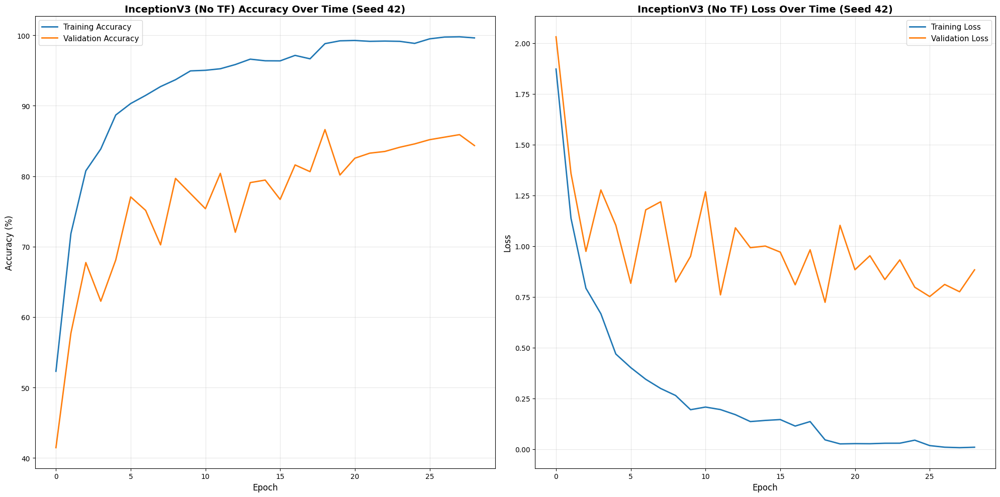

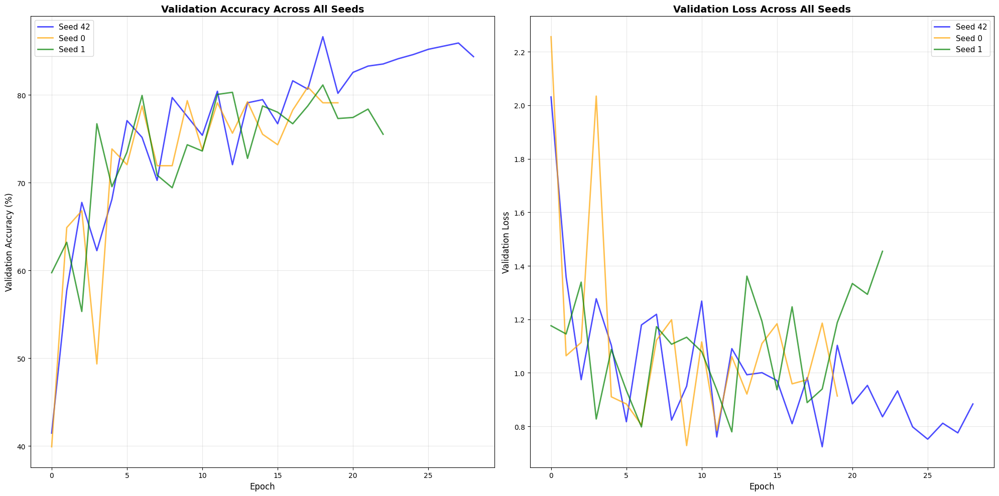

In [65]:
import matplotlib.pyplot as plt

# Plot training history for the best seed
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot accuracy
axes[0].plot(history_inception_v3_noTF['accuracy'], label='Training Accuracy', linewidth=2)
axes[0].plot(history_inception_v3_noTF['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].set_title(f'InceptionV3 (No TF) Accuracy Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Plot loss
axes[1].plot(history_inception_v3_noTF['loss'], label='Training Loss', linewidth=2)
axes[1].plot(history_inception_v3_noTF['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_title(f'InceptionV3 (No TF) Loss Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Optional: Plot comparison across all seeds
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

colors = ['blue', 'orange', 'green']
for idx, (seed, history) in enumerate(zip(seeds, all_histories)):
    # Plot validation accuracy for each seed
    axes[0].plot(history['val_accuracy'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)
    
    # Plot validation loss for each seed
    axes[1].plot(history['val_loss'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)

axes[0].set_title('Validation Accuracy Across All Seeds', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Validation Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Validation Loss Across All Seeds', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Validation Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


-----------------------------

### Inception with transfer learning no Aug

In [18]:
from torch.utils.data import TensorDataset, DataLoader
import torch
import torch.nn as nn
import numpy as np
import random
import pickle

print("\n" + "=" * 60)
print("STARTING MULTI-SEED TRAINING")
print("=" * 60)

# Define seeds
seeds = [42, 0, 1]
all_results = []
all_histories = []
all_model_states = []

# Loop through each seed
for seed_idx, seed in enumerate(seeds):
    print("\n" + "=" * 60)
    print(f"TRAINING WITH SEED: {seed} ({seed_idx + 1}/{len(seeds)})")
    print("=" * 60)
    
    
    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.FloatTensor(X_train_no_aug).permute(0, 3, 1, 2)
    y_train_tensor = torch.LongTensor(y_train_no_aug)
    X_val_tensor = torch.FloatTensor(X_val).permute(0, 3, 1, 2)
    y_val_tensor = torch.LongTensor(y_val)
    
    torch.backends.cudnn.benchmark = False
    
    print(f"Using seed: {seed}")
    
    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.FloatTensor(X_train_no_aug).permute(0, 3, 1, 2)
    y_train_tensor = torch.LongTensor(y_train_no_aug)
    X_val_tensor = torch.FloatTensor(X_val).permute(0, 3, 1, 2)
    y_val_tensor = torch.LongTensor(y_val)
    
    print(f"Training tensor shape: {X_train_tensor.shape}")
    print(f"Training labels shape: {y_train_tensor.shape}")
    print(f"Validation tensor shape: {X_val_tensor.shape}")
    print(f"Validation labels shape: {y_val_tensor.shape}")
    
    # Create datasets
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    
    print(f"\n✓ Training batches: {len(train_loader)}")
    print(f"✓ Validation batches: {len(val_loader)}")
    
    # ============================================
    # TRAINING CONFIGURATION
    # ============================================
    num_epochs = 100
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Reinitialize the model for this seed (using the existing definition)
    inception_v3_model = inception_v3_model.to(device)
    
    # Reinitialize optimizer and scheduler
    optimizer = torch.optim.Adam(
        inception_v3_model.parameters(), 
        lr=0.001,
        weight_decay=1e-4
    )
    scheduler = ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
    )
    criterion = nn.CrossEntropyLoss()
    
    # Initialize early_stopping with proper path for this seed
    early_stopping = EarlyStopping(patience=10, verbose=True, path=f'checkpoint_inception_seed{seed}.pth')
    
    print(f"Training on device: {device}")
    print(f"Initial learning rate: {optimizer.param_groups[0]['lr']:.2e}")
    print(f"Number of epochs: {num_epochs}")
    
    # Initialize history dictionary
    history = {
        'loss': [],
        'accuracy': [],
        'val_loss': [],
        'val_accuracy': [],
        'lr': []
    }
    
    # ============================================
    # TRAINING LOOP
    # ============================================
    for epoch in range(num_epochs):
        # ========================================
        # TRAINING PHASE
        # ========================================
        inception_v3_model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            
            # InceptionV3 returns auxiliary outputs during training
            if inception_v3_model.training:
                outputs = inception_v3_model(inputs)
                # Check if auxiliary outputs are returned
                if isinstance(outputs, tuple):
                    main_output, aux_output = outputs
                    # Compute combined loss (main + 0.4 * auxiliary)
                    loss1 = criterion(main_output, labels)
                    loss2 = criterion(aux_output, labels)
                    loss = loss1 + 0.4 * loss2
                    outputs = main_output  # Use main output for accuracy
                else:
                    loss = criterion(outputs, labels)
            else:
                outputs = inception_v3_model(inputs)
                loss = criterion(outputs, labels)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            # Statistics
            train_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
        
        train_loss = train_loss / train_total
        train_acc = 100 * train_correct / train_total
        
        # ========================================
        # VALIDATION PHASE
        # ========================================
        inception_v3_model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                
                outputs = inception_v3_model(inputs)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_loss = val_loss / val_total
        val_acc = 100 * val_correct / val_total
        
        # Get current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        
        # Save history
        history['loss'].append(train_loss)
        history['accuracy'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_accuracy'].append(val_acc)
        history['lr'].append(current_lr)
        
        # Print progress every 10 epochs
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f'Epoch {epoch+1}/{num_epochs} - '
                  f'loss: {train_loss:.4f} - accuracy: {train_acc:.2f}% - '
                  f'val_loss: {val_loss:.4f} - val_accuracy: {val_acc:.2f}% - '
                  f'lr: {current_lr:.2e}')
        
        # Step the learning rate scheduler
        old_lr = current_lr
        scheduler.step(val_loss)
        new_lr = optimizer.param_groups[0]['lr']
        
        # Print if learning rate changed
        if old_lr != new_lr:
            print(f'  → Learning rate reduced: {old_lr:.2e} → {new_lr:.2e}')
        
        # Check early stopping
        early_stopping(val_loss, inception_v3_model)
        
        if early_stopping.early_stop:
            print("Early stopping triggered!")
            early_stopping.load_best_weights(inception_v3_model)
            break
    
    # If training completed without early stopping, load best weights anyway
    if not early_stopping.early_stop:
        early_stopping.load_best_weights(inception_v3_model)
    
    print(f"\n✅ Seed {seed} Training Complete!")
    print(f"Best validation loss: {early_stopping.val_loss_min:.4f}")
    print(f"Total epochs trained: {len(history['loss'])}")
    
    # Store results for this seed
    seed_results = {
        'seed': seed,
        'train_loss': history['loss'][-1],
        'train_accuracy': history['accuracy'][-1],
        'val_loss': early_stopping.val_loss_min,
        'val_accuracy': max(history['val_accuracy'])
    }
    
    all_results.append(seed_results)
    all_histories.append(history)
    all_model_states.append(inception_v3_model.state_dict())

# Calculate averages
print("\n" + "=" * 60)
print("MULTI-SEED TRAINING SUMMARY")
print("=" * 60)

train_losses = [r['train_loss'] for r in all_results]
train_accs = [r['train_accuracy'] for r in all_results]
val_losses = [r['val_loss'] for r in all_results]
val_accs = [r['val_accuracy'] for r in all_results]

avg_train_loss = np.mean(train_losses)
avg_train_acc = np.mean(train_accs)
avg_val_loss = np.mean(val_losses)
avg_val_acc = np.mean(val_accs)

print("\nResults per seed:")
for r in all_results:
    print(f"  Seed {r['seed']}: Train Loss={r['train_loss']:.4f}, Train Acc={r['train_accuracy']:.2f}%, Val Loss={r['val_loss']:.4f}, Val Acc={r['val_accuracy']:.2f}%")

print("\n" + "-" * 60)
print("AVERAGE RESULTS:")
print("-" * 60)
print(f"Average Training Loss: {avg_train_loss:.4f}")
print(f"Average Training Accuracy: {avg_train_acc:.2f}%")
print(f"Average Validation Loss: {avg_val_loss:.4f}")
print(f"Average Validation Accuracy: {avg_val_acc:.2f}%")

# Find and save best model
best_idx = np.argmax(val_accs)
best_seed = all_results[best_idx]['seed']
history_inception_v3 = all_histories[best_idx]

print("\n" + "=" * 60)
print("SAVING BEST MODEL")
print("=" * 60)
print(f"Best model from seed: {best_seed}")
print(f"Best validation accuracy: {all_results[best_idx]['val_accuracy']:.2f}%")
print(f"Best validation loss: {all_results[best_idx]['val_loss']:.4f}")

# Save the trained model
torch.save(all_model_states[best_idx], 'inception_v3.pth')
print("✓ Model saved to 'inception_v3.pth'")

# Save training history
with open('history_inception_v3.pkl', 'wb') as f:
    pickle.dump(history_inception_v3, f)
print("✓ Training history saved to 'history_inception_v3.pkl'")

print("\n" + "=" * 60)
print("✅ ALL TRAINING COMPLETE!")
print("=" * 60)


STARTING MULTI-SEED TRAINING

TRAINING WITH SEED: 42 (1/3)
Using seed: 42
Training tensor shape: torch.Size([7079, 1, 128, 173])
Training labels shape: torch.Size([7079])
Validation tensor shape: torch.Size([837, 1, 128, 173])
Validation labels shape: torch.Size([837])

✓ Training batches: 222
✓ Validation batches: 27
Training on device: cuda
Initial learning rate: 1.00e-03
Number of epochs: 100
Epoch 1/100 - loss: 1.3289 - accuracy: 63.82% - val_loss: 0.9217 - val_accuracy: 74.43% - lr: 1.00e-03
Validation loss decreased (inf --> 0.921688). Saving model to checkpoint_inception_seed42.pth
Validation loss decreased (0.921688 --> 0.661137). Saving model to checkpoint_inception_seed42.pth
EarlyStopping counter: 1 out of 10
EarlyStopping counter: 2 out of 10
EarlyStopping counter: 3 out of 10
  → Learning rate reduced: 1.00e-03 → 5.00e-04
EarlyStopping counter: 4 out of 10
EarlyStopping counter: 5 out of 10
EarlyStopping counter: 6 out of 10
EarlyStopping counter: 7 out of 10
Epoch 10/100

Evaluate

In [19]:
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

print("\nFINAL EVALUATION - INCEPTION V3")
print("=" * 60)

def evaluate_model(model, X, y, device):
    """Evaluate model on given data"""
    model.eval()
    
    # Convert to tensors and permute dimensions
    if not isinstance(X, torch.Tensor):
        X = torch.FloatTensor(X)
    if not isinstance(y, torch.Tensor):
        y = torch.LongTensor(y)
    
    # Permute from (batch, 128, 173, 1) to (batch, 1, 128, 173)
    if X.dim() == 4 and X.shape[-1] == 1:
        X = X.permute(0, 3, 1, 2)
    
    # Create dataset and dataloader
    dataset = TensorDataset(X, y)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=False)
    
    total_loss = 0
    correct = 0
    total = 0
    
    criterion = nn.CrossEntropyLoss()
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total
    
    return avg_loss, accuracy

# Get device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the best saved model
inception_v3_model.load_state_dict(torch.load('inception_v3.pth'))
inception_v3_model = inception_v3_model.to(device)

print(f"Loaded best model from seed: {best_seed}")
print(f"Best validation accuracy from training: {all_results[best_idx]['val_accuracy']:.2f}%")
print()

# Validation evaluation
inception_v3_val_loss, inception_v3_val_accuracy = evaluate_model(inception_v3_model, X_val, y_val, device)

# Test evaluation  
inception_v3_test_loss, inception_v3_test_accuracy = evaluate_model(inception_v3_model, X_test, y_test, device)

print(f"Final Validation Loss: {inception_v3_val_loss:.4f}")
print(f"Final Validation Accuracy: {inception_v3_val_accuracy:.4f} ({inception_v3_val_accuracy*100:.2f}%)")
print()
print(f"Final Test Loss: {inception_v3_test_loss:.4f}")
print(f"Final Test Accuracy: {inception_v3_test_accuracy:.4f} ({inception_v3_test_accuracy*100:.2f}%)")
print("=" * 60)


FINAL EVALUATION - INCEPTION V3
Loaded best model from seed: 1
Best validation accuracy from training: 84.23%

Final Validation Loss: 0.9816
Final Validation Accuracy: 0.8423 (84.23%)

Final Test Loss: 1.3800
Final Test Accuracy: 0.7978 (79.78%)


Plot training history

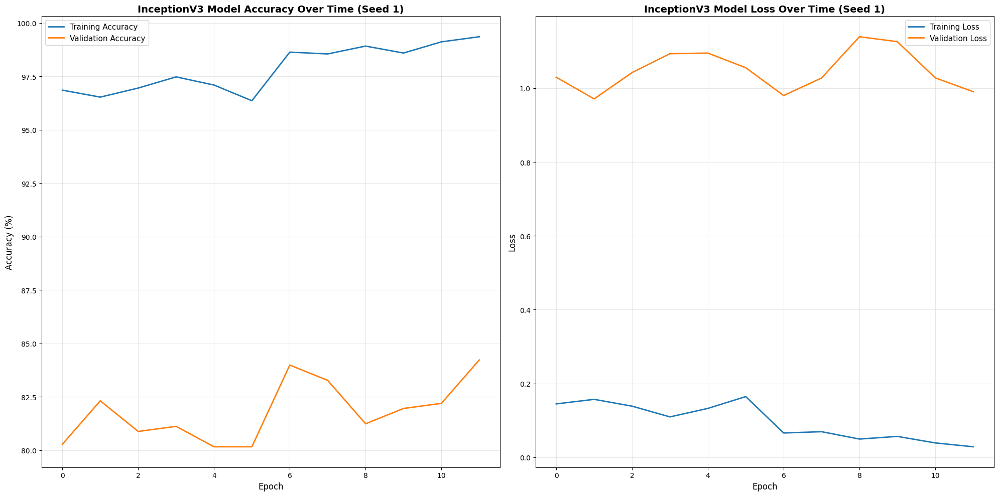

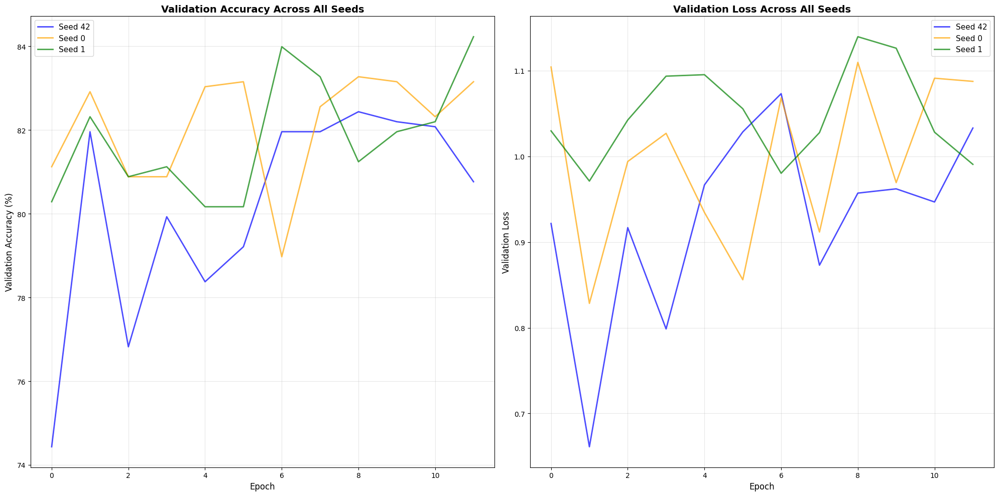

In [20]:
import pickle
import matplotlib.pyplot as plt

# Plot training history for the best seed
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot accuracy
axes[0].plot(history_inception_v3['accuracy'], label='Training Accuracy', linewidth=2)
axes[0].plot(history_inception_v3['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].set_title(f'InceptionV3 Model Accuracy Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Plot loss
axes[1].plot(history_inception_v3['loss'], label='Training Loss', linewidth=2)
axes[1].plot(history_inception_v3['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_title(f'InceptionV3 Model Loss Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Optional: Plot comparison across all seeds
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

colors = ['blue', 'orange', 'green']
for idx, (seed, history) in enumerate(zip(seeds, all_histories)):
    # Plot validation accuracy for each seed
    axes[0].plot(history['val_accuracy'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)
    
    # Plot validation loss for each seed
    axes[1].plot(history['val_loss'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)

axes[0].set_title('Validation Accuracy Across All Seeds', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Validation Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Validation Loss Across All Seeds', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Validation Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


---------------------------------

### Inception Model with transfer learning

In [69]:
from torch.utils.data import TensorDataset, DataLoader
import torch
import torch.nn as nn
import numpy as np
import random
import pickle

print("\n" + "=" * 60)
print("STARTING MULTI-SEED TRAINING")
print("=" * 60)

# Define seeds
seeds = [42, 0, 1]
all_results = []
all_histories = []
all_model_states = []

# Loop through each seed
for seed_idx, seed in enumerate(seeds):
    print("\n" + "=" * 60)
    print(f"TRAINING WITH SEED: {seed} ({seed_idx + 1}/{len(seeds)})")
    print("=" * 60)
    
    # Set all seeds
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    
    print(f"Using seed: {seed}")
    
    # Convert numpy arrays to PyTorch tensors
    X_train_tensor = torch.FloatTensor(X_train).permute(0, 3, 1, 2)
    y_train_tensor = torch.LongTensor(y_train)
    X_val_tensor = torch.FloatTensor(X_val).permute(0, 3, 1, 2)
    y_val_tensor = torch.LongTensor(y_val)
    
    print(f"Training tensor shape: {X_train_tensor.shape}")
    print(f"Training labels shape: {y_train_tensor.shape}")
    print(f"Validation tensor shape: {X_val_tensor.shape}")
    print(f"Validation labels shape: {y_val_tensor.shape}")
    
    # Create datasets
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
    
    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    
    print(f"\n✓ Training batches: {len(train_loader)}")
    print(f"✓ Validation batches: {len(val_loader)}")
    
    # ============================================
    # TRAINING CONFIGURATION
    # ============================================
    num_epochs = 100
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
    # Reinitialize the model for this seed (using the existing definition)
    inception_v3_model = inception_v3_model.to(device)
    
    # Reinitialize optimizer and scheduler
    optimizer = torch.optim.Adam(
        inception_v3_model.parameters(), 
        lr=0.001,
        weight_decay=1e-4
    )
    scheduler = ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=0.5,
        patience=3,
        min_lr=1e-7,
    )
    criterion = nn.CrossEntropyLoss()
    
    # Initialize early_stopping with proper path for this seed
    early_stopping = EarlyStopping(patience=10, verbose=True, path=f'checkpoint_inception_seed{seed}.pth')
    
    print(f"Training on device: {device}")
    print(f"Initial learning rate: {optimizer.param_groups[0]['lr']:.2e}")
    print(f"Number of epochs: {num_epochs}")
    
    # Initialize history dictionary
    history = {
        'loss': [],
        'accuracy': [],
        'val_loss': [],
        'val_accuracy': [],
        'lr': []
    }
    
    # ============================================
    # TRAINING LOOP
    # ============================================
    for epoch in range(num_epochs):
        # ========================================
        # TRAINING PHASE
        # ========================================
        inception_v3_model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0
        
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            # Forward pass
            optimizer.zero_grad()
            
            # InceptionV3 returns auxiliary outputs during training
            if inception_v3_model.training:
                outputs = inception_v3_model(inputs)
                # Check if auxiliary outputs are returned
                if isinstance(outputs, tuple):
                    main_output, aux_output = outputs
                    # Compute combined loss (main + 0.4 * auxiliary)
                    loss1 = criterion(main_output, labels)
                    loss2 = criterion(aux_output, labels)
                    loss = loss1 + 0.4 * loss2
                    outputs = main_output  # Use main output for accuracy
                else:
                    loss = criterion(outputs, labels)
            else:
                outputs = inception_v3_model(inputs)
                loss = criterion(outputs, labels)
            
            # Backward pass
            loss.backward()
            optimizer.step()
            
            # Statistics
            train_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()
        
        train_loss = train_loss / train_total
        train_acc = 100 * train_correct / train_total
        
        # ========================================
        # VALIDATION PHASE
        # ========================================
        inception_v3_model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                
                outputs = inception_v3_model(inputs)
                loss = criterion(outputs, labels)
                
                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
        
        val_loss = val_loss / val_total
        val_acc = 100 * val_correct / val_total
        
        # Get current learning rate
        current_lr = optimizer.param_groups[0]['lr']
        
        # Save history
        history['loss'].append(train_loss)
        history['accuracy'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_accuracy'].append(val_acc)
        history['lr'].append(current_lr)
        
        # Print progress every 10 epochs
        if (epoch + 1) % 10 == 0 or epoch == 0:
            print(f'Epoch {epoch+1}/{num_epochs} - '
                  f'loss: {train_loss:.4f} - accuracy: {train_acc:.2f}% - '
                  f'val_loss: {val_loss:.4f} - val_accuracy: {val_acc:.2f}% - '
                  f'lr: {current_lr:.2e}')
        
        # Step the learning rate scheduler
        old_lr = current_lr
        scheduler.step(val_loss)
        new_lr = optimizer.param_groups[0]['lr']
        
        # Print if learning rate changed
        if old_lr != new_lr:
            print(f'  → Learning rate reduced: {old_lr:.2e} → {new_lr:.2e}')
        
        # Check early stopping
        early_stopping(val_loss, inception_v3_model)
        
        if early_stopping.early_stop:
            print("Early stopping triggered!")
            early_stopping.load_best_weights(inception_v3_model)
            break
    
    # If training completed without early stopping, load best weights anyway
    if not early_stopping.early_stop:
        early_stopping.load_best_weights(inception_v3_model)
    
    print(f"\n✅ Seed {seed} Training Complete!")
    print(f"Best validation loss: {early_stopping.val_loss_min:.4f}")
    print(f"Total epochs trained: {len(history['loss'])}")
    
    # Store results for this seed
    seed_results = {
        'seed': seed,
        'train_loss': history['loss'][-1],
        'train_accuracy': history['accuracy'][-1],
        'val_loss': early_stopping.val_loss_min,
        'val_accuracy': max(history['val_accuracy'])
    }
    
    all_results.append(seed_results)
    all_histories.append(history)
    all_model_states.append(inception_v3_model.state_dict())

# Calculate averages
print("\n" + "=" * 60)
print("MULTI-SEED TRAINING SUMMARY")
print("=" * 60)

train_losses = [r['train_loss'] for r in all_results]
train_accs = [r['train_accuracy'] for r in all_results]
val_losses = [r['val_loss'] for r in all_results]
val_accs = [r['val_accuracy'] for r in all_results]

avg_train_loss = np.mean(train_losses)
avg_train_acc = np.mean(train_accs)
avg_val_loss = np.mean(val_losses)
avg_val_acc = np.mean(val_accs)

print("\nResults per seed:")
for r in all_results:
    print(f"  Seed {r['seed']}: Train Loss={r['train_loss']:.4f}, Train Acc={r['train_accuracy']:.2f}%, Val Loss={r['val_loss']:.4f}, Val Acc={r['val_accuracy']:.2f}%")

print("\n" + "-" * 60)
print("AVERAGE RESULTS:")
print("-" * 60)
print(f"Average Training Loss: {avg_train_loss:.4f}")
print(f"Average Training Accuracy: {avg_train_acc:.2f}%")
print(f"Average Validation Loss: {avg_val_loss:.4f}")
print(f"Average Validation Accuracy: {avg_val_acc:.2f}%")

# Find and save best model
best_idx = np.argmax(val_accs)
best_seed = all_results[best_idx]['seed']
history_inception_v3 = all_histories[best_idx]

print("\n" + "=" * 60)
print("SAVING BEST MODEL")
print("=" * 60)
print(f"Best model from seed: {best_seed}")
print(f"Best validation accuracy: {all_results[best_idx]['val_accuracy']:.2f}%")
print(f"Best validation loss: {all_results[best_idx]['val_loss']:.4f}")

# Save the trained model
torch.save(all_model_states[best_idx], 'inception_v3.pth')
print("✓ Model saved to 'inception_v3.pth'")

# Save training history
with open('history_inception_v3.pkl', 'wb') as f:
    pickle.dump(history_inception_v3, f)
print("✓ Training history saved to 'history_inception_v3.pkl'")

print("\n" + "=" * 60)
print("✅ ALL TRAINING COMPLETE!")
print("=" * 60)


STARTING MULTI-SEED TRAINING

TRAINING WITH SEED: 42 (1/3)
Using seed: 42
Training tensor shape: torch.Size([8220, 1, 128, 173])
Training labels shape: torch.Size([8220])
Validation tensor shape: torch.Size([837, 1, 128, 173])
Validation labels shape: torch.Size([837])

✓ Training batches: 257
✓ Validation batches: 27
Training on device: cuda
Initial learning rate: 1.00e-03
Number of epochs: 100
Epoch 1/100 - loss: 1.2668 - accuracy: 65.49% - val_loss: 0.9108 - val_accuracy: 73.24% - lr: 1.00e-03
Validation loss decreased (inf --> 0.910839). Saving model to checkpoint_inception_seed42.pth
Validation loss decreased (0.910839 --> 0.668609). Saving model to checkpoint_inception_seed42.pth
EarlyStopping counter: 1 out of 10
EarlyStopping counter: 2 out of 10
EarlyStopping counter: 3 out of 10
  → Learning rate reduced: 1.00e-03 → 5.00e-04
EarlyStopping counter: 4 out of 10
EarlyStopping counter: 5 out of 10
EarlyStopping counter: 6 out of 10
EarlyStopping counter: 7 out of 10
Epoch 10/100

Evaluation

In [70]:
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader

print("\nFINAL EVALUATION - INCEPTION V3")
print("=" * 60)

def evaluate_model(model, X, y, device):
    """Evaluate model on given data"""
    model.eval()
    
    # Convert to tensors and permute dimensions
    if not isinstance(X, torch.Tensor):
        X = torch.FloatTensor(X)
    if not isinstance(y, torch.Tensor):
        y = torch.LongTensor(y)
    
    # Permute from (batch, 128, 173, 1) to (batch, 1, 128, 173)
    if X.dim() == 4 and X.shape[-1] == 1:
        X = X.permute(0, 3, 1, 2)
    
    # Create dataset and dataloader
    dataset = TensorDataset(X, y)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=False)
    
    total_loss = 0
    correct = 0
    total = 0
    
    criterion = nn.CrossEntropyLoss()
    
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            total_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    avg_loss = total_loss / len(dataloader)
    accuracy = correct / total
    
    return avg_loss, accuracy

# Get device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the best saved model
inception_v3_model.load_state_dict(torch.load('inception_v3.pth'))
inception_v3_model = inception_v3_model.to(device)

print(f"Loaded best model from seed: {best_seed}")
print(f"Best validation accuracy from training: {all_results[best_idx]['val_accuracy']:.2f}%")
print()

# Validation evaluation
inception_v3_val_loss, inception_v3_val_accuracy = evaluate_model(inception_v3_model, X_val, y_val, device)

# Test evaluation  
inception_v3_test_loss, inception_v3_test_accuracy = evaluate_model(inception_v3_model, X_test, y_test, device)

print(f"Final Validation Loss: {inception_v3_val_loss:.4f}")
print(f"Final Validation Accuracy: {inception_v3_val_accuracy:.4f} ({inception_v3_val_accuracy*100:.2f}%)")
print()
print(f"Final Test Loss: {inception_v3_test_loss:.4f}")
print(f"Final Test Accuracy: {inception_v3_test_accuracy:.4f} ({inception_v3_test_accuracy*100:.2f}%)")
print("=" * 60)


FINAL EVALUATION - INCEPTION V3
Loaded best model from seed: 1
Best validation accuracy from training: 86.02%

Final Validation Loss: 0.9084
Final Validation Accuracy: 0.8435 (84.35%)

Final Test Loss: 1.0787
Final Test Accuracy: 0.8199 (81.99%)


Plot training history

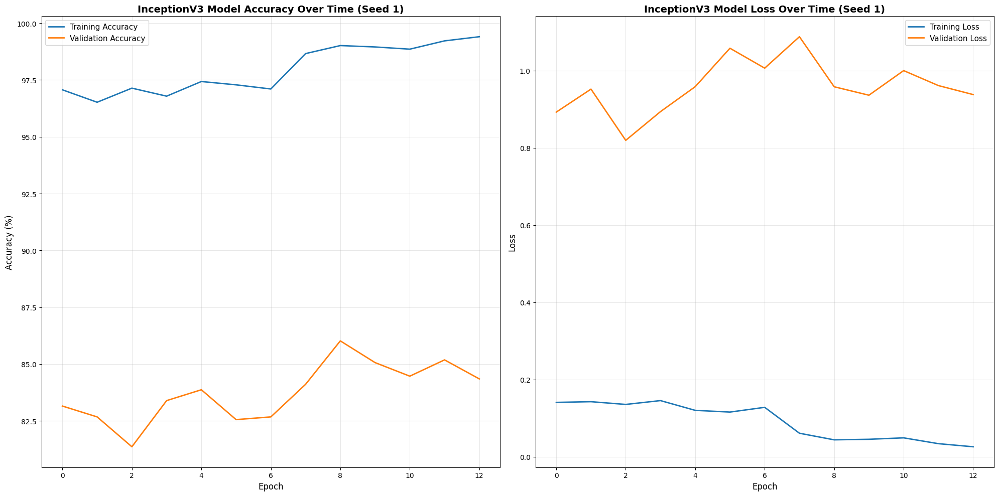

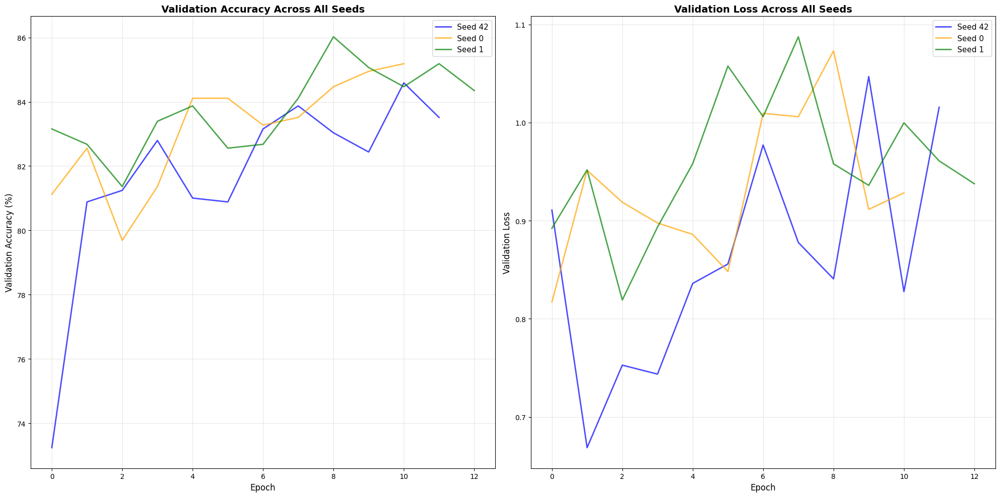

In [72]:
import pickle
import matplotlib.pyplot as plt

# Plot training history for the best seed
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot accuracy
axes[0].plot(history_inception_v3['accuracy'], label='Training Accuracy', linewidth=2)
axes[0].plot(history_inception_v3['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].set_title(f'InceptionV3 Model Accuracy Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Plot loss
axes[1].plot(history_inception_v3['loss'], label='Training Loss', linewidth=2)
axes[1].plot(history_inception_v3['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_title(f'InceptionV3 Model Loss Over Time (Seed {best_seed})', 
                  fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Optional: Plot comparison across all seeds
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

colors = ['blue', 'orange', 'green']
for idx, (seed, history) in enumerate(zip(seeds, all_histories)):
    # Plot validation accuracy for each seed
    axes[0].plot(history['val_accuracy'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)
    
    # Plot validation loss for each seed
    axes[1].plot(history['val_loss'], 
                 label=f'Seed {seed}', 
                 linewidth=2, 
                 color=colors[idx],
                 alpha=0.7)

axes[0].set_title('Validation Accuracy Across All Seeds', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Validation Accuracy (%)', fontsize=12)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Validation Loss Across All Seeds', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Validation Loss', fontsize=12)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


-----------------------------------------------------------
-----------------------------------------------------------

# **DeepFool**

The DeepFool approach attemps to find the minimal input perturbation leading to a classifier error. In the following section we are implementing said approach to generate adversarial examples. The function iteratively perturbs the input data to cross the decision boundary of the classifier, effectively "fooling" the network with the minimal necessary noise. This implementation follows Algorithm 2 (multi-class case) described in the paper "DeepFool: a simple and accurate method to fool deep neural networks" by Seyed-Mohsen Moosavi-Dezfooli, Alhussein Fawzi and Pascal Frossard.

## 1. Implementation

The algorithm iteratively:
1. Computes the gradient of the logit of the current predicted class w.r.t. the input.
2. Computes the gradient of each other class.
3. Approximates the decision boundary hyperplanes and finds the smallest perturbation needed to cross the nearest one.
4. Accumulates this perturbation until the predicted label changes or a maximum number of iterations is reached.

To make the implementation stable:
- We temporarily switch the model to `eval()` mode (to avoid Dropout/BatchNorm randomness).
- We carefully reset `x.grad` before each `backward()` call to avoid gradient accumulation.
- We keep everything on the proper device (CPU / GPU) automatically.

The function returns:
- The total perturbation `r_tot` (NumPy array, same shape as the input),
- The adversarial example `pert_image` (PyTorch tensor),
- The number of iterations,
- The original predicted label and the adversarial label.

In [130]:
import torch
import numpy as np

def deepfool(image, net, num_classes=10, overshoot=0.02, max_iter=50):
    """
    Generic implementation of the multi-class DeepFool attack.
    """
    # Get device from the model (CPU/GPU)
    device = next(net.parameters()).device

    # Clone input and enable gradient tracking
    x = image.clone().detach().to(device)
    x.requires_grad_(True)

    # Save original training state and switch to eval
    was_training = net.training
    net.eval()

    # Initial forward pass (no gradient needed here)
    with torch.no_grad():
        output = net(x)
    f_image = output.detach().cpu().numpy().flatten()

    # Sort class scores in descending order
    I = f_image.argsort()[::-1]
    label_orig = int(I[0])
    label_pert = label_orig

    # Initialize total perturbation
    input_shape = x.shape
    r_tot = np.zeros(input_shape, dtype=np.float32)

    loop_i = 0

    # Main DeepFool loop
    while (label_pert == label_orig) and (loop_i < max_iter):

        # Recompute logits with gradient tracking
        net.zero_grad()
        if x.grad is not None:
            x.grad.zero_()
        output = net(x)
        f_image = output.detach().cpu().numpy().flatten()
        I = f_image.argsort()[::-1]

        # 1) Compute gradient of the original class
        net.zero_grad()
        if x.grad is not None:
            x.grad.zero_()
        output[0, label_orig].backward(retain_graph=True)
        grad_orig = x.grad.detach().cpu().numpy().copy()

        # 2) Find the closest (in L2) decision boundary among all other classes
        pert = np.inf
        w_best = np.zeros(input_shape, dtype=np.float32)

        for k in range(num_classes):
            if k == label_orig:
                continue

            # Compute gradient of class k
            net.zero_grad()
            if x.grad is not None:
                x.grad.zero_()
            output[0, k].backward(retain_graph=True)
            grad_k = x.grad.detach().cpu().numpy().copy()

            # w_k = grad(f_k) - grad(f_orig)
            w_k = grad_k - grad_orig
            # f_k' = f_k - f_orig
            f_k = f_image[k] - f_image[label_orig]

            # Compute |f_k'| / ||w_k||_2
            w_k_flat = w_k.flatten()
            w_norm = np.linalg.norm(w_k_flat)
            if w_norm < 1e-8:
                # Skip degenerate directions
                continue

            pert_k = abs(f_k) / w_norm

            # Keep the smallest perturbation
            if pert_k < pert:
                pert = pert_k
                w_best = w_k

        # If no valid direction found, stop
        if not np.isfinite(pert):
            break

        # 3) Compute the per-iteration perturbation r_i
        w_best_flat = w_best.flatten()
        w_best_norm = np.linalg.norm(w_best_flat)
        r_i = (pert + 1e-4) * w_best / (w_best_norm + 1e-8)

        # 4) Accumulate the total perturbation
        r_tot = r_tot + r_i.astype(np.float32)

        # 5) Generate new adversarial example with overshoot
        pert_tensor = torch.from_numpy((1 + overshoot) * r_tot).to(device)
        x = (image.to(device) + pert_tensor).detach()
        x.requires_grad_(True)

        # 6) Predict new class
        with torch.no_grad():
            output = net(x)
        f_image = output.detach().cpu().numpy().flatten()
        label_pert = int(np.argmax(f_image))

        loop_i += 1

    # Restore original training state
    if was_training:
        net.train()

    # Final perturbation and adversarial example
    r_tot = (1 + overshoot) * r_tot
    pert_image = x.detach()

    return r_tot, pert_image, loop_i, label_orig, label_pert


## 2. Robustness Evaluation Metric

To quantitatively measure how robust a classifier is to adversarial perturbations,
we use the metric defined in the DeepFool paper:

$\rho_{\text{adv}} = \mathbb{E}\left[ \frac{\lVert r \rVert_2}{\lVert x \rVert_2} \right]$.

where:
- **r** is the perturbation found by DeepFool that changes the classifier's decision,
- **x** is the original input sample.

The function below:

- iterates over samples from a given `DataLoader` (validation or test),
- applies `deepfool()` to each sample,  
- if the attack is successful (prediction changes), it stores $\frac{\lVert r \rVert_2}{\lVert x \rVert_2}$,
- returns the average value over the considered samples.

It is **independent of the architecture**:
- works for our CNN on spectrograms,
- will also work for an RNN (as long as the DataLoader gives inputs with the correct shape).

In [131]:
def evaluate_robustness(net, test_loader, num_samples=100, num_classes=10):
    """
    Compute the average robustness ρ_adv of a model with respect to the DeepFool attack.
    """
    device = next(net.parameters()).device
    net.eval()

    robustness_values = []
    print(f"Calculating robustness for up to {num_samples} samples...")

    count = 0
    for inputs, labels in test_loader:
        if count >= num_samples:
            break

        inputs = inputs.to(device)
        labels = labels.to(device)

        batch_size = inputs.size(0)
        for i in range(batch_size):
            if count >= num_samples:
                break

            img = inputs[i:i+1]  # keep batch dimension = 1
            target = labels[i]

            # Apply DeepFool
            r_tot, adv_img, iters, l_orig, l_new = deepfool(
                img, net, num_classes=num_classes
            )

            # Consider only successful attacks (prediction changed)
            if l_orig != l_new:
                r_norm = np.linalg.norm(r_tot)
                img_norm = np.linalg.norm(img.detach().cpu().numpy())
                if img_norm > 1e-8:
                    rho = r_norm / img_norm
                    robustness_values.append(rho)

            count += 1

    if len(robustness_values) == 0:
        print("DeepFool did not successfully fool the model on any of the tested samples.")
        return None

    avg_robustness = float(np.mean(robustness_values))
    print(f"Average Robustness (rho_adv): {avg_robustness:.6f}")
    return avg_robustness


## 3. Attack Visualization

To better understand how the attack works in practice, we can visualize:
1. the **original input** (mel-spectrogram or waveform),
2. the **perturbation** found by DeepFool (amplified visually),
3. the resulting **adversarial example**.

The function below:
- takes a trained model and a `DataLoader`,
- picks the first sample in the first batch,
- applies `deepfool()` to generate an adversarial example,
- plots original, noise and adversarial side by side,
- prints the original and adversarial predicted classes.

The plotting logic automatically detects whether the data is 2D (typical for spectrograms)
or 1D (typical for raw audio), and chooses an appropriate visualization.

In [135]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_attack(net, loader, classes_list, num_classes=10, idx=None, random_sample=False):
    """
    Visualise the effect of the DeepFool attack on a single example from `loader`.
    """
    device = next(net.parameters()).device
    net.eval()

    dataset = loader.dataset
    n_samples = len(dataset)

    # Choose which sample to attack
    if random_sample:
        idx = np.random.randint(0, n_samples)
    elif idx is None:
        idx = 0  # default: first sample

    img, label = dataset[idx]
    true_label = int(label)

    # Prepare tensor for the model (add batch dimension)
    img_batch = img.unsqueeze(0).to(device)

    # Apply DeepFool
    r, adv_img, iters, l_orig, l_new = deepfool(img_batch, net, num_classes=num_classes)

    # Convert to numpy for plotting
    orig_np = img_batch.detach().cpu().numpy().squeeze()
    adv_np = adv_img.detach().cpu().numpy().squeeze()
    noise_np = r.squeeze()

    plt.figure(figsize=(15, 5))

    # 1. Original input
    plt.subplot(1, 3, 1)
    title_orig = f"Original prediction: {classes_list[l_orig]}"
    if l_orig == true_label:
        title_orig += " (correct label)"
    plt.title(title_orig)

    if orig_np.ndim == 2:
        # 2D input (e.g., spectrogram)
        plt.imshow(orig_np, origin='lower', aspect='auto', cmap='viridis')
    else:
        # 1D input (e.g., waveform)
        plt.plot(orig_np)

    # 2. Perturbation (noise)
    plt.subplot(1, 3, 2)
    plt.title("Perturbation (DeepFool)")
    if noise_np.ndim == 2:
        plt.imshow(noise_np, origin='lower', aspect='auto', cmap='coolwarm')
        plt.colorbar()
    else:
        plt.plot(noise_np)

    # 3. Adversarial example
    plt.subplot(1, 3, 3)
    plt.title(f"Adversarial prediction: {classes_list[l_new]}")
    if adv_np.ndim == 2:
        plt.imshow(adv_np, origin='lower', aspect='auto', cmap='viridis')
    else:
        plt.plot(adv_np)

    plt.tight_layout()
    plt.show()

    print(f"Sample index:          {idx}")
    print(f"True label:            {classes_list[true_label]}")
    print(f"Original prediction:   {classes_list[l_orig]}")
    print(f"Adversarial prediction:{classes_list[l_new]}")
    print(f"DeepFool converged in {iters} iterations.")


## 4. DeepFool robustness across all CNN-based models

In this section we apply the DeepFool attack to all CNN-based models implemented in this project
(e.g., the Custom CNN and different InceptionV3 variants). For each model we:

1. Compute the average robustness value ρ_adv on a subset of the validation set.

2. Visualise a few DeepFool attacks to qualitatively inspect how the perturbations affect each model.

Finally, we summarise the results in a bar plot comparing the robustness of all models.



4. DeepFool robustness across all CNN-based models 
Using device: cpu
Loading models from: /Users/msserralheiro/Desktop/uni/3ano/AC2/projeto/Models
✓ Loaded Custom CNN without data augmentation
✓ Loaded Custom CNN with data augmentation

>>> Loading Inception weights from: ./Models/inception_v3.pth
    - Layers matched and loaded: 584
    - Layers skipped due to shape mismatch: 0
    - Total layers in current model: 584
✓ Weights loaded (partial load with shape-check).
✓ Loaded InceptionV3 with transfer learning

>>> Loading Inception weights from: ./Models/inception_v3_noTF.pth
    - Layers matched and loaded: 577
    - Layers skipped due to shape mismatch: 1
    - Total layers in current model: 584
✓ Weights loaded (partial load with shape-check).
✓ Loaded InceptionV3 without transfer learning

Instantiating InceptionV3 (without TL and without data augmentation)...

>>> Loading Inception weights from: ./Models/inception_v3_noTF_noAug.pth
    - Layers matched and loaded: 579
    - La

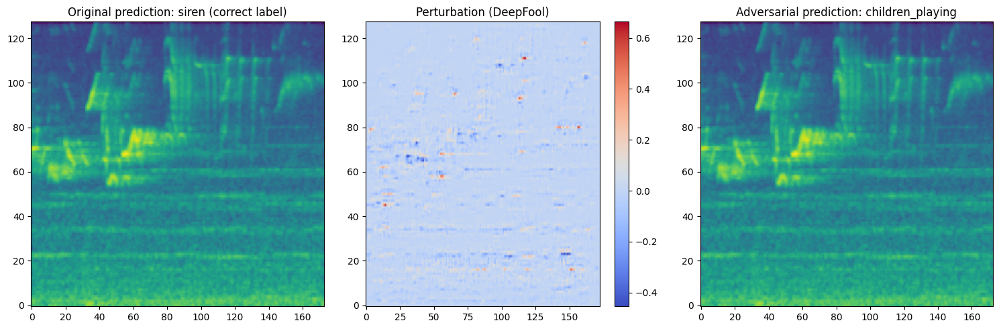

Sample index:          695
True label:            siren
Original prediction:   siren
Adversarial prediction:children_playing
DeepFool converged in 2 iterations.

--- DeepFool attack on random sample #2 ---


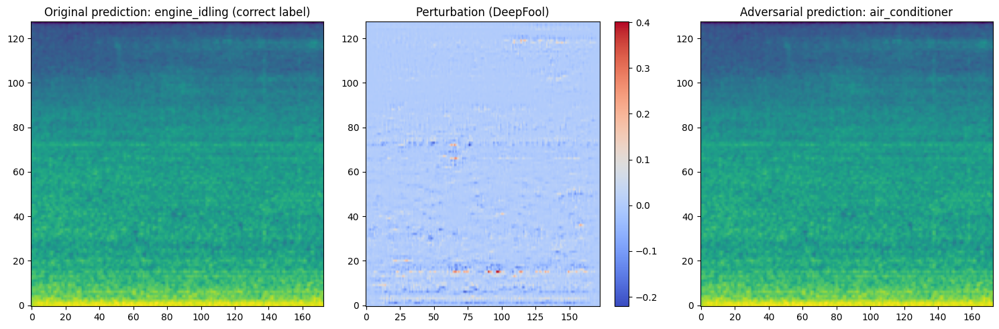

Sample index:          97
True label:            engine_idling
Original prediction:   engine_idling
Adversarial prediction:air_conditioner
DeepFool converged in 2 iterations.

########## Custom CNN with data augmentation ##########

--- DeepFool attack on random sample #1 ---


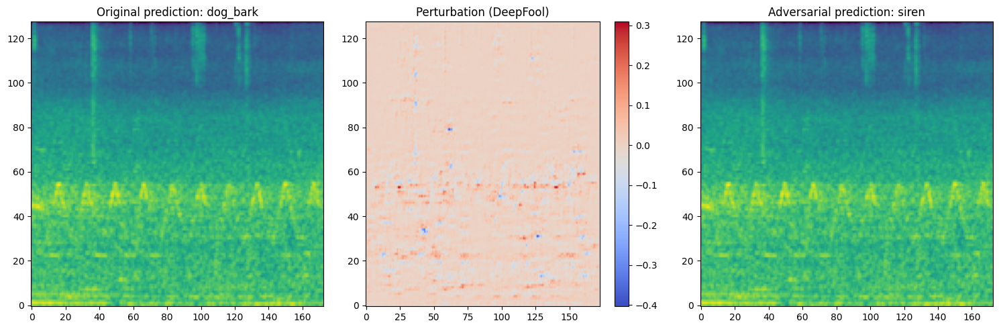

Sample index:          806
True label:            siren
Original prediction:   dog_bark
Adversarial prediction:siren
DeepFool converged in 1 iterations.

--- DeepFool attack on random sample #2 ---


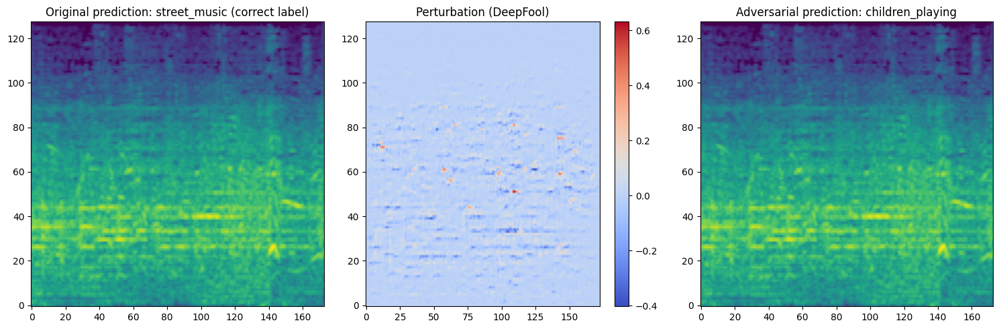

Sample index:          747
True label:            street_music
Original prediction:   street_music
Adversarial prediction:children_playing
DeepFool converged in 2 iterations.

########## InceptionV3 with Transfer Learning ##########

--- DeepFool attack on random sample #1 ---


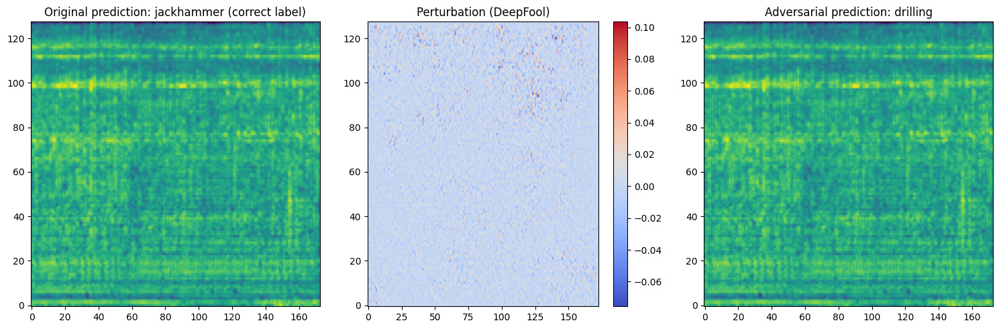

Sample index:          455
True label:            jackhammer
Original prediction:   jackhammer
Adversarial prediction:drilling
DeepFool converged in 2 iterations.

--- DeepFool attack on random sample #2 ---


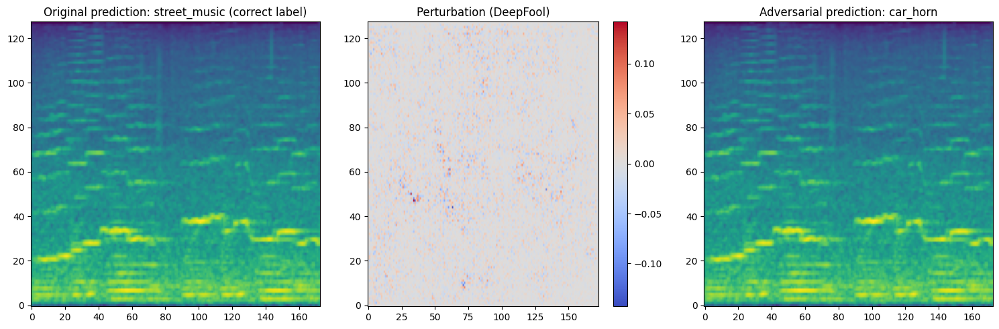

Sample index:          65
True label:            street_music
Original prediction:   street_music
Adversarial prediction:car_horn
DeepFool converged in 4 iterations.

########## InceptionV3 without Transfer Learning ##########

--- DeepFool attack on random sample #1 ---


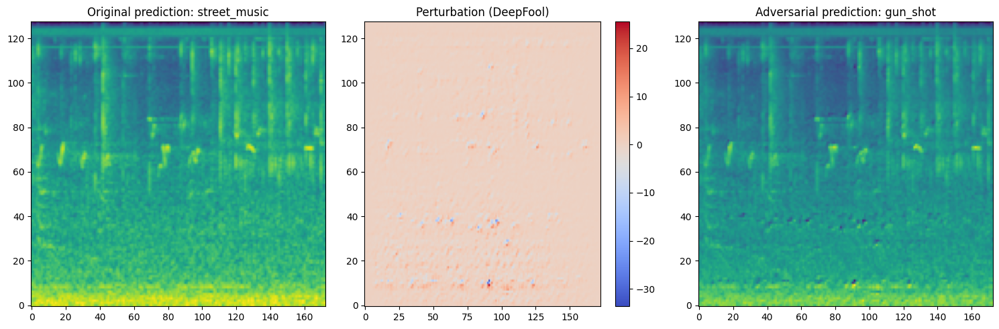

Sample index:          771
True label:            air_conditioner
Original prediction:   street_music
Adversarial prediction:gun_shot
DeepFool converged in 3 iterations.

--- DeepFool attack on random sample #2 ---


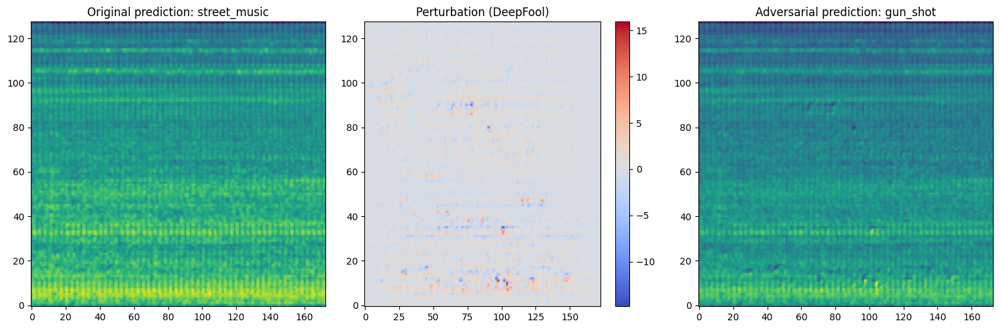

Sample index:          265
True label:            jackhammer
Original prediction:   street_music
Adversarial prediction:gun_shot
DeepFool converged in 3 iterations.

########## InceptionV3 without Transfer Learning and without data augmentation) ##########

--- DeepFool attack on random sample #1 ---


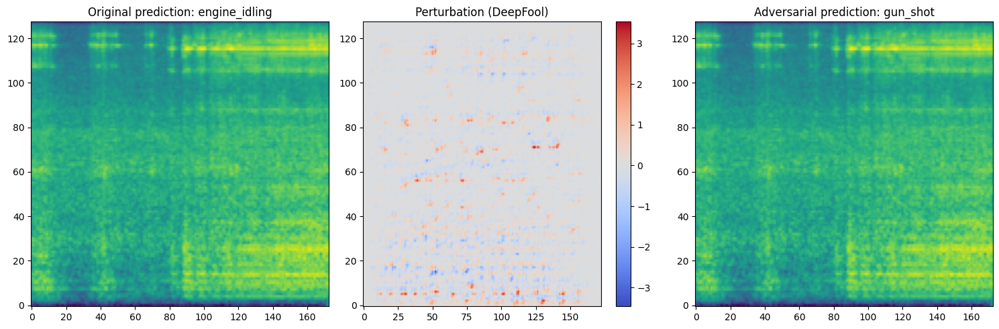

Sample index:          829
True label:            drilling
Original prediction:   engine_idling
Adversarial prediction:gun_shot
DeepFool converged in 3 iterations.

--- DeepFool attack on random sample #2 ---


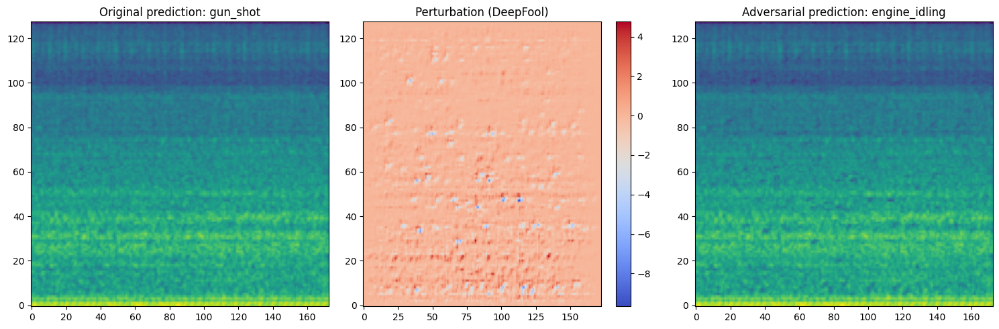

Sample index:          195
True label:            engine_idling
Original prediction:   gun_shot
Adversarial prediction:engine_idling
DeepFool converged in 1 iterations.


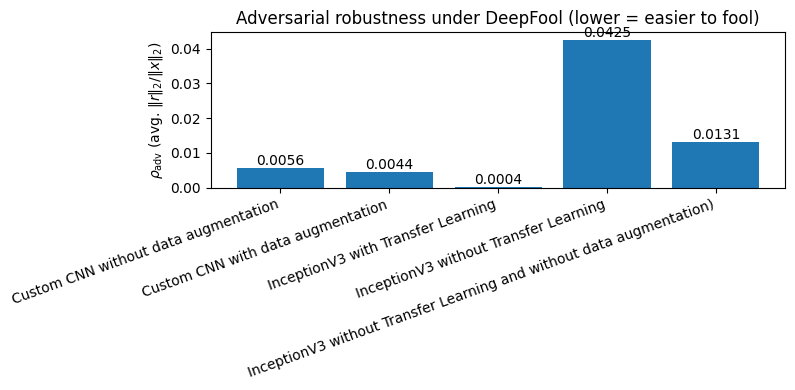

In [153]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt

print("\n" + "=" * 60)
print("4. DeepFool robustness across all CNN-based models ")
print("=" * 60)

# Device and models directory
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

models_dir = "./Models"  # folder where all .pth files are stored
print(f"Loading models from: {os.path.abspath(models_dir)}")

# Helper: load state_dict and fix prefix for InceptionV3Custom if needed
def load_inception_custom_weights(model, ckpt_path, device):
    print(f"\n>>> Loading Inception weights from: {ckpt_path}")
    state_raw = torch.load(ckpt_path, map_location=device)

    model_state = model.state_dict()

    matched = 0
    skipped_shape = 0
    fixed_state = {}

    for k, v in state_raw.items():
        if k.startswith("inception."):
            k2 = k
        else:
            k2 = "inception." + k

        if k2 in model_state:
            if model_state[k2].shape == v.shape:
                fixed_state[k2] = v
                matched += 1
            else:
                skipped_shape += 1
        else:
            pass

    updated_state = model_state.copy()
    updated_state.update(fixed_state)

    print(f"    - Layers matched and loaded: {matched}")
    print(f"    - Layers skipped due to shape mismatch: {skipped_shape}")
    print(f"    - Total layers in current model: {len(model_state)}")

    model.load_state_dict(updated_state, strict=False)

    model.to(device)
    model.eval()
    print("✓ Weights loaded (partial load with shape-check).")
    return model

# =====================================================
# 1) Load all CNN-based models from disk
# =====================================================

# --- Custom CNN without data augmentation ---
custom_cnn_no_aug = CustomCNN(num_classes=10)
custom_cnn_no_aug.load_state_dict(
    torch.load(os.path.join(models_dir, "custom_cnn_no_aug.pth"), map_location=device)
)
custom_cnn_no_aug.to(device)
custom_cnn_no_aug.eval()
print("✓ Loaded Custom CNN without data augmentation")

# --- Custom CNN with data augmentation ---
custom_cnn = CustomCNN(num_classes=10)
custom_cnn.load_state_dict(
    torch.load(os.path.join(models_dir, "custom_cnn.pth"), map_location=device)
)
custom_cnn.to(device)
custom_cnn.eval()
print("✓ Loaded Custom CNN with data augmentation")

# --- InceptionV3 with transfer learning (wrapper: inception_v3_model) ---
inception_v3_model = load_inception_custom_weights(
    inception_v3_model,
    os.path.join(models_dir, "inception_v3.pth"),
    device
)
print("✓ Loaded InceptionV3 with transfer learning")

# --- InceptionV3 without transfer learning (wrapper: inception_v3_model_noTF) ---
inception_v3_model_noTF = load_inception_custom_weights(
    inception_v3_model_noTF,
    os.path.join(models_dir, "inception_v3_noTF.pth"),
    device
)
print("✓ Loaded InceptionV3 without transfer learning")

# --- InceptionV3 without TL, without augmentation ---
has_noTF_noAug = False
try:
    print("\nInstantiating InceptionV3 (without TL and without data augmentation)...")

    backbone_noTF_noAug = inception_v3(weights=None) 
    backbone_noTF_noAug.transform_input = False

    original_conv = backbone_noTF_noAug.Conv2d_1a_3x3.conv
    new_conv = nn.Conv2d(
        in_channels=1,
        out_channels=original_conv.out_channels,
        kernel_size=original_conv.kernel_size,
        stride=original_conv.stride,
        padding=original_conv.padding,
        bias=(original_conv.bias is not None)
    )
    backbone_noTF_noAug.Conv2d_1a_3x3.conv = new_conv

    num_features = backbone_noTF_noAug.fc.in_features
    backbone_noTF_noAug.fc = nn.Linear(num_features, num_classes)

    if backbone_noTF_noAug.AuxLogits is not None:
        aux_features = backbone_noTF_noAug.AuxLogits.fc.in_features
        backbone_noTF_noAug.AuxLogits.fc = nn.Linear(aux_features, num_classes)

    inception_v3_model_noTF_noAug = InceptionV3Custom(backbone_noTF_noAug)

    inception_v3_model_noTF_noAug = load_inception_custom_weights(
        inception_v3_model_noTF_noAug,
        os.path.join(models_dir, "inception_v3_noTF_noAug.pth"),
        device
    )

    has_noTF_noAug = True
    print("✓ Loaded InceptionV3 (no TL, no augmentation)")

except FileNotFoundError:
    print("⚠ File 'inception_v3_noTF_noAug.pth' not found. Skipping this variant.")


print("✓ All available models loaded successfully.")

# =====================================================
# 2) Get class names and number of classes
# =====================================================
try:
    classes = list(label_encoder.classes_)
except NameError:
    classes = np.load(
        './data/processed/label_encoder_classes.npy',
        allow_pickle=True
    ).tolist()

num_classes = len(classes)
print(f"Number of classes: {num_classes}")
print(f"Classes: {classes}")

# Validation DataLoader used for all CNN models
val_loader_cnn = val_loader

# =====================================================
# 3) Register all CNN-based models to compare
# =====================================================
models = {
    "Custom CNN without data augmentation": custom_cnn_no_aug,
    "Custom CNN with data augmentation": custom_cnn,
    "InceptionV3 with Transfer Learning": inception_v3_model,
    "InceptionV3 without Transfer Learning": inception_v3_model_noTF,
    "InceptionV3 without Transfer Learning and without data augmentation)": inception_v3_model_noTF_noAug
}

print("\nModels to evaluate with DeepFool:")
for name in models.keys():
    print("  •", name)

# =====================================================
# 4) Compute robustness (ρ_adv) for each model
# =====================================================
rho_results = {}

for model_name, model in models.items():
    print(f"\n=== Robustness of {model_name} ===")
    rho = evaluate_robustness(
        model,
        val_loader_cnn,
        num_samples=100,        # number of validation samples to attack
        num_classes=num_classes
    )
    rho_results[model_name] = rho
    print(f"rho_adv ({model_name}) = {rho}\n")

# =====================================================
# 5) Visualise a few DeepFool attacks for each model
# =====================================================
print("\n=== Visualising DeepFool on several validation samples for each model ===")
for model_name, model in models.items():
    print(f"\n########## {model_name} ##########")
    for i in range(2):  # change 2 for more visualisations per model
        print(f"\n--- DeepFool attack on random sample #{i+1} ---")
        visualize_attack(
            model,
            val_loader_cnn,
            classes,
            num_classes=num_classes,
            random_sample=True
        )

# =====================================================
# 6) Bar plot comparing robustness (ρ_adv) across all models
# =====================================================
model_names = list(rho_results.keys())
rho_values = [rho_results[m] for m in model_names]

plt.figure(figsize=(8, 4))
plt.bar(model_names, rho_values)
plt.ylabel(r'$\rho_{\mathrm{adv}}$ (avg. $\|r\|_2 / \|x\|_2$)')
plt.title('Adversarial robustness under DeepFool (lower = easier to fool)')
plt.xticks(rotation=20, ha='right')

for i, v in enumerate(rho_values):
    if v is not None:
        plt.text(i, v, f'{v:.4f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

### Conclusion

The results show substantial differences in adversarial robustness across the evaluated CNN architectures. The Custom CNN models exhibit low resistance to DeepFool, with ρ_adv values around 0.004–0.005, indicating that only very small perturbations are needed to alter the model’s prediction. Applying data augmentation slightly improves robustness, but both versions remain easy to fool.
The InceptionV3 with Transfer Learning stands out as the most robust model, achieving an extremely low perturbation ratio (ρ_adv ≈ 0.00037), which reflects much more stable decision boundaries. In contrast, the InceptionV3 trained from scratch (without TL) is highly vulnerable (ρ_adv ≈ 0.0425), suggesting that removing pre-training leads to fragile classification margins. The version without TL and without data augmentation performs marginally better but remains significantly less robust than the TL variant.
Overall, the results confirm that transfer learning plays a crucial role in the adversarial robustness of InceptionV3, while the custom CNNs—despite performing reasonably well on the task—remain highly susceptible to small, carefully crafted perturbations generated by DeepFool.


----------------------------------------------------
--------------------------------------------------------

# **Observations and conclusions**

Some observations on the results of the custom CNN and the inception model

### Custom CNN wihtout augmented data

- **Confusion Matrix**

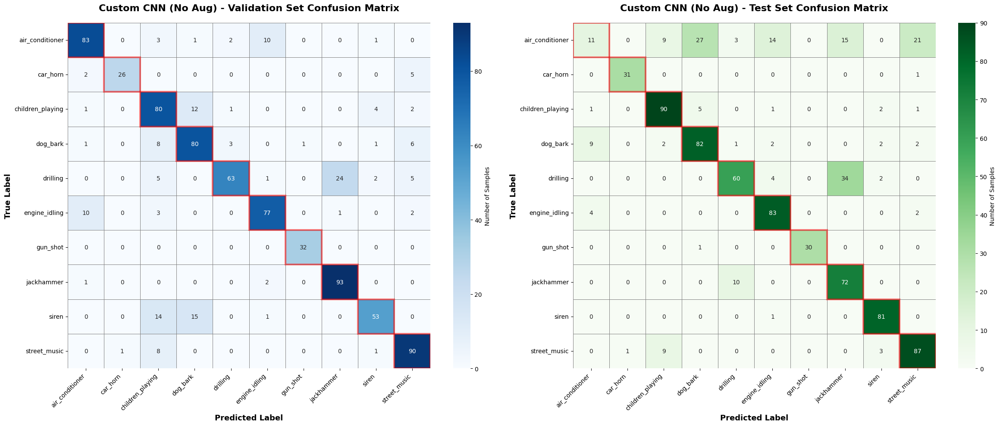


CUSTOM CNN (NO AUGMENTATION) - CONFUSION MATRIX RESULTS
Validation Accuracy: 80.88%
Test Accuracy: 76.84%


In [74]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import torch

# Load the best saved model
custom_cnn.load_state_dict(torch.load('Models/custom_cnn_no_aug.pth'))
custom_cnn = custom_cnn.to(device)
custom_cnn.eval()

# Function to get predictions
def get_predictions(X_data, model, device, batch_size=32):
    y_pred_list = []
    with torch.no_grad():
        # Convert data to tensor if not already
        if not isinstance(X_data, torch.Tensor):
            X_tensor = torch.FloatTensor(X_data).permute(0, 3, 1, 2)
        else:
            X_tensor = X_data
        
        # Move to device
        X_tensor = X_tensor.to(device)
        
        # Get predictions in batches to avoid memory issues
        for i in range(0, len(X_tensor), batch_size):
            batch = X_tensor[i:i+batch_size]
            outputs = model(batch)
            _, predicted = torch.max(outputs, 1)
            y_pred_list.extend(predicted.cpu().numpy())
    
    return np.array(y_pred_list)

# Get predictions for validation set
y_pred_val = get_predictions(X_val, custom_cnn, device)

# Get predictions for test set
y_pred_test = get_predictions(X_test, custom_cnn, device)

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Create confusion matrices
cm_val = confusion_matrix(y_val, y_pred_val)
cm_test = confusion_matrix(y_test, y_pred_test)

# Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Plot validation confusion matrix
sns.heatmap(cm_val, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[0])

axes[0].set_title('Custom CNN (No Aug) - Validation Set Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[0].set_xticklabels(class_names, rotation=45, ha='right')
axes[0].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for validation
for i in range(len(class_names)):
    axes[0].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

# Plot test confusion matrix
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Greens', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[1])

axes[1].set_title('Custom CNN (No Aug) - Test Set Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[1].set_xticklabels(class_names, rotation=45, ha='right')
axes[1].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for test
for i in range(len(class_names)):
    axes[1].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

plt.tight_layout()
plt.show()

# Print accuracy for both sets
val_accuracy = np.trace(cm_val) / np.sum(cm_val) * 100
test_accuracy = np.trace(cm_test) / np.sum(cm_test) * 100

print("\n" + "=" * 60)
print("CUSTOM CNN (NO AUGMENTATION) - CONFUSION MATRIX RESULTS")
print("=" * 60)
print(f"Validation Accuracy: {val_accuracy:.2f}%")
print(f"Test Accuracy: {test_accuracy:.2f}%")
print("=" * 60)

- **Most confused class pairs**

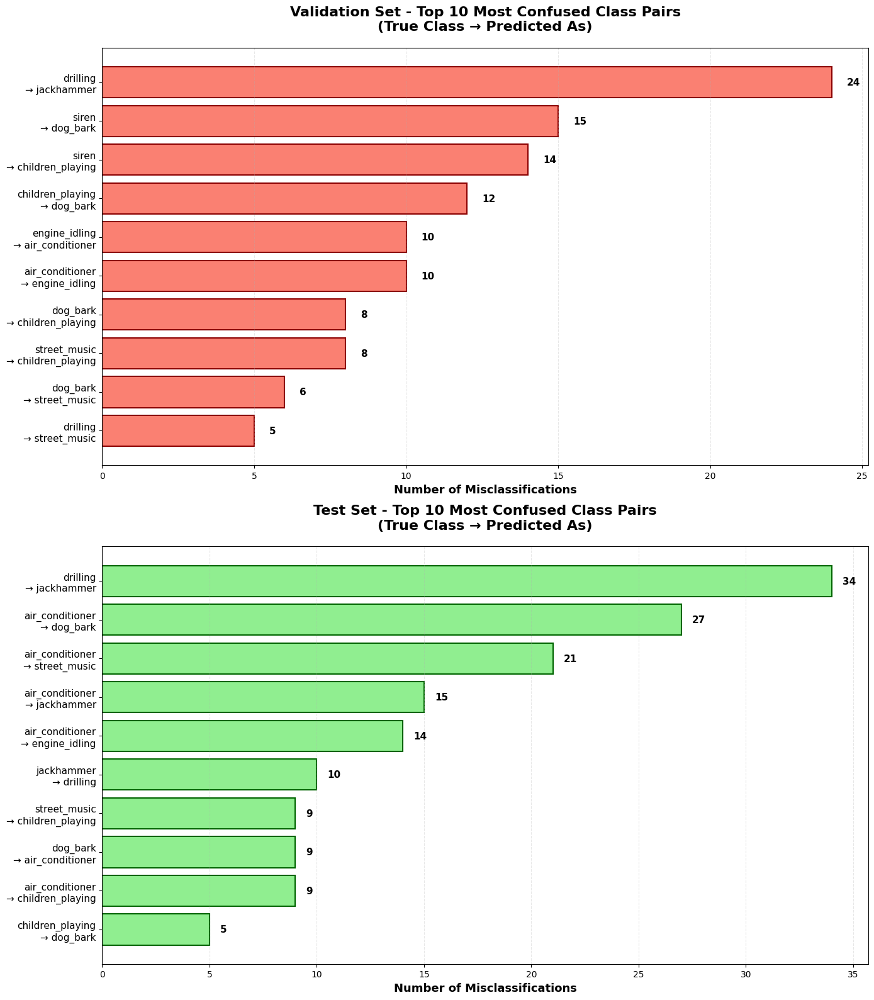

In [75]:
# Function to analyze confused pairs
def analyze_confused_pairs(cm, class_names):
    confused_pairs = []
    for i in range(len(cm)):
        for j in range(len(cm)):
            if i != j and cm[i, j] > 0:
                confused_pairs.append({
                    'true_class': class_names[i],
                    'predicted_as': class_names[j],
                    'count': cm[i, j]
                })
    
    confused_df = pd.DataFrame(confused_pairs)
    confused_df = confused_df.sort_values('count', ascending=False)
    return confused_df

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Analyze both validation and test sets
confused_df_val = analyze_confused_pairs(cm_val, class_names)
confused_df_test = analyze_confused_pairs(cm_test, class_names)

# Create figure with two subplots (validation on top, test on bottom)
fig, axes = plt.subplots(2, 1, figsize=(14, 16))

# Plot validation set (top)
top_n_val = min(10, len(confused_df_val))
top_confused_val = confused_df_val.head(top_n_val)

bars_val = axes[0].barh(range(top_n_val), top_confused_val['count'].values, 
                        color='salmon', edgecolor='darkred', linewidth=1.5)

labels_val = [f"{row['true_class']}\n→ {row['predicted_as']}" 
              for _, row in top_confused_val.iterrows()]
axes[0].set_yticks(range(top_n_val))
axes[0].set_yticklabels(labels_val, fontsize=11)

for i, (idx, row) in enumerate(top_confused_val.iterrows()):
    axes[0].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[0].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[0].set_title('Validation Set - Top 10 Most Confused Class Pairs\n(True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].grid(axis='x', alpha=0.3, linestyle='--')
axes[0].invert_yaxis()

# Plot test set (bottom)
top_n_test = min(10, len(confused_df_test))
top_confused_test = confused_df_test.head(top_n_test)

bars_test = axes[1].barh(range(top_n_test), top_confused_test['count'].values, 
                         color='lightgreen', edgecolor='darkgreen', linewidth=1.5)

labels_test = [f"{row['true_class']}\n→ {row['predicted_as']}" 
               for _, row in top_confused_test.iterrows()]
axes[1].set_yticks(range(top_n_test))
axes[1].set_yticklabels(labels_test, fontsize=11)

for i, (idx, row) in enumerate(top_confused_test.iterrows()):
    axes[1].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[1].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[1].set_title('Test Set - Top 10 Most Confused Class Pairs\n(True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].grid(axis='x', alpha=0.3, linestyle='--')
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()


- **Error Analysis per class**

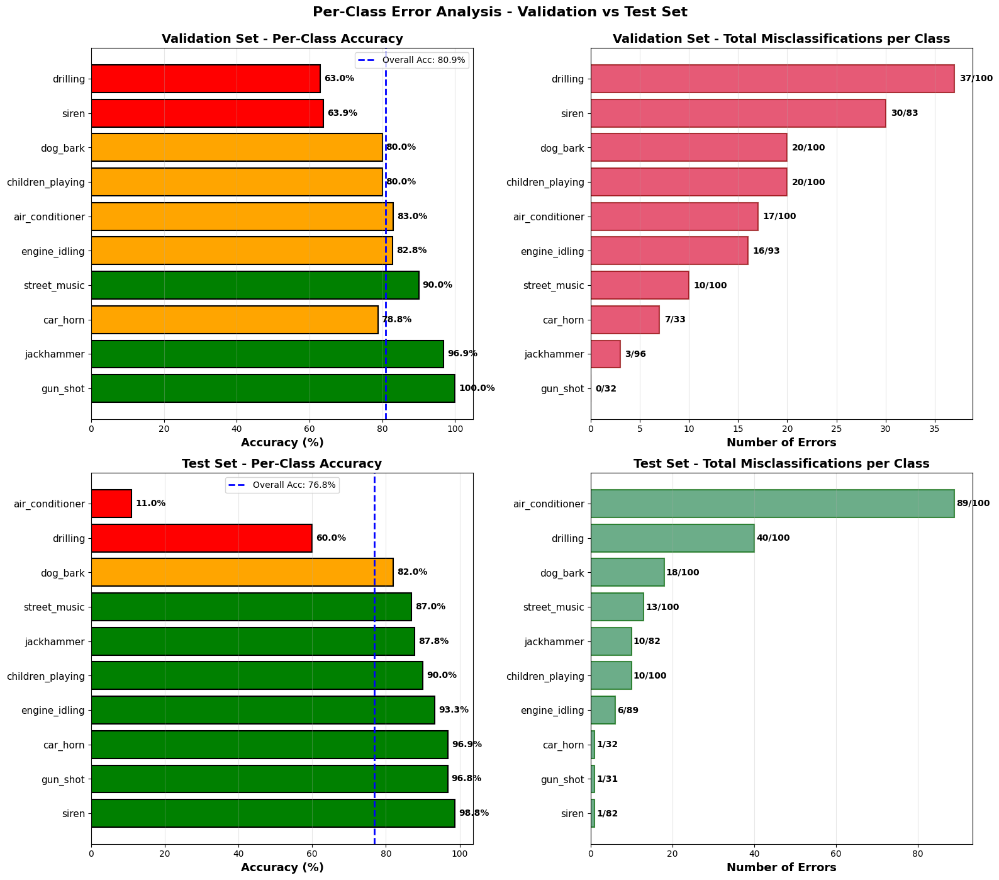


VALIDATION SET - Per-Class Statistics:
           Class  Total  Correct  Errors  Accuracy
        drilling    100       63      37  0.630000
           siren     83       53      30  0.638554
        dog_bark    100       80      20  0.800000
children_playing    100       80      20  0.800000
 air_conditioner    100       83      17  0.830000
   engine_idling     93       77      16  0.827957
    street_music    100       90      10  0.900000
        car_horn     33       26       7  0.787879
      jackhammer     96       93       3  0.968750
        gun_shot     32       32       0  1.000000

TEST SET - Per-Class Statistics:
           Class  Total  Correct  Errors  Accuracy
 air_conditioner    100       11      89  0.110000
        drilling    100       60      40  0.600000
        dog_bark    100       82      18  0.820000
    street_music    100       87      13  0.870000
      jackhammer     82       72      10  0.878049
children_playing    100       90      10  0.900000
   engin

In [76]:
# Function to calculate per-class metrics
def calculate_class_metrics(cm, class_names):
    class_correct = cm.diagonal()
    class_total = cm.sum(axis=1)
    class_errors = class_total - class_correct
    class_accuracy = class_correct / class_total
    
    error_analysis = pd.DataFrame({
        'Class': class_names,
        'Total': class_total,
        'Correct': class_correct,
        'Errors': class_errors,
        'Accuracy': class_accuracy
    })
    error_analysis = error_analysis.sort_values('Errors', ascending=False)
    return error_analysis

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Calculate metrics for both sets
error_analysis_val = calculate_class_metrics(cm_val, class_names)
error_analysis_test = calculate_class_metrics(cm_test, class_names)

# Calculate overall accuracies
val_overall_accuracy = np.trace(cm_val) / np.sum(cm_val)
test_overall_accuracy = np.trace(cm_test) / np.sum(cm_test)

# Create figure with 2 rows (validation top, test bottom)
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# ============= VALIDATION SET (Top Row) =============

# Validation - Accuracy by class
colors_val = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
              for acc in error_analysis_val['Accuracy']]
axes[0, 0].barh(range(len(error_analysis_val)), 
                error_analysis_val['Accuracy'] * 100, 
                color=colors_val, edgecolor='black', linewidth=1.5)
axes[0, 0].set_yticks(range(len(error_analysis_val)))
axes[0, 0].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[0, 0].set_title('Validation Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[0, 0].axvline(x=val_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {val_overall_accuracy*100:.1f}%')
axes[0, 0].legend()
axes[0, 0].grid(axis='x', alpha=0.3)
axes[0, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Validation - Number of errors by class
axes[0, 1].barh(range(len(error_analysis_val)), 
                error_analysis_val['Errors'], 
                color='crimson', edgecolor='darkred', linewidth=1.5, alpha=0.7)
axes[0, 1].set_yticks(range(len(error_analysis_val)))
axes[0, 1].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[0, 1].set_title('Validation Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[0, 1].grid(axis='x', alpha=0.3)
axes[0, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

# ============= TEST SET (Bottom Row) =============

# Test - Accuracy by class
colors_test = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
               for acc in error_analysis_test['Accuracy']]
axes[1, 0].barh(range(len(error_analysis_test)), 
                error_analysis_test['Accuracy'] * 100, 
                color=colors_test, edgecolor='black', linewidth=1.5)
axes[1, 0].set_yticks(range(len(error_analysis_test)))
axes[1, 0].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[1, 0].set_title('Test Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[1, 0].axvline(x=test_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {test_overall_accuracy*100:.1f}%')
axes[1, 0].legend()
axes[1, 0].grid(axis='x', alpha=0.3)
axes[1, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Test - Number of errors by class
axes[1, 1].barh(range(len(error_analysis_test)), 
                error_analysis_test['Errors'], 
                color='seagreen', edgecolor='darkgreen', linewidth=1.5, alpha=0.7)
axes[1, 1].set_yticks(range(len(error_analysis_test)))
axes[1, 1].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[1, 1].set_title('Test Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[1, 1].grid(axis='x', alpha=0.3)
axes[1, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

plt.suptitle('Per-Class Error Analysis - Validation vs Test Set', 
             fontsize=16, fontweight='bold', y=0.995)
             
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\n" + "="*70)
print("VALIDATION SET - Per-Class Statistics:")
print("="*70)
print(error_analysis_val.to_string(index=False))

print("\n" + "="*70)
print("TEST SET - Per-Class Statistics:")
print("="*70)
print(error_analysis_test.to_string(index=False))

----------------------------------------------------

### Custom CNN Model with augmented data

- **Confusion Matrix**

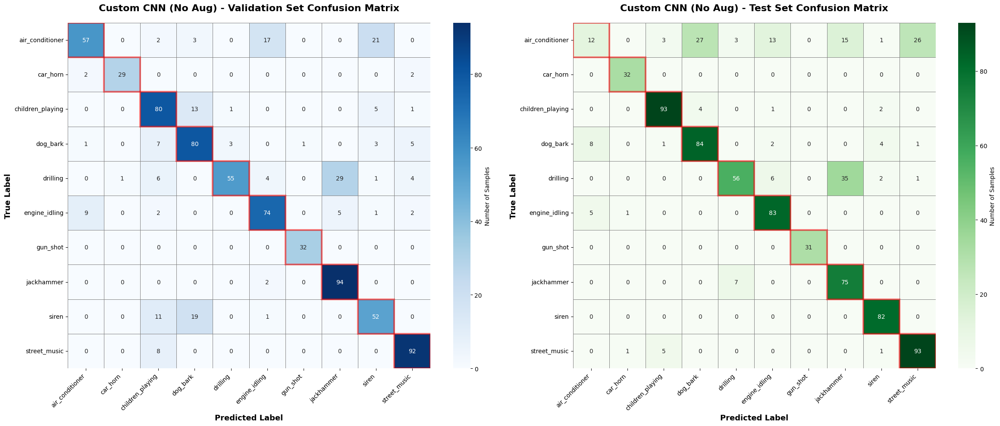


CUSTOM CNN (NO AUGMENTATION) - CONFUSION MATRIX RESULTS
Validation Accuracy: 77.06%
Test Accuracy: 78.55%


In [77]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import torch

# Load the best saved model
custom_cnn.load_state_dict(torch.load('Models/custom_cnn.pth'))
custom_cnn = custom_cnn.to(device)
custom_cnn.eval()

# Function to get predictions
def get_predictions(X_data, model, device, batch_size=32):
    y_pred_list = []
    with torch.no_grad():
        # Convert data to tensor if not already
        if not isinstance(X_data, torch.Tensor):
            X_tensor = torch.FloatTensor(X_data).permute(0, 3, 1, 2)
        else:
            X_tensor = X_data
        
        # Move to device
        X_tensor = X_tensor.to(device)
        
        # Get predictions in batches to avoid memory issues
        for i in range(0, len(X_tensor), batch_size):
            batch = X_tensor[i:i+batch_size]
            outputs = model(batch)
            _, predicted = torch.max(outputs, 1)
            y_pred_list.extend(predicted.cpu().numpy())
    
    return np.array(y_pred_list)

# Get predictions for validation set
y_pred_val = get_predictions(X_val, custom_cnn, device)

# Get predictions for test set
y_pred_test = get_predictions(X_test, custom_cnn, device)

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Create confusion matrices
cm_val = confusion_matrix(y_val, y_pred_val)
cm_test = confusion_matrix(y_test, y_pred_test)

# Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Plot validation confusion matrix
sns.heatmap(cm_val, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[0])

axes[0].set_title('Custom CNN (No Aug) - Validation Set Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[0].set_xticklabels(class_names, rotation=45, ha='right')
axes[0].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for validation
for i in range(len(class_names)):
    axes[0].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

# Plot test confusion matrix
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Greens', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[1])

axes[1].set_title('Custom CNN (No Aug) - Test Set Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[1].set_xticklabels(class_names, rotation=45, ha='right')
axes[1].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for test
for i in range(len(class_names)):
    axes[1].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

plt.tight_layout()
plt.show()

# Print accuracy for both sets
val_accuracy = np.trace(cm_val) / np.sum(cm_val) * 100
test_accuracy = np.trace(cm_test) / np.sum(cm_test) * 100

print("\n" + "=" * 60)
print("CUSTOM CNN (NO AUGMENTATION) - CONFUSION MATRIX RESULTS")
print("=" * 60)
print(f"Validation Accuracy: {val_accuracy:.2f}%")
print(f"Test Accuracy: {test_accuracy:.2f}%")
print("=" * 60)

- **Most confused class pairs**

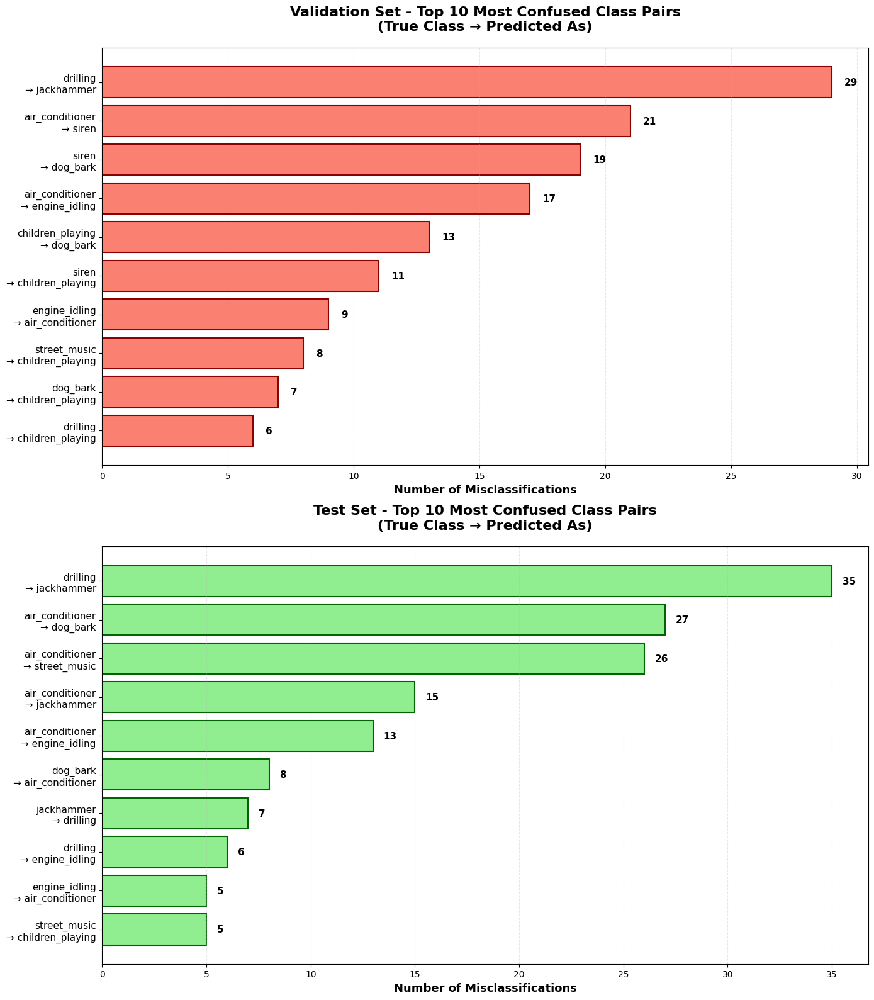

In [78]:
# Function to analyze confused pairs
def analyze_confused_pairs(cm, class_names):
    confused_pairs = []
    for i in range(len(cm)):
        for j in range(len(cm)):
            if i != j and cm[i, j] > 0:
                confused_pairs.append({
                    'true_class': class_names[i],
                    'predicted_as': class_names[j],
                    'count': cm[i, j]
                })
    
    confused_df = pd.DataFrame(confused_pairs)
    confused_df = confused_df.sort_values('count', ascending=False)
    return confused_df

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Analyze both validation and test sets
confused_df_val = analyze_confused_pairs(cm_val, class_names)
confused_df_test = analyze_confused_pairs(cm_test, class_names)

# Create figure with two subplots (validation on top, test on bottom)
fig, axes = plt.subplots(2, 1, figsize=(14, 16))

# Plot validation set (top)
top_n_val = min(10, len(confused_df_val))
top_confused_val = confused_df_val.head(top_n_val)

bars_val = axes[0].barh(range(top_n_val), top_confused_val['count'].values, 
                        color='salmon', edgecolor='darkred', linewidth=1.5)

labels_val = [f"{row['true_class']}\n→ {row['predicted_as']}" 
              for _, row in top_confused_val.iterrows()]
axes[0].set_yticks(range(top_n_val))
axes[0].set_yticklabels(labels_val, fontsize=11)

for i, (idx, row) in enumerate(top_confused_val.iterrows()):
    axes[0].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[0].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[0].set_title('Validation Set - Top 10 Most Confused Class Pairs\n(True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].grid(axis='x', alpha=0.3, linestyle='--')
axes[0].invert_yaxis()

# Plot test set (bottom)
top_n_test = min(10, len(confused_df_test))
top_confused_test = confused_df_test.head(top_n_test)

bars_test = axes[1].barh(range(top_n_test), top_confused_test['count'].values, 
                         color='lightgreen', edgecolor='darkgreen', linewidth=1.5)

labels_test = [f"{row['true_class']}\n→ {row['predicted_as']}" 
               for _, row in top_confused_test.iterrows()]
axes[1].set_yticks(range(top_n_test))
axes[1].set_yticklabels(labels_test, fontsize=11)

for i, (idx, row) in enumerate(top_confused_test.iterrows()):
    axes[1].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[1].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[1].set_title('Test Set - Top 10 Most Confused Class Pairs\n(True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].grid(axis='x', alpha=0.3, linestyle='--')
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()


- **Error Analysis per class**

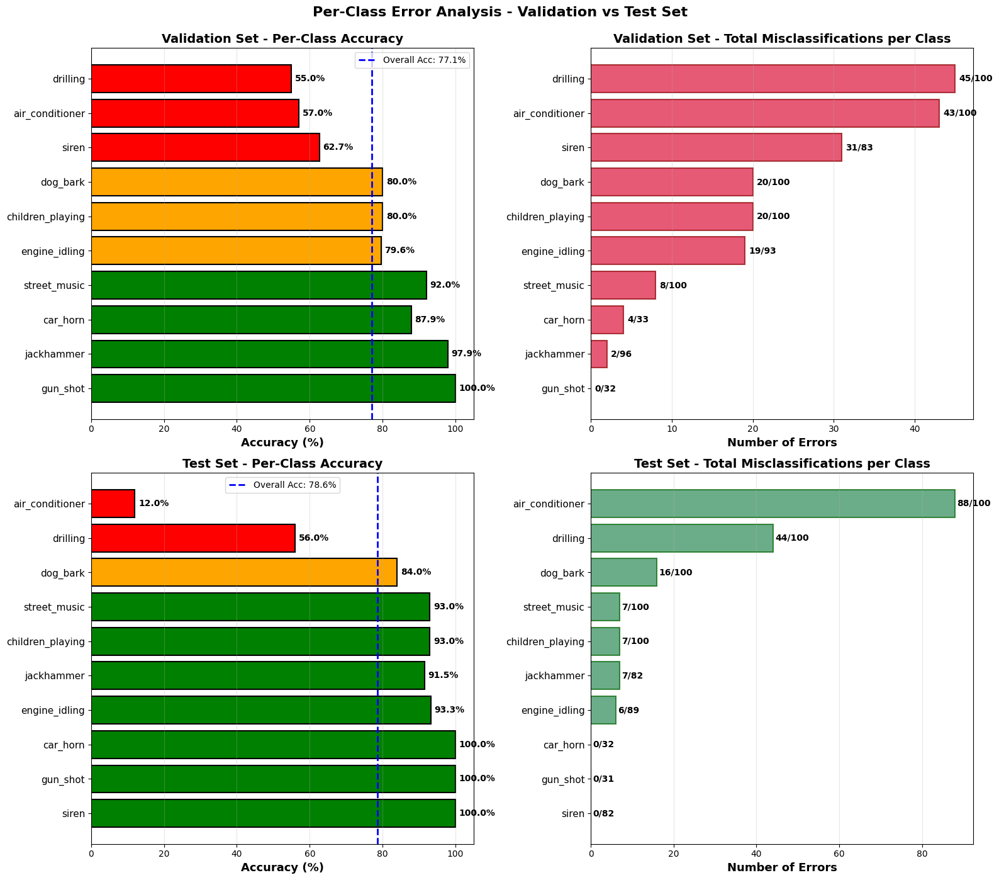


VALIDATION SET - Per-Class Statistics:
           Class  Total  Correct  Errors  Accuracy
        drilling    100       55      45  0.550000
 air_conditioner    100       57      43  0.570000
           siren     83       52      31  0.626506
        dog_bark    100       80      20  0.800000
children_playing    100       80      20  0.800000
   engine_idling     93       74      19  0.795699
    street_music    100       92       8  0.920000
        car_horn     33       29       4  0.878788
      jackhammer     96       94       2  0.979167
        gun_shot     32       32       0  1.000000

TEST SET - Per-Class Statistics:
           Class  Total  Correct  Errors  Accuracy
 air_conditioner    100       12      88  0.120000
        drilling    100       56      44  0.560000
        dog_bark    100       84      16  0.840000
    street_music    100       93       7  0.930000
children_playing    100       93       7  0.930000
      jackhammer     82       75       7  0.914634
   engin

In [79]:
# Function to calculate per-class metrics
def calculate_class_metrics(cm, class_names):
    class_correct = cm.diagonal()
    class_total = cm.sum(axis=1)
    class_errors = class_total - class_correct
    class_accuracy = class_correct / class_total
    
    error_analysis = pd.DataFrame({
        'Class': class_names,
        'Total': class_total,
        'Correct': class_correct,
        'Errors': class_errors,
        'Accuracy': class_accuracy
    })
    error_analysis = error_analysis.sort_values('Errors', ascending=False)
    return error_analysis

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Calculate metrics for both sets
error_analysis_val = calculate_class_metrics(cm_val, class_names)
error_analysis_test = calculate_class_metrics(cm_test, class_names)

# Calculate overall accuracies
val_overall_accuracy = np.trace(cm_val) / np.sum(cm_val)
test_overall_accuracy = np.trace(cm_test) / np.sum(cm_test)

# Create figure with 2 rows (validation top, test bottom)
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# ============= VALIDATION SET (Top Row) =============

# Validation - Accuracy by class
colors_val = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
              for acc in error_analysis_val['Accuracy']]
axes[0, 0].barh(range(len(error_analysis_val)), 
                error_analysis_val['Accuracy'] * 100, 
                color=colors_val, edgecolor='black', linewidth=1.5)
axes[0, 0].set_yticks(range(len(error_analysis_val)))
axes[0, 0].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[0, 0].set_title('Validation Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[0, 0].axvline(x=val_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {val_overall_accuracy*100:.1f}%')
axes[0, 0].legend()
axes[0, 0].grid(axis='x', alpha=0.3)
axes[0, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Validation - Number of errors by class
axes[0, 1].barh(range(len(error_analysis_val)), 
                error_analysis_val['Errors'], 
                color='crimson', edgecolor='darkred', linewidth=1.5, alpha=0.7)
axes[0, 1].set_yticks(range(len(error_analysis_val)))
axes[0, 1].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[0, 1].set_title('Validation Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[0, 1].grid(axis='x', alpha=0.3)
axes[0, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

# ============= TEST SET (Bottom Row) =============

# Test - Accuracy by class
colors_test = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
               for acc in error_analysis_test['Accuracy']]
axes[1, 0].barh(range(len(error_analysis_test)), 
                error_analysis_test['Accuracy'] * 100, 
                color=colors_test, edgecolor='black', linewidth=1.5)
axes[1, 0].set_yticks(range(len(error_analysis_test)))
axes[1, 0].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[1, 0].set_title('Test Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[1, 0].axvline(x=test_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {test_overall_accuracy*100:.1f}%')
axes[1, 0].legend()
axes[1, 0].grid(axis='x', alpha=0.3)
axes[1, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Test - Number of errors by class
axes[1, 1].barh(range(len(error_analysis_test)), 
                error_analysis_test['Errors'], 
                color='seagreen', edgecolor='darkgreen', linewidth=1.5, alpha=0.7)
axes[1, 1].set_yticks(range(len(error_analysis_test)))
axes[1, 1].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[1, 1].set_title('Test Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[1, 1].grid(axis='x', alpha=0.3)
axes[1, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

plt.suptitle('Per-Class Error Analysis - Validation vs Test Set', 
             fontsize=16, fontweight='bold', y=0.995)
             
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\n" + "="*70)
print("VALIDATION SET - Per-Class Statistics:")
print("="*70)
print(error_analysis_val.to_string(index=False))

print("\n" + "="*70)
print("TEST SET - Per-Class Statistics:")
print("="*70)
print(error_analysis_test.to_string(index=False))

----------------------------------------------------

### Inception model without pretrained weights and without augmented data

- **Confusion Matrix**

c:\Users\Hugo Duarte de Sousa\Desktop\Season 5\Aprendizagem Computacional II\Projeto\.venv\Lib\site-packages\torchvision\models\inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


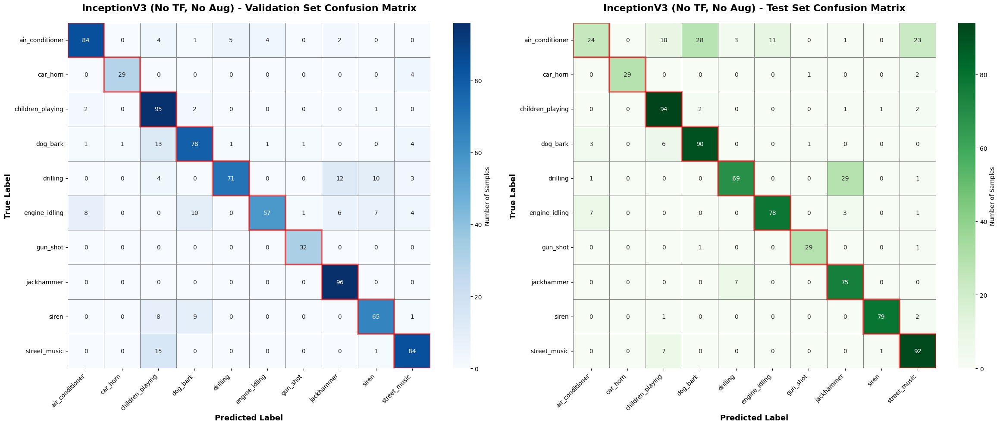


INCEPTIONV3 (NO TF, NO AUG) - CONFUSION MATRIX RESULTS
Validation Accuracy: 82.56%
Test Accuracy: 80.76%


In [88]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import torch
import torch.nn.functional as F

# Reinitialize the InceptionV3 model architecture
from torchvision.models import inception_v3
inception_v3_model_noTF_noAug = inception_v3(weights=None, aux_logits=True)
num_ftrs = inception_v3_model_noTF_noAug.fc.in_features
inception_v3_model_noTF_noAug.fc = nn.Linear(num_ftrs, 10)
num_aux_ftrs = inception_v3_model_noTF_noAug.AuxLogits.fc.in_features
inception_v3_model_noTF_noAug.AuxLogits.fc = nn.Linear(num_aux_ftrs, 10)

# Load the best saved model
inception_v3_model_noTF_noAug.load_state_dict(torch.load('Models/inception_v3_noTF_noAug.pth'))
inception_v3_model_noTF_noAug = inception_v3_model_noTF_noAug.to(device)
inception_v3_model_noTF_noAug.eval()

# Function to get predictions for InceptionV3
def get_predictions(X_data, model, device, batch_size=32):
    y_pred_list = []
    with torch.no_grad():
        # Convert data to tensor if not already
        if not isinstance(X_data, torch.Tensor):
            X_tensor = torch.FloatTensor(X_data).permute(0, 3, 1, 2)
        else:
            X_tensor = X_data
        
        # Convert 1-channel to 3-channel and resize to 299x299 for InceptionV3
        X_tensor = X_tensor.repeat(1, 3, 1, 1)
        X_tensor = F.interpolate(X_tensor, size=(299, 299), mode='bilinear', align_corners=False)
        
        # Move to device
        X_tensor = X_tensor.to(device)
        
        # Get predictions in batches to avoid memory issues
        for i in range(0, len(X_tensor), batch_size):
            batch = X_tensor[i:i+batch_size]
            outputs = model(batch)
            _, predicted = torch.max(outputs, 1)
            y_pred_list.extend(predicted.cpu().numpy())
    
    return np.array(y_pred_list)

# Get predictions for validation set
y_pred_val = get_predictions(X_val, inception_v3_model_noTF_noAug, device)

# Get predictions for test set
y_pred_test = get_predictions(X_test, inception_v3_model_noTF_noAug, device)

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Create confusion matrices
cm_val = confusion_matrix(y_val, y_pred_val)
cm_test = confusion_matrix(y_test, y_pred_test)

# Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Plot validation confusion matrix
sns.heatmap(cm_val, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[0])

axes[0].set_title('InceptionV3 (No TF, No Aug) - Validation Set Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[0].set_xticklabels(class_names, rotation=45, ha='right')
axes[0].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for validation
for i in range(len(class_names)):
    axes[0].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

# Plot test confusion matrix
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Greens', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[1])

axes[1].set_title('InceptionV3 (No TF, No Aug) - Test Set Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[1].set_xticklabels(class_names, rotation=45, ha='right')
axes[1].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for test
for i in range(len(class_names)):
    axes[1].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

plt.tight_layout()
plt.show()

# Print accuracy for both sets
val_accuracy = np.trace(cm_val) / np.sum(cm_val) * 100
test_accuracy = np.trace(cm_test) / np.sum(cm_test) * 100

print("\n" + "=" * 60)
print("INCEPTIONV3 (NO TF, NO AUG) - CONFUSION MATRIX RESULTS")
print("=" * 60)
print(f"Validation Accuracy: {val_accuracy:.2f}%")
print(f"Test Accuracy: {test_accuracy:.2f}%")
print("=" * 60)

- **Most confused class pairs**

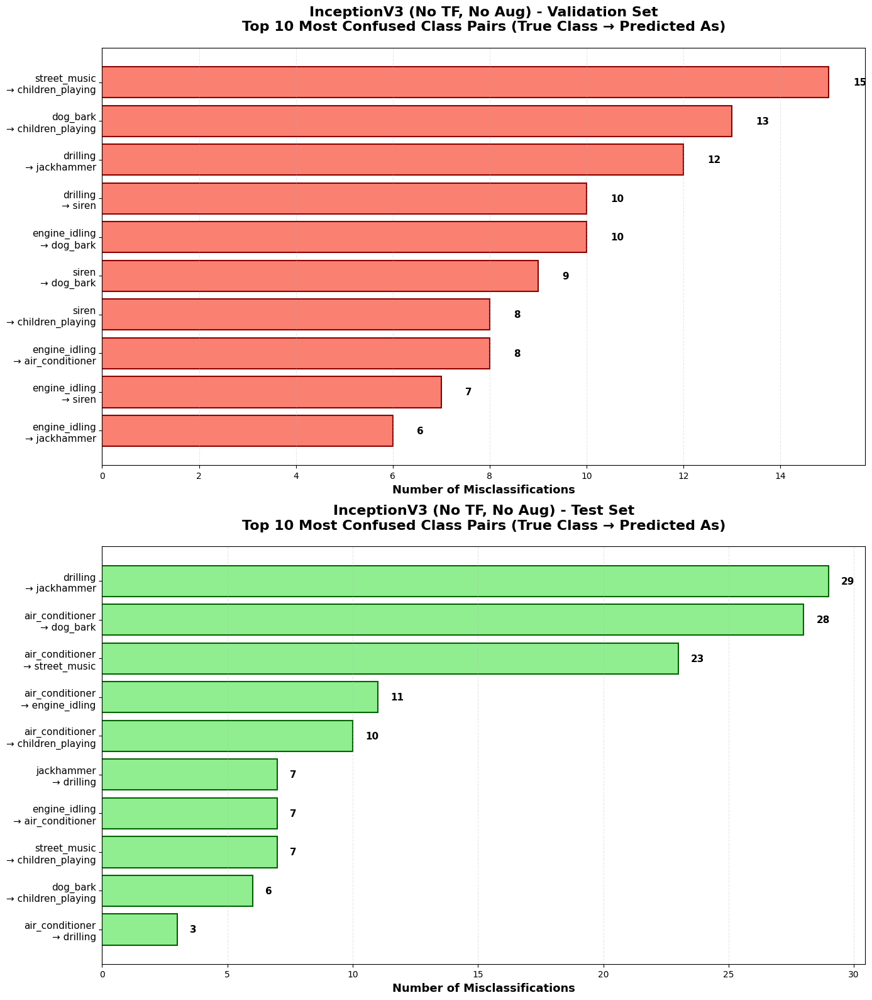

In [85]:
import torch.nn as nn

# Function to analyze confused pairs
def analyze_confused_pairs(cm, class_names):
    confused_pairs = []
    for i in range(len(cm)):
        for j in range(len(cm)):
            if i != j and cm[i, j] > 0:
                confused_pairs.append({
                    'true_class': class_names[i],
                    'predicted_as': class_names[j],
                    'count': cm[i, j]
                })
    
    confused_df = pd.DataFrame(confused_pairs)
    confused_df = confused_df.sort_values('count', ascending=False)
    return confused_df

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Analyze both validation and test sets
confused_df_val = analyze_confused_pairs(cm_val, class_names)
confused_df_test = analyze_confused_pairs(cm_test, class_names)

# Create figure with two subplots (validation on top, test on bottom)
fig, axes = plt.subplots(2, 1, figsize=(14, 16))

# Plot validation set (top)
top_n_val = min(10, len(confused_df_val))
top_confused_val = confused_df_val.head(top_n_val)

bars_val = axes[0].barh(range(top_n_val), top_confused_val['count'].values, 
                        color='salmon', edgecolor='darkred', linewidth=1.5)

labels_val = [f"{row['true_class']}\n→ {row['predicted_as']}" 
              for _, row in top_confused_val.iterrows()]
axes[0].set_yticks(range(top_n_val))
axes[0].set_yticklabels(labels_val, fontsize=11)

for i, (idx, row) in enumerate(top_confused_val.iterrows()):
    axes[0].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[0].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[0].set_title('InceptionV3 (No TF, No Aug) - Validation Set\nTop 10 Most Confused Class Pairs (True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].grid(axis='x', alpha=0.3, linestyle='--')
axes[0].invert_yaxis()

# Plot test set (bottom)
top_n_test = min(10, len(confused_df_test))
top_confused_test = confused_df_test.head(top_n_test)

bars_test = axes[1].barh(range(top_n_test), top_confused_test['count'].values, 
                         color='lightgreen', edgecolor='darkgreen', linewidth=1.5)

labels_test = [f"{row['true_class']}\n→ {row['predicted_as']}" 
               for _, row in top_confused_test.iterrows()]
axes[1].set_yticks(range(top_n_test))
axes[1].set_yticklabels(labels_test, fontsize=11)

for i, (idx, row) in enumerate(top_confused_test.iterrows()):
    axes[1].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[1].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[1].set_title('InceptionV3 (No TF, No Aug) - Test Set\nTop 10 Most Confused Class Pairs (True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].grid(axis='x', alpha=0.3, linestyle='--')
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()

- **Error Analysis per class**

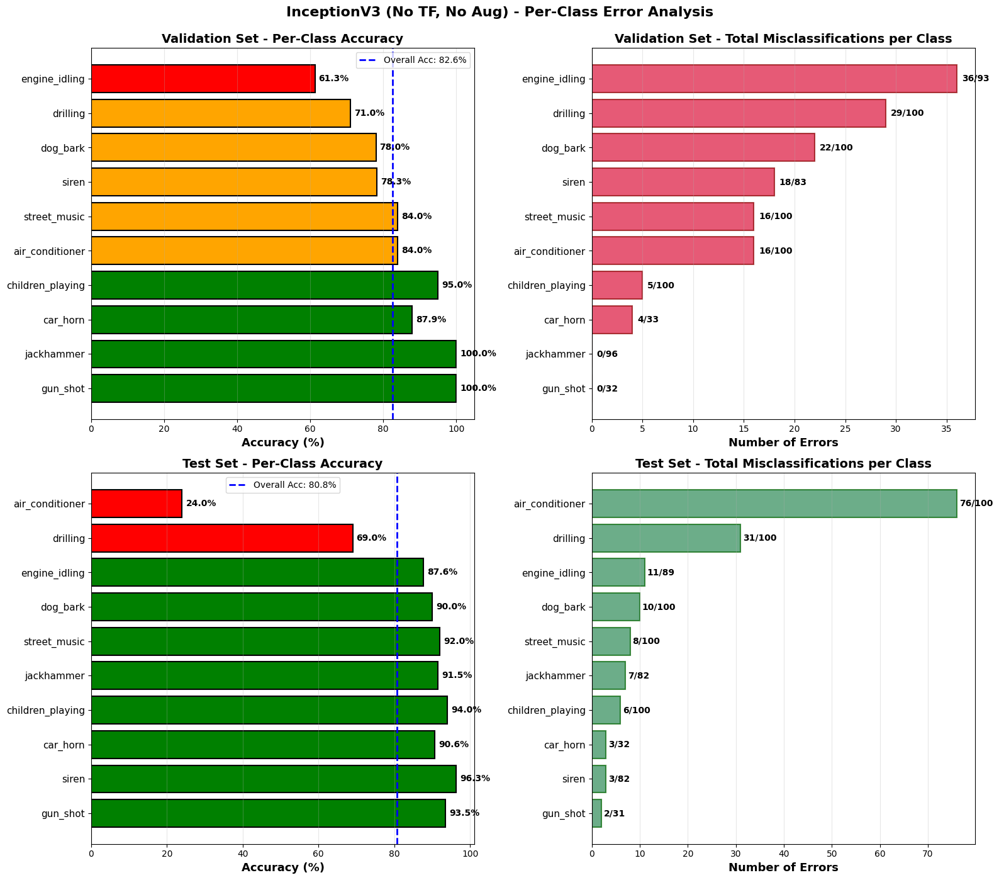


INCEPTIONV3 (NO TF, NO AUG) - VALIDATION SET - Per-Class Statistics:
           Class  Total  Correct  Errors  Accuracy
   engine_idling     93       57      36  0.612903
        drilling    100       71      29  0.710000
        dog_bark    100       78      22  0.780000
           siren     83       65      18  0.783133
    street_music    100       84      16  0.840000
 air_conditioner    100       84      16  0.840000
children_playing    100       95       5  0.950000
        car_horn     33       29       4  0.878788
      jackhammer     96       96       0  1.000000
        gun_shot     32       32       0  1.000000

INCEPTIONV3 (NO TF, NO AUG) - TEST SET - Per-Class Statistics:
           Class  Total  Correct  Errors  Accuracy
 air_conditioner    100       24      76  0.240000
        drilling    100       69      31  0.690000
   engine_idling     89       78      11  0.876404
        dog_bark    100       90      10  0.900000
    street_music    100       92       8  0.920000

In [87]:
# Function to calculate per-class metrics
def calculate_class_metrics(cm, class_names):
    class_correct = cm.diagonal()
    class_total = cm.sum(axis=1)
    class_errors = class_total - class_correct
    class_accuracy = class_correct / class_total
    
    error_analysis = pd.DataFrame({
        'Class': class_names,
        'Total': class_total,
        'Correct': class_correct,
        'Errors': class_errors,
        'Accuracy': class_accuracy
    })
    error_analysis = error_analysis.sort_values('Errors', ascending=False)
    return error_analysis

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Calculate metrics for both sets
error_analysis_val = calculate_class_metrics(cm_val, class_names)
error_analysis_test = calculate_class_metrics(cm_test, class_names)

# Calculate overall accuracies
val_overall_accuracy = np.trace(cm_val) / np.sum(cm_val)
test_overall_accuracy = np.trace(cm_test) / np.sum(cm_test)

# Create figure with 2 rows (validation top, test bottom)
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# ============= VALIDATION SET (Top Row) =============

# Validation - Accuracy by class
colors_val = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
              for acc in error_analysis_val['Accuracy']]
axes[0, 0].barh(range(len(error_analysis_val)), 
                error_analysis_val['Accuracy'] * 100, 
                color=colors_val, edgecolor='black', linewidth=1.5)
axes[0, 0].set_yticks(range(len(error_analysis_val)))
axes[0, 0].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[0, 0].set_title('Validation Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[0, 0].axvline(x=val_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {val_overall_accuracy*100:.1f}%')
axes[0, 0].legend()
axes[0, 0].grid(axis='x', alpha=0.3)
axes[0, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Validation - Number of errors by class
axes[0, 1].barh(range(len(error_analysis_val)), 
                error_analysis_val['Errors'], 
                color='crimson', edgecolor='darkred', linewidth=1.5, alpha=0.7)
axes[0, 1].set_yticks(range(len(error_analysis_val)))
axes[0, 1].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[0, 1].set_title('Validation Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[0, 1].grid(axis='x', alpha=0.3)
axes[0, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

# ============= TEST SET (Bottom Row) =============

# Test - Accuracy by class
colors_test = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
               for acc in error_analysis_test['Accuracy']]
axes[1, 0].barh(range(len(error_analysis_test)), 
                error_analysis_test['Accuracy'] * 100, 
                color=colors_test, edgecolor='black', linewidth=1.5)
axes[1, 0].set_yticks(range(len(error_analysis_test)))
axes[1, 0].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[1, 0].set_title('Test Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[1, 0].axvline(x=test_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {test_overall_accuracy*100:.1f}%')
axes[1, 0].legend()
axes[1, 0].grid(axis='x', alpha=0.3)
axes[1, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Test - Number of errors by class
axes[1, 1].barh(range(len(error_analysis_test)), 
                error_analysis_test['Errors'], 
                color='seagreen', edgecolor='darkgreen', linewidth=1.5, alpha=0.7)
axes[1, 1].set_yticks(range(len(error_analysis_test)))
axes[1, 1].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[1, 1].set_title('Test Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[1, 1].grid(axis='x', alpha=0.3)
axes[1, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

plt.suptitle('InceptionV3 (No TF, No Aug) - Per-Class Error Analysis', 
             fontsize=16, fontweight='bold', y=0.995)
             
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\n" + "="*70)
print("INCEPTIONV3 (NO TF, NO AUG) - VALIDATION SET - Per-Class Statistics:")
print("="*70)
print(error_analysis_val.to_string(index=False))

print("\n" + "="*70)
print("INCEPTIONV3 (NO TF, NO AUG) - TEST SET - Per-Class Statistics:")
print("="*70)
print(error_analysis_test.to_string(index=False))

-----------------------------------------------------------------------

### Inception model without pretrained weights

- **Confusion Matrix**

c:\Users\Hugo Duarte de Sousa\Desktop\Season 5\Aprendizagem Computacional II\Projeto\.venv\Lib\site-packages\torchvision\models\inception.py:43: FutureWarning: The default weight initialization of inception_v3 will be changed in future releases of torchvision. If you wish to keep the old behavior (which leads to long initialization times due to scipy/scipy#11299), please set init_weights=True.
  warnings.warn(


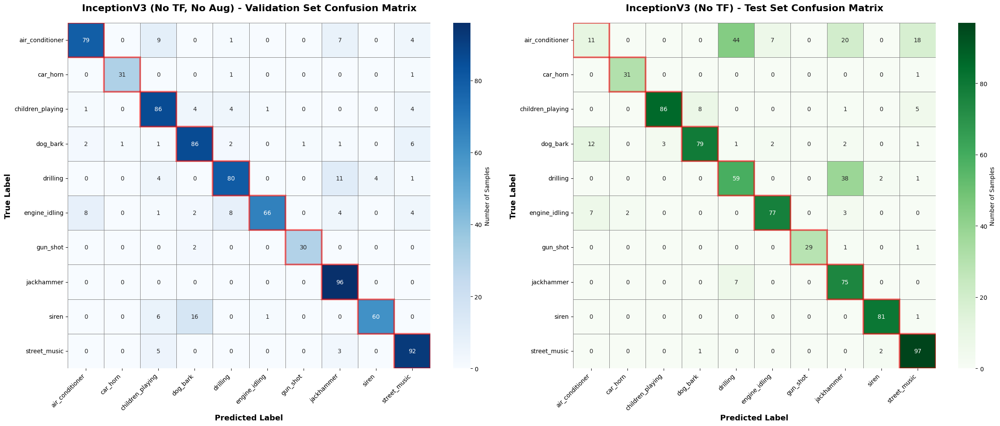


INCEPTIONV3 (NO TF) - CONFUSION MATRIX RESULTS
Validation Accuracy: 84.35%
Test Accuracy: 76.59%


In [105]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import torch
import torch.nn.functional as F

# Reinitialize the InceptionV3 model architecture
from torchvision.models import inception_v3
inception_v3_model_noTF_noAug = inception_v3(weights=None, aux_logits=True)
num_ftrs = inception_v3_model_noTF_noAug.fc.in_features
inception_v3_model_noTF_noAug.fc = nn.Linear(num_ftrs, 10)
num_aux_ftrs = inception_v3_model_noTF_noAug.AuxLogits.fc.in_features
inception_v3_model_noTF_noAug.AuxLogits.fc = nn.Linear(num_aux_ftrs, 10)

# Load the best saved model
inception_v3_model_noTF_noAug.load_state_dict(torch.load('Models/inception_v3_noTF.pth'))
inception_v3_model_noTF_noAug = inception_v3_model_noTF_noAug.to(device)
inception_v3_model_noTF_noAug.eval()

# Function to get predictions for InceptionV3
def get_predictions(X_data, model, device, batch_size=32):
    y_pred_list = []
    with torch.no_grad():
        # Convert data to tensor if not already
        if not isinstance(X_data, torch.Tensor):
            X_tensor = torch.FloatTensor(X_data).permute(0, 3, 1, 2)
        else:
            X_tensor = X_data
        
        # Convert 1-channel to 3-channel and resize to 299x299 for InceptionV3
        X_tensor = X_tensor.repeat(1, 3, 1, 1)
        X_tensor = F.interpolate(X_tensor, size=(299, 299), mode='bilinear', align_corners=False)
        
        # Move to device
        X_tensor = X_tensor.to(device)
        
        # Get predictions in batches to avoid memory issues
        for i in range(0, len(X_tensor), batch_size):
            batch = X_tensor[i:i+batch_size]
            outputs = model(batch)
            _, predicted = torch.max(outputs, 1)
            y_pred_list.extend(predicted.cpu().numpy())
    
    return np.array(y_pred_list)

# Get predictions for validation set
y_pred_val = get_predictions(X_val, inception_v3_model_noTF_noAug, device)

# Get predictions for test set
y_pred_test = get_predictions(X_test, inception_v3_model_noTF_noAug, device)

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Create confusion matrices
cm_val = confusion_matrix(y_val, y_pred_val)
cm_test = confusion_matrix(y_test, y_pred_test)

# Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Plot validation confusion matrix
sns.heatmap(cm_val, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[0])

axes[0].set_title('InceptionV3 (No TF, No Aug) - Validation Set Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[0].set_xticklabels(class_names, rotation=45, ha='right')
axes[0].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for validation
for i in range(len(class_names)):
    axes[0].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

# Plot test confusion matrix
sns.heatmap(cm_test, annot=True, fmt='d', cmap='Greens', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[1])

axes[1].set_title('InceptionV3 (No TF) - Test Set Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[1].set_xticklabels(class_names, rotation=45, ha='right')
axes[1].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for test
for i in range(len(class_names)):
    axes[1].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

plt.tight_layout()
plt.show()

# Print accuracy for both sets
val_accuracy = np.trace(cm_val) / np.sum(cm_val) * 100
test_accuracy = np.trace(cm_test) / np.sum(cm_test) * 100

print("\n" + "=" * 60)
print("INCEPTIONV3 (NO TF) - CONFUSION MATRIX RESULTS")
print("=" * 60)
print(f"Validation Accuracy: {val_accuracy:.2f}%")
print(f"Test Accuracy: {test_accuracy:.2f}%")
print("=" * 60)

- **Most confused class pairs**

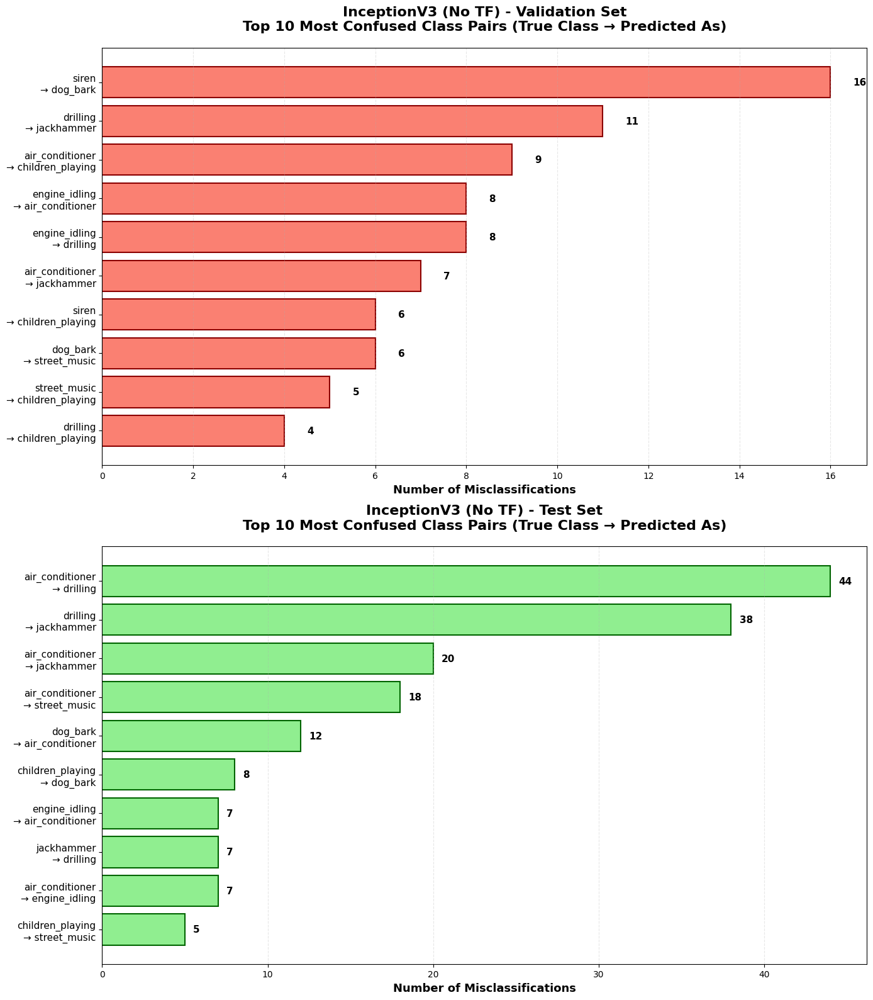

In [106]:
import torch.nn as nn

# Function to analyze confused pairs
def analyze_confused_pairs(cm, class_names):
    confused_pairs = []
    for i in range(len(cm)):
        for j in range(len(cm)):
            if i != j and cm[i, j] > 0:
                confused_pairs.append({
                    'true_class': class_names[i],
                    'predicted_as': class_names[j],
                    'count': cm[i, j]
                })
    
    confused_df = pd.DataFrame(confused_pairs)
    confused_df = confused_df.sort_values('count', ascending=False)
    return confused_df

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Analyze both validation and test sets
confused_df_val = analyze_confused_pairs(cm_val, class_names)
confused_df_test = analyze_confused_pairs(cm_test, class_names)

# Create figure with two subplots (validation on top, test on bottom)
fig, axes = plt.subplots(2, 1, figsize=(14, 16))

# Plot validation set (top)
top_n_val = min(10, len(confused_df_val))
top_confused_val = confused_df_val.head(top_n_val)

bars_val = axes[0].barh(range(top_n_val), top_confused_val['count'].values, 
                        color='salmon', edgecolor='darkred', linewidth=1.5)

labels_val = [f"{row['true_class']}\n→ {row['predicted_as']}" 
              for _, row in top_confused_val.iterrows()]
axes[0].set_yticks(range(top_n_val))
axes[0].set_yticklabels(labels_val, fontsize=11)

for i, (idx, row) in enumerate(top_confused_val.iterrows()):
    axes[0].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[0].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[0].set_title('InceptionV3 (No TF) - Validation Set\nTop 10 Most Confused Class Pairs (True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].grid(axis='x', alpha=0.3, linestyle='--')
axes[0].invert_yaxis()

# Plot test set (bottom)
top_n_test = min(10, len(confused_df_test))
top_confused_test = confused_df_test.head(top_n_test)

bars_test = axes[1].barh(range(top_n_test), top_confused_test['count'].values, 
                         color='lightgreen', edgecolor='darkgreen', linewidth=1.5)

labels_test = [f"{row['true_class']}\n→ {row['predicted_as']}" 
               for _, row in top_confused_test.iterrows()]
axes[1].set_yticks(range(top_n_test))
axes[1].set_yticklabels(labels_test, fontsize=11)

for i, (idx, row) in enumerate(top_confused_test.iterrows()):
    axes[1].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[1].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[1].set_title('InceptionV3 (No TF) - Test Set\nTop 10 Most Confused Class Pairs (True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].grid(axis='x', alpha=0.3, linestyle='--')
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()

- **Error Analysis per class**

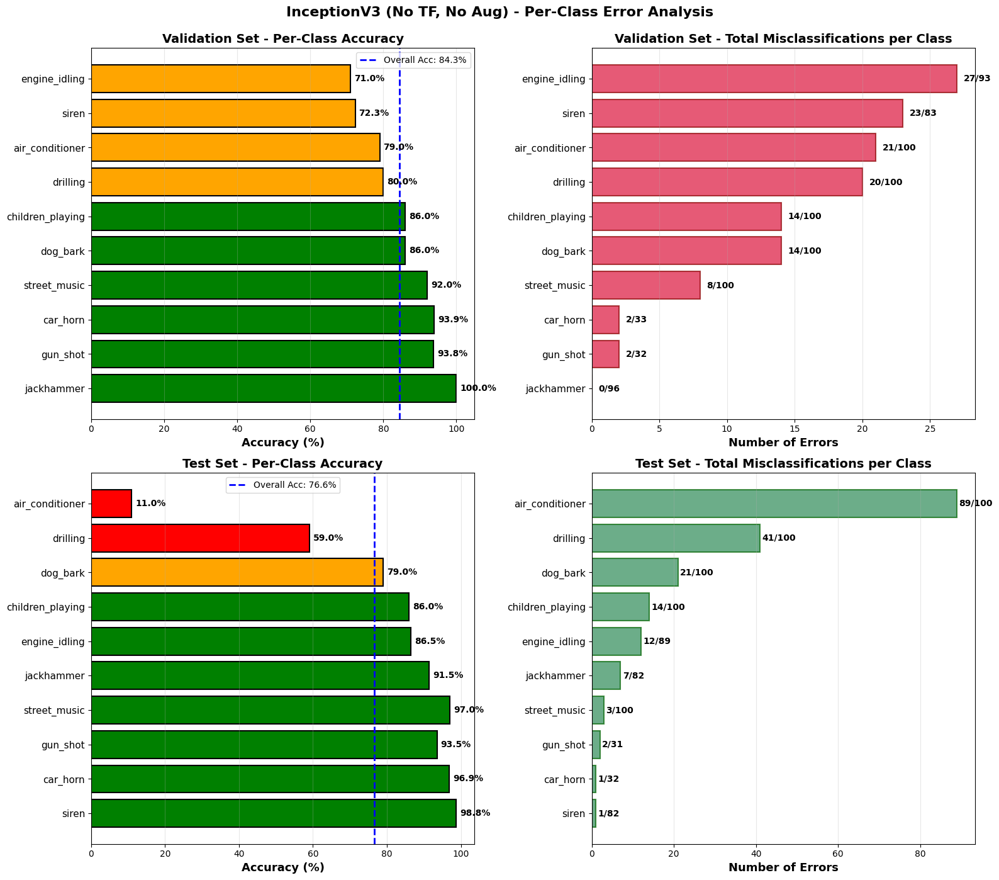


INCEPTIONV3 (NO TF) - VALIDATION SET - Per-Class Statistics:
           Class  Total  Correct  Errors  Accuracy
   engine_idling     93       66      27  0.709677
           siren     83       60      23  0.722892
 air_conditioner    100       79      21  0.790000
        drilling    100       80      20  0.800000
children_playing    100       86      14  0.860000
        dog_bark    100       86      14  0.860000
    street_music    100       92       8  0.920000
        car_horn     33       31       2  0.939394
        gun_shot     32       30       2  0.937500
      jackhammer     96       96       0  1.000000

INCEPTIONV3 (NO TF) - TEST SET - Per-Class Statistics:
           Class  Total  Correct  Errors  Accuracy
 air_conditioner    100       11      89  0.110000
        drilling    100       59      41  0.590000
        dog_bark    100       79      21  0.790000
children_playing    100       86      14  0.860000
   engine_idling     89       77      12  0.865169
      jackhamme

In [107]:
# Function to calculate per-class metrics
def calculate_class_metrics(cm, class_names):
    class_correct = cm.diagonal()
    class_total = cm.sum(axis=1)
    class_errors = class_total - class_correct
    class_accuracy = class_correct / class_total
    
    error_analysis = pd.DataFrame({
        'Class': class_names,
        'Total': class_total,
        'Correct': class_correct,
        'Errors': class_errors,
        'Accuracy': class_accuracy
    })
    error_analysis = error_analysis.sort_values('Errors', ascending=False)
    return error_analysis

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Calculate metrics for both sets
error_analysis_val = calculate_class_metrics(cm_val, class_names)
error_analysis_test = calculate_class_metrics(cm_test, class_names)

# Calculate overall accuracies
val_overall_accuracy = np.trace(cm_val) / np.sum(cm_val)
test_overall_accuracy = np.trace(cm_test) / np.sum(cm_test)

# Create figure with 2 rows (validation top, test bottom)
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# ============= VALIDATION SET (Top Row) =============

# Validation - Accuracy by class
colors_val = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
              for acc in error_analysis_val['Accuracy']]
axes[0, 0].barh(range(len(error_analysis_val)), 
                error_analysis_val['Accuracy'] * 100, 
                color=colors_val, edgecolor='black', linewidth=1.5)
axes[0, 0].set_yticks(range(len(error_analysis_val)))
axes[0, 0].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[0, 0].set_title('Validation Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[0, 0].axvline(x=val_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {val_overall_accuracy*100:.1f}%')
axes[0, 0].legend()
axes[0, 0].grid(axis='x', alpha=0.3)
axes[0, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Validation - Number of errors by class
axes[0, 1].barh(range(len(error_analysis_val)), 
                error_analysis_val['Errors'], 
                color='crimson', edgecolor='darkred', linewidth=1.5, alpha=0.7)
axes[0, 1].set_yticks(range(len(error_analysis_val)))
axes[0, 1].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[0, 1].set_title('Validation Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[0, 1].grid(axis='x', alpha=0.3)
axes[0, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

# ============= TEST SET (Bottom Row) =============

# Test - Accuracy by class
colors_test = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
               for acc in error_analysis_test['Accuracy']]
axes[1, 0].barh(range(len(error_analysis_test)), 
                error_analysis_test['Accuracy'] * 100, 
                color=colors_test, edgecolor='black', linewidth=1.5)
axes[1, 0].set_yticks(range(len(error_analysis_test)))
axes[1, 0].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[1, 0].set_title('Test Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[1, 0].axvline(x=test_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {test_overall_accuracy*100:.1f}%')
axes[1, 0].legend()
axes[1, 0].grid(axis='x', alpha=0.3)
axes[1, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Test - Number of errors by class
axes[1, 1].barh(range(len(error_analysis_test)), 
                error_analysis_test['Errors'], 
                color='seagreen', edgecolor='darkgreen', linewidth=1.5, alpha=0.7)
axes[1, 1].set_yticks(range(len(error_analysis_test)))
axes[1, 1].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[1, 1].set_title('Test Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[1, 1].grid(axis='x', alpha=0.3)
axes[1, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

plt.suptitle('InceptionV3 (No TF, No Aug) - Per-Class Error Analysis', 
             fontsize=16, fontweight='bold', y=0.995)
             
plt.tight_layout()
plt.show()

# Print detailed statistics
print("\n" + "="*70)
print("INCEPTIONV3 (NO TF) - VALIDATION SET - Per-Class Statistics:")
print("="*70)
print(error_analysis_val.to_string(index=False))

print("\n" + "="*70)
print("INCEPTIONV3 (NO TF) - TEST SET - Per-Class Statistics:")
print("="*70)
print(error_analysis_test.to_string(index=False))

---------------------------------------------

### Inception model with transfer learning

- **Confusion Matrix**

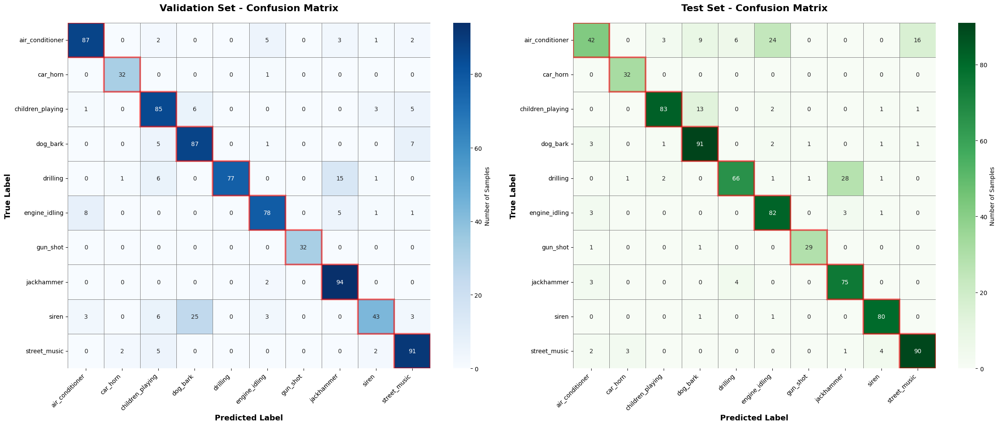

Validation Accuracy: 84.35%
Test Accuracy: 82.11%


In [108]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sns
import torch

# Set model to evaluation mode
inception_v3_model.eval()

# Function to get predictions
def get_predictions(X_data, model, device, batch_size=32):
    y_pred_list = []
    with torch.no_grad():
        # Convert data to tensor if not already
        if not isinstance(X_data, torch.Tensor):
            X_tensor = torch.FloatTensor(X_data).permute(0, 3, 1, 2)
        else:
            X_tensor = X_data
        
        # Move to device
        X_tensor = X_tensor.to(device)
        
        # Get predictions in batches to avoid memory issues
        for i in range(0, len(X_tensor), batch_size):
            batch = X_tensor[i:i+batch_size]
            outputs = model(batch)
            _, predicted = torch.max(outputs, 1)
            y_pred_list.extend(predicted.cpu().numpy())
    
    return np.array(y_pred_list)

# Get predictions for validation set
y_pred_val = get_predictions(X_val, inception_v3_model, device)

# Get predictions for test set
y_pred_test = get_predictions(X_test, inception_v3_model, device)

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Create confusion matrices
ic_val = confusion_matrix(y_val, y_pred_val)
ic_test = confusion_matrix(y_test, y_pred_test)

# Create side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Plot validation confusion matrix
sns.heatmap(ic_val, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[0])

axes[0].set_title('Validation Set - Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[0].set_xticklabels(class_names, rotation=45, ha='right')
axes[0].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for validation
for i in range(len(class_names)):
    axes[0].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

# Plot test confusion matrix
sns.heatmap(ic_test, annot=True, fmt='d', cmap='Greens', 
            xticklabels=class_names, 
            yticklabels=class_names,
            cbar_kws={'label': 'Number of Samples'},
            linewidths=0.5,
            linecolor='gray',
            ax=axes[1])

axes[1].set_title('Test Set - Confusion Matrix', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].set_ylabel('True Label', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
axes[1].set_xticklabels(class_names, rotation=45, ha='right')
axes[1].set_yticklabels(class_names, rotation=0)

# Highlight diagonal for test
for i in range(len(class_names)):
    axes[1].add_patch(plt.Rectangle((i, i), 1, 1, 
                                    fill=False, edgecolor='red', 
                                    lw=3, alpha=0.5))

plt.tight_layout()
plt.show()

# Optional: Print accuracy for both sets
inception_val_accuracy = np.trace(ic_val) / np.sum(ic_val) * 100
inception_test_accuracy = np.trace(ic_test) / np.sum(ic_test) * 100

print(f"Validation Accuracy: {inception_val_accuracy:.2f}%")
print(f"Test Accuracy: {inception_test_accuracy:.2f}%")

- **Most confused class pairs**

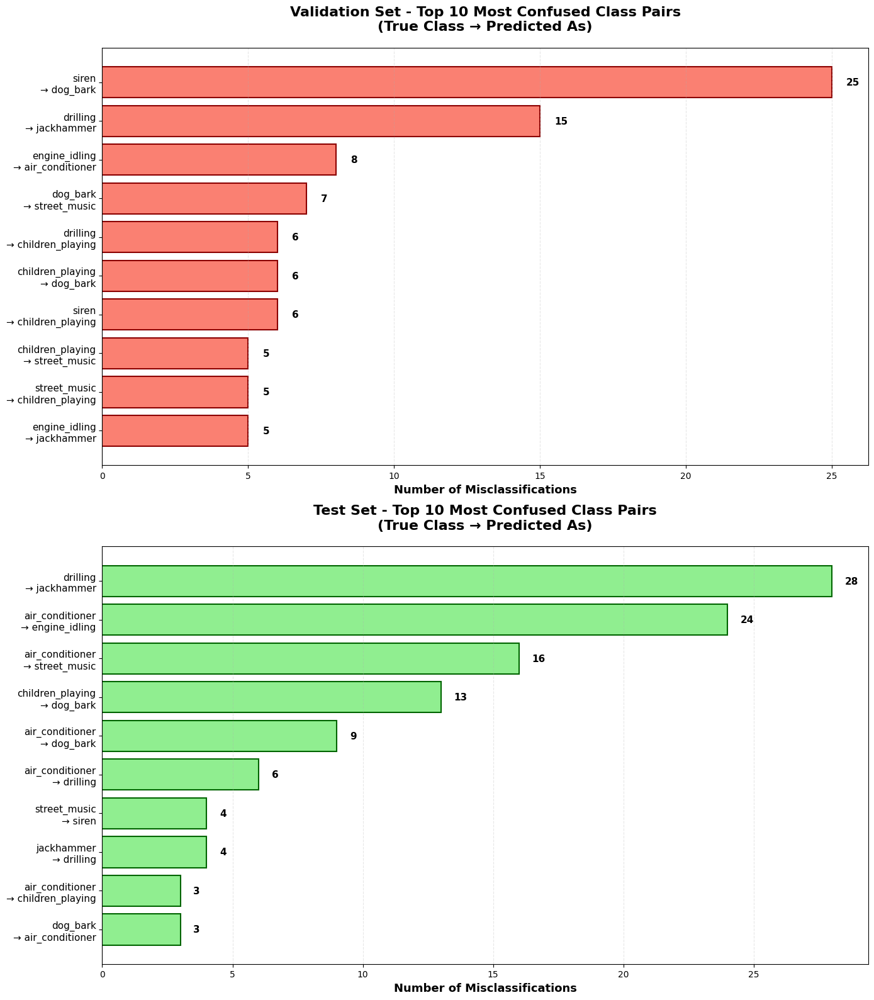

In [109]:
# Function to analyze confused pairs
def analyze_confused_pairs(cm, class_names):
    confused_pairs = []
    for i in range(len(cm)):
        for j in range(len(cm)):
            if i != j and cm[i, j] > 0:
                confused_pairs.append({
                    'true_class': class_names[i],
                    'predicted_as': class_names[j],
                    'count': cm[i, j]
                })
    
    confused_df = pd.DataFrame(confused_pairs)
    confused_df = confused_df.sort_values('count', ascending=False)
    return confused_df

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Analyze both validation and test sets
confused_df_val = analyze_confused_pairs(ic_val, class_names)
confused_df_test = analyze_confused_pairs(ic_test, class_names)

# Create figure with two subplots (validation on top, test on bottom)
fig, axes = plt.subplots(2, 1, figsize=(14, 16))

# Plot validation set (top)
top_n_val = min(10, len(confused_df_val))
top_confused_val = confused_df_val.head(top_n_val)

bars_val = axes[0].barh(range(top_n_val), top_confused_val['count'].values, 
                        color='salmon', edgecolor='darkred', linewidth=1.5)

labels_val = [f"{row['true_class']}\n→ {row['predicted_as']}" 
              for _, row in top_confused_val.iterrows()]
axes[0].set_yticks(range(top_n_val))
axes[0].set_yticklabels(labels_val, fontsize=11)

for i, (idx, row) in enumerate(top_confused_val.iterrows()):
    axes[0].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[0].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[0].set_title('Validation Set - Top 10 Most Confused Class Pairs\n(True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[0].grid(axis='x', alpha=0.3, linestyle='--')
axes[0].invert_yaxis()

# Plot test set (bottom)
top_n_test = min(10, len(confused_df_test))
top_confused_test = confused_df_test.head(top_n_test)

bars_test = axes[1].barh(range(top_n_test), top_confused_test['count'].values, 
                         color='lightgreen', edgecolor='darkgreen', linewidth=1.5)

labels_test = [f"{row['true_class']}\n→ {row['predicted_as']}" 
               for _, row in top_confused_test.iterrows()]
axes[1].set_yticks(range(top_n_test))
axes[1].set_yticklabels(labels_test, fontsize=11)

for i, (idx, row) in enumerate(top_confused_test.iterrows()):
    axes[1].text(row['count'] + 0.5, i, f"{int(row['count'])}", 
                 va='center', fontsize=11, fontweight='bold')

axes[1].set_xlabel('Number of Misclassifications', fontsize=13, fontweight='bold')
axes[1].set_title('Test Set - Top 10 Most Confused Class Pairs\n(True Class → Predicted As)', 
                  fontsize=16, fontweight='bold', pad=20)
axes[1].grid(axis='x', alpha=0.3, linestyle='--')
axes[1].invert_yaxis()

plt.tight_layout()
plt.show()


- **Error Analysis per class**

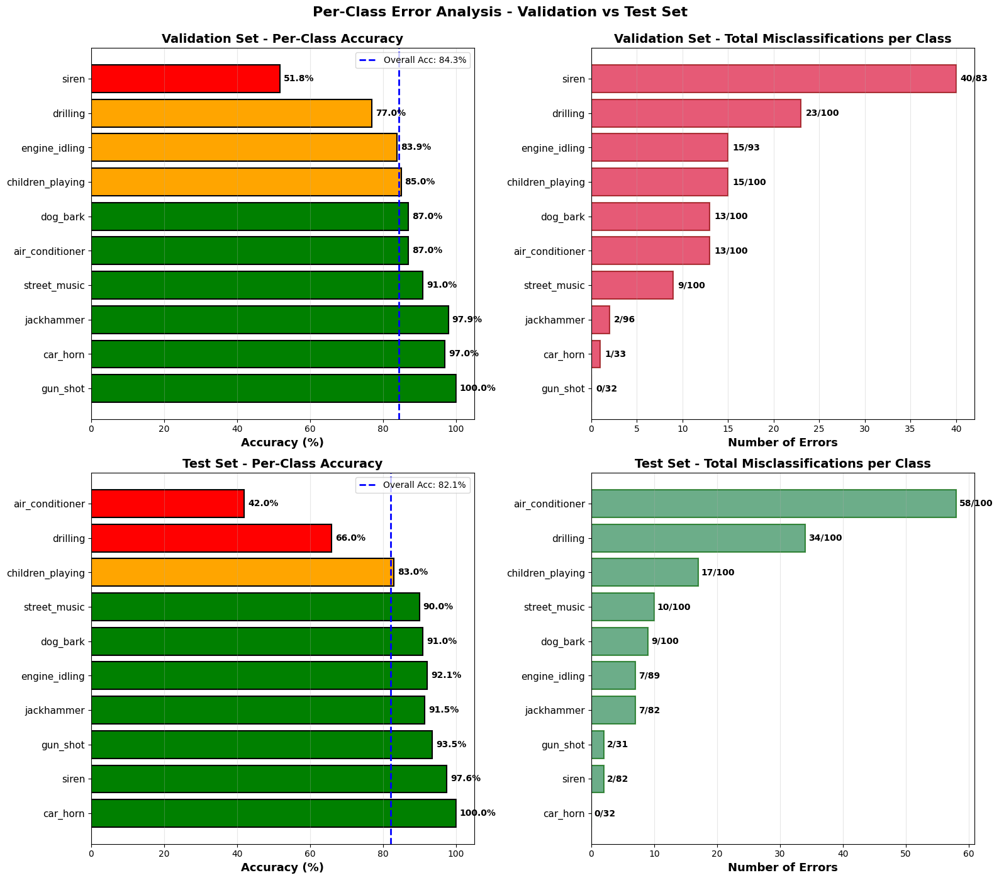

In [111]:
# Function to calculate per-class metrics
def calculate_class_metrics(cm, class_names):
    class_correct = cm.diagonal()
    class_total = cm.sum(axis=1)
    class_errors = class_total - class_correct
    class_accuracy = class_correct / class_total
    
    error_analysis = pd.DataFrame({
        'Class': class_names,
        'Total': class_total,
        'Correct': class_correct,
        'Errors': class_errors,
        'Accuracy': class_accuracy
    })
    error_analysis = error_analysis.sort_values('Errors', ascending=False)
    return error_analysis

# Class names for UrbanSound8K
class_names = [
    'air_conditioner',
    'car_horn',
    'children_playing',
    'dog_bark',
    'drilling',
    'engine_idling',
    'gun_shot',
    'jackhammer',
    'siren',
    'street_music'
]

# Calculate metrics for both sets
error_analysis_val = calculate_class_metrics(ic_val, class_names)
error_analysis_test = calculate_class_metrics(ic_test, class_names)

# Calculate overall accuracies
val_overall_accuracy = np.trace(ic_val) / np.sum(ic_val)
test_overall_accuracy = np.trace(ic_test) / np.sum(ic_test)

# Create figure with 2 rows (validation top, test bottom)
fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# ============= VALIDATION SET (Top Row) =============

# Validation - Accuracy by class
colors_val = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
              for acc in error_analysis_val['Accuracy']]
axes[0, 0].barh(range(len(error_analysis_val)), 
                error_analysis_val['Accuracy'] * 100, 
                color=colors_val, edgecolor='black', linewidth=1.5)
axes[0, 0].set_yticks(range(len(error_analysis_val)))
axes[0, 0].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[0, 0].set_title('Validation Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[0, 0].axvline(x=val_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {val_overall_accuracy*100:.1f}%')
axes[0, 0].legend()
axes[0, 0].grid(axis='x', alpha=0.3)
axes[0, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Validation - Number of errors by class
axes[0, 1].barh(range(len(error_analysis_val)), 
                error_analysis_val['Errors'], 
                color='crimson', edgecolor='darkred', linewidth=1.5, alpha=0.7)
axes[0, 1].set_yticks(range(len(error_analysis_val)))
axes[0, 1].set_yticklabels(error_analysis_val['Class'], fontsize=11)
axes[0, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[0, 1].set_title('Validation Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[0, 1].grid(axis='x', alpha=0.3)
axes[0, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_val.iterrows()):
    axes[0, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

# ============= TEST SET (Bottom Row) =============

# Test - Accuracy by class
colors_test = ['green' if acc > 0.85 else 'orange' if acc > 0.70 else 'red' 
               for acc in error_analysis_test['Accuracy']]
axes[1, 0].barh(range(len(error_analysis_test)), 
                error_analysis_test['Accuracy'] * 100, 
                color=colors_test, edgecolor='black', linewidth=1.5)
axes[1, 0].set_yticks(range(len(error_analysis_test)))
axes[1, 0].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 0].set_xlabel('Accuracy (%)', fontsize=13, fontweight='bold')
axes[1, 0].set_title('Test Set - Per-Class Accuracy', fontsize=14, fontweight='bold')
axes[1, 0].axvline(x=test_overall_accuracy*100, color='blue', linestyle='--', 
                   linewidth=2, label=f'Overall Acc: {test_overall_accuracy*100:.1f}%')
axes[1, 0].legend()
axes[1, 0].grid(axis='x', alpha=0.3)
axes[1, 0].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 0].text(row['Accuracy'] * 100 + 1, i, 
                    f"{row['Accuracy']*100:.1f}%", 
                    va='center', fontsize=10, fontweight='bold')

# Test - Number of errors by class
axes[1, 1].barh(range(len(error_analysis_test)), 
                error_analysis_test['Errors'], 
                color='seagreen', edgecolor='darkgreen', linewidth=1.5, alpha=0.7)
axes[1, 1].set_yticks(range(len(error_analysis_test)))
axes[1, 1].set_yticklabels(error_analysis_test['Class'], fontsize=11)
axes[1, 1].set_xlabel('Number of Errors', fontsize=13, fontweight='bold')
axes[1, 1].set_title('Test Set - Total Misclassifications per Class', 
                     fontsize=14, fontweight='bold')
axes[1, 1].grid(axis='x', alpha=0.3)
axes[1, 1].invert_yaxis()

for i, (_, row) in enumerate(error_analysis_test.iterrows()):
    axes[1, 1].text(row['Errors'] + 0.5, i, 
                    f"{int(row['Errors'])}/{int(row['Total'])}", 
                    va='center', fontsize=10, fontweight='bold')

plt.suptitle('Per-Class Error Analysis - Validation vs Test Set', 
             fontsize=16, fontweight='bold', y=0.995)
             
plt.tight_layout()
plt.show()